#Connecting Google Drive

In [ ]:
from google.colab import drive
import os
drive.mount('/content/drive/',force_remount=True)

In [ ]:
cd /content

## Installing required Libraries

In [ ]:
!pip install SimpleITK

     |████████████████████████████████| 47.4MB 62kB/s 


In [ ]:
import SimpleITK as sitk 
from tqdm import tqdm
import numpy as np
import os
import tables
import numpy as np
import nibabel as nib
from tqdm import tqdm
from glob import glob

# Reading the Brain Volume 

* Use the following code line to read the Flair Sequence
```
# modalities_dir = [ flair[0] ]
```
* Use the following code line to read the T1 Sequence
```
# modalities_dir = [ t1[0] ]
```

* Use the following code line to read the T1ce Sequence
```
# modalities_dir = [ t1ce[0] ]
```
* Use the following code line to read the T2 Sequence
```
# modalities_dir = [ t2[0] ]
```

In [ ]:
import os
import numpy as np
import nibabel as nib
from glob import glob
from tensorflow.keras.models import load_model

def read_brain(brain_dir):
   
    brain_dir = os.path.normpath(brain_dir)
    flair     = glob( os.path.join(brain_dir, '*_flair*.nii.gz'))
    t1        = glob( os.path.join(brain_dir, '*_t1*.nii.gz'))
    t1ce      = glob( os.path.join(brain_dir, '*_ce*.nii.gz'))
    t2        = glob( os.path.join(brain_dir, '*_t2*.nii.gz'))
    #gt        = glob( os.path.join(brain_dir, '*_seg*.nii.gz'))

    modalities_dir = [t2[0]]   
    
    all_modalities = []    
    for modality in modalities_dir: 
        print(modality)     
        nifti_file   = nib.load(modality)
        brain_numpy  = np.asarray(nifti_file.dataobj)    
        all_modalities.append(brain_numpy)
        
    # all modalities have the same affine, so we take one of them (the last one in this case),
    # affine is just saved for preparing the predicted nii.gz file in the future.       
    all_modalities = np.array(all_modalities)
    all_modalities = np.rint(all_modalities).astype(np.int16)
    # to fit keras channel last model
    all_modalities = np.transpose(all_modalities) 

    return all_modalities


if __name__ == '__main__':
       
    val_data_dir       = '/content/drive/MyDrive/Visualize/*'
    view               = 'axial'
     
    all_brains_dir = glob(val_data_dir)
    all_brains_dir.sort()
    
    if view == 'axial':
        view_axes = (0, 1, 2, 3)            
    elif view == 'sagittal': 
        view_axes = (2, 1, 0, 3)
    elif view == 'coronal':
        view_axes = (1, 2, 0, 3)            
    
    for brain_dir in all_brains_dir:    
        if os.path.isdir(brain_dir):
            print("Volume ID: ", os.path.basename(brain_dir))
            all_modalities = read_brain(brain_dir)
            all_modalities = all_modalities.transpose(view_axes)

Volume ID:  BraTS20_Training_115
/content/drive/MyDrive/Visualize/BraTS20_Training_115/BraTS20_Training_115_t2.nii.gz


# Reading the Ground Truth and Prediction
* Use the following code line to read the ground truth annotation
```
# modalities_dir = [ gt[0] ]
```
* Use the following code line to read the Prediction
```
# modalities_dir = [ pred[0] ]
```

In [ ]:
 import os
import numpy as np
import nibabel as nib
from glob import glob
from tensorflow.keras.models import load_model


def read_brain_pred(brain_dir):

    brain_dir = os.path.normpath(brain_dir)
    gt        = glob( os.path.join(brain_dir, '*_seg*.nii.gz'))
    pred      = glob( os.path.join(brain_dir, '*_pred*.nii.gz'))
    #modalities_dir = [flair[0], t1[0], t1ce[0], t2[0], gt[0]]
    #modalities_dir = [pred[0]]
    modalities_dir = [gt[0]]
  
    prediction = []    
    for i in modalities_dir:   
        print(i)   
        nifti_file   = nib.load(i)
        brain = np.asarray(nifti_file.dataobj)    
        prediction.append(brain)
        
    # all modalities have the same affine, so we take one of them (the last one in this case),
    # affine is just saved for preparing the predicted nii.gz file in the future.       
    prediction = np.array(prediction)
    prediction = np.rint(prediction).astype(np.int16)
    prediction = np.transpose(prediction) 

    return prediction

if __name__ == '__main__':
       
    val_data_dir       = '/content/drive/MyDrive/Visualize/*'
    view               = 'axial'

    all_brains_dir = glob(val_data_dir)
    all_brains_dir.sort()
    
    if view == 'axial':
        view_axes = (0, 1, 2, 3)            
    elif view == 'sagittal': 
        view_axes = (0, 2, 1, 3)
    elif view == 'coronal':
        view_axes = (1, 0, 2, 3)            
    else:
        ValueError('unknown input view => {}'.format(view))
    for brain_dir in all_brains_dir:    
        if os.path.isdir(brain_dir):
            print("Volume ID: ", os.path.basename(brain_dir))
            prediction = read_brain_pred(brain_dir)
            prediction = prediction.transpose(view_axes)


Volume ID:  BraTS20_Training_115
/content/drive/MyDrive/Visualize/BraTS20_Training_115/BraTS20_Training_115_seg.nii.gz


# Returning the overlapped region and 3D Brain MRI
* Use the following code line for overlapping the segmented region on to the brain MRI
```
# return img_masked
```
* Use the following code line to output 3d brain MRI
```
# return img_color
```

In [ ]:
from skimage import color, io, img_as_float
import numpy as np
import matplotlib.pyplot as plt
import numpy as np
alpha = 1.0

def show_segmented_image(brainMRI,Predicted):

    img = img_as_float(brainMRI)
    img_mask = Predicted
    #img_mask = GroundTruth
    img = img / np.max(img)
    rows, cols = img.shape
 
    # Construct a colour image to superimpose
    sliced_image = np.zeros((rows, cols, 3))

    ones = np.argwhere(img_mask == 1.0)
    twos = np.argwhere(img_mask == 2.0)
    fours = np.argwhere(img_mask == 4.0)

    for i in range(len(ones)):
        sliced_image[ones[i][0], ones[i][1]] = [1, 0, 0]
    for i in range(len(twos)):
        sliced_image[twos[i][0], twos[i][1]] = [0, 1, 0]   
    for i in range(len(fours)):
        sliced_image[fours[i][0], fours[i][1]] = [0, 0, 1]

    # Construct RGB version of grey-level image
    img_color = np.dstack((img, img, img))
    # Convert the input image and color mask to Hue Saturation Value (HSV)
    # colorspace
    img_hsv = color.rgb2hsv(img_color)
    color_mask_hsv = color.rgb2hsv(sliced_image)

    # Replace the hue and saturation of the original image
    # with that of the color mask
    img_hsv[..., 0] = color_mask_hsv[..., 0]
    img_hsv[..., 1] = color_mask_hsv[..., 1] * alpha

    img_masked = color.hsv2rgb(img_hsv)
    return img_color
   # io.imshow(img_masked)
    #plt.show()


# Saving the Visualizations of Coronal overlapped segmented regions

* Use the following code line for saving the overlapped ground truth region on the Coronal brain MRI Sequence
```
# brainMRI = all_modalitiesall_modalities[:, i, :, 0]
```
* Use the following code line for saving the overlapped predicted region on the Coronal brain MRI Sequence
```
# brainMRI = all_modalitiesall_modalities[:, i, :, 0]
# Predicted = predictionall_modalities[:, i, :, 0]
```

  

  

  

(155, 240)
(155, 240)


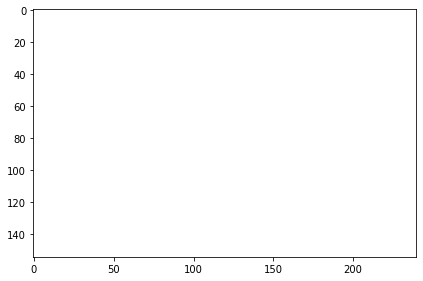

(155, 240)
(155, 240)


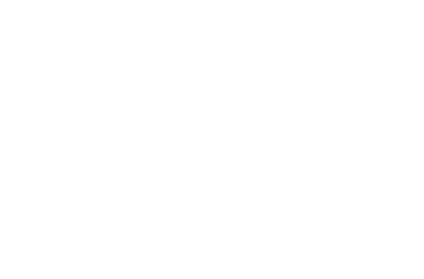

(155, 240)
(155, 240)


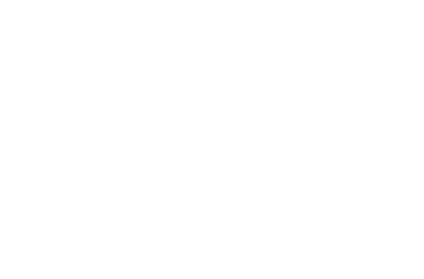

(155, 240)
(155, 240)


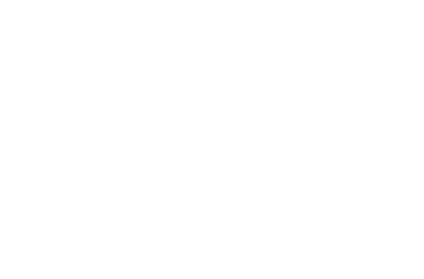

(155, 240)
(155, 240)


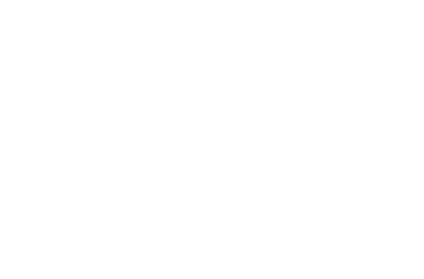

(155, 240)
(155, 240)


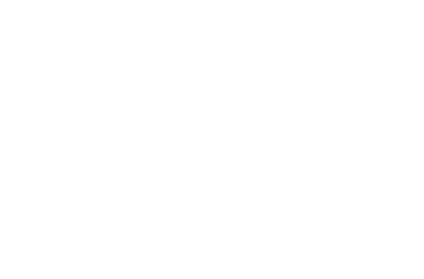

(155, 240)
(155, 240)


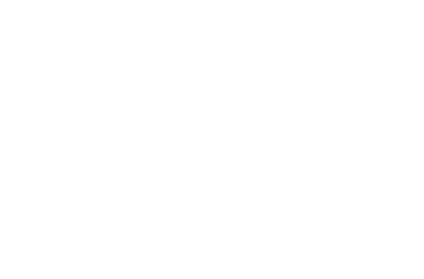

(155, 240)
(155, 240)


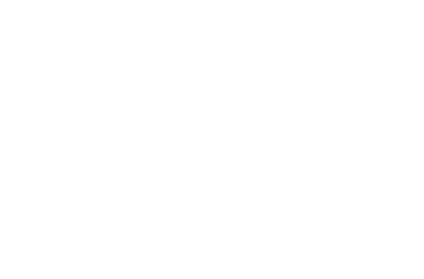

(155, 240)
(155, 240)


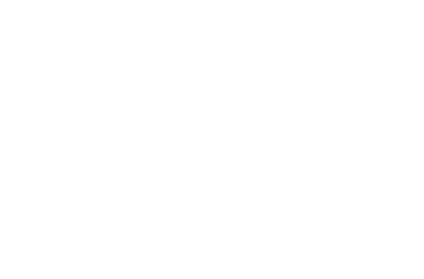

(155, 240)
(155, 240)


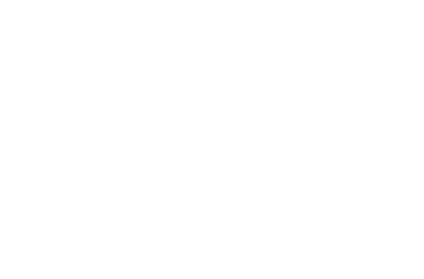

(155, 240)
(155, 240)


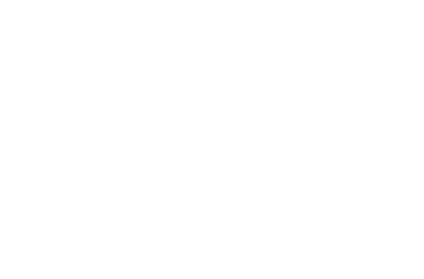

(155, 240)
(155, 240)


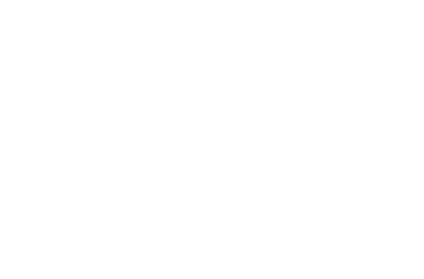

(155, 240)
(155, 240)


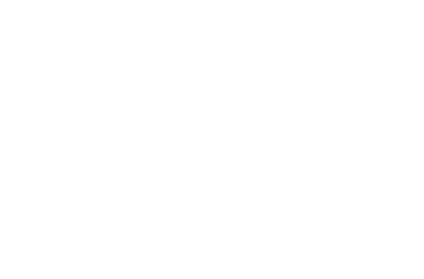

(155, 240)
(155, 240)


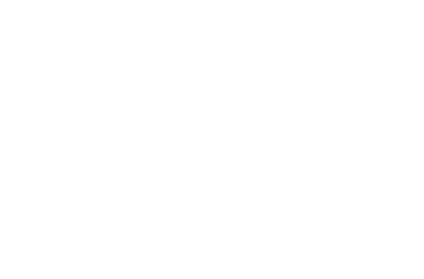

(155, 240)
(155, 240)


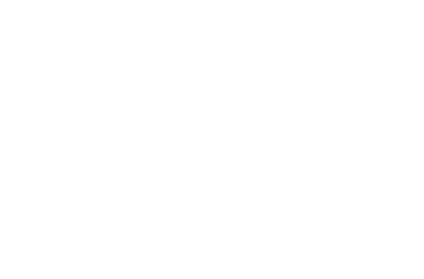

(155, 240)
(155, 240)


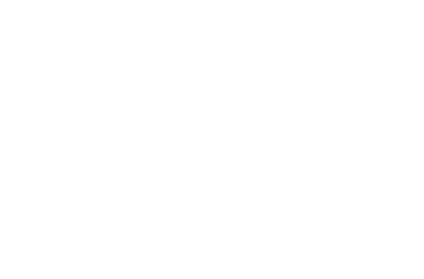

(155, 240)
(155, 240)


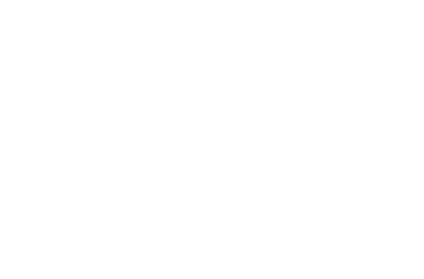

(155, 240)
(155, 240)


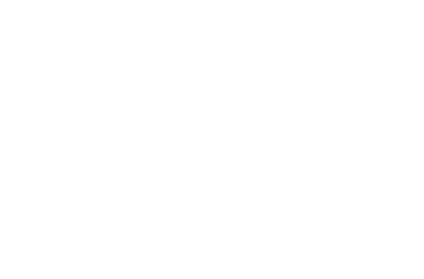

(155, 240)
(155, 240)


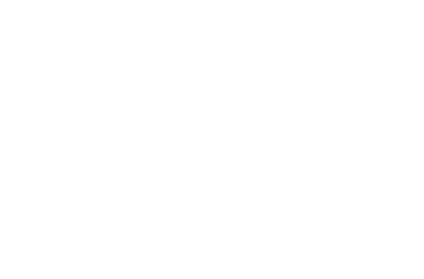

(155, 240)
(155, 240)


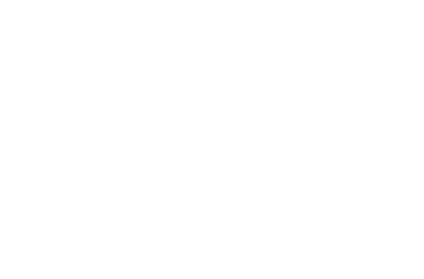

(155, 240)
(155, 240)


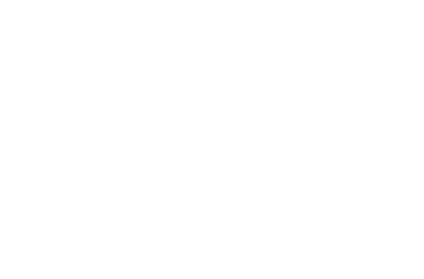

(155, 240)
(155, 240)


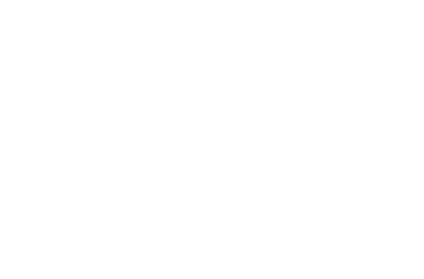

(155, 240)
(155, 240)


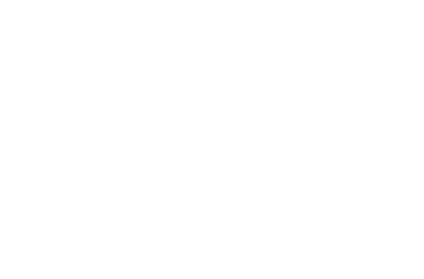

(155, 240)
(155, 240)


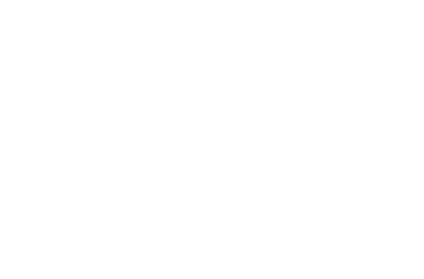

(155, 240)
(155, 240)


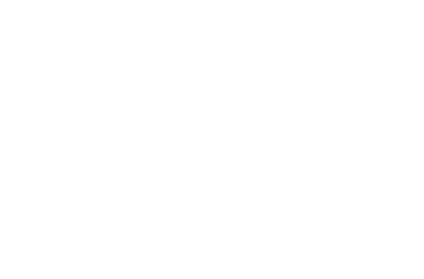

(155, 240)
(155, 240)


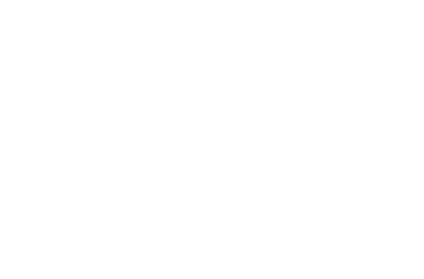

(155, 240)
(155, 240)


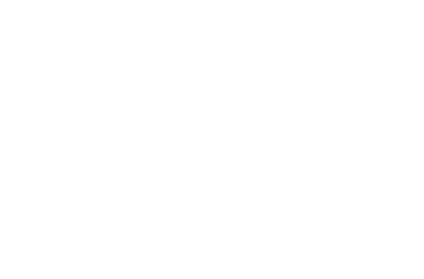

(155, 240)
(155, 240)


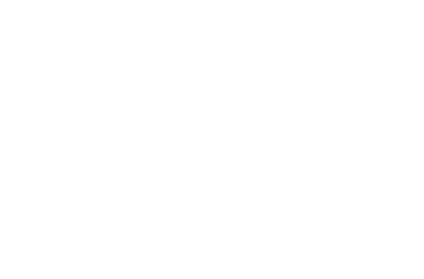

(155, 240)
(155, 240)


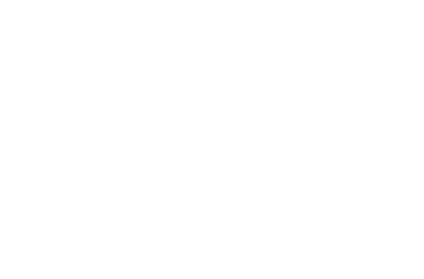

(155, 240)
(155, 240)


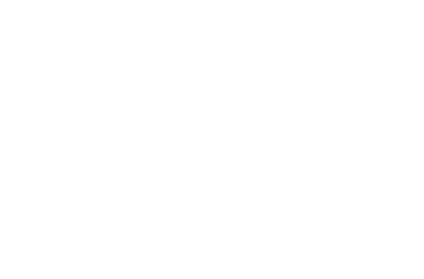

(155, 240)
(155, 240)


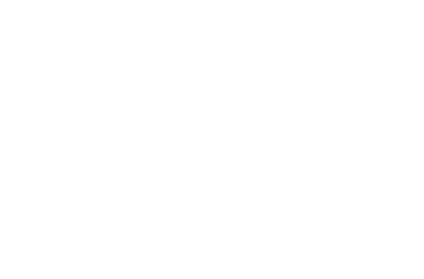

(155, 240)
(155, 240)


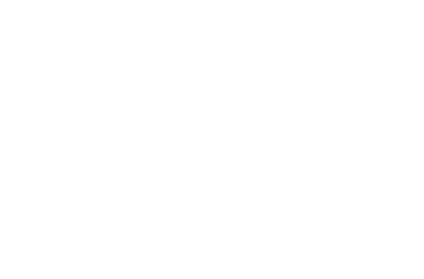

(155, 240)
(155, 240)


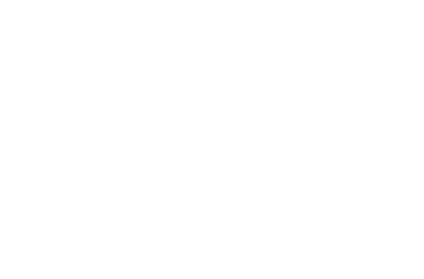

(155, 240)
(155, 240)


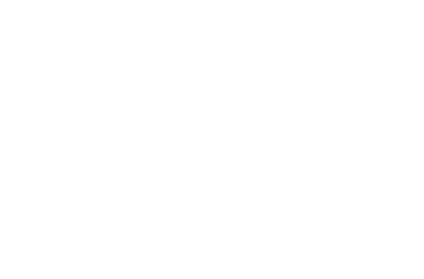

(155, 240)
(155, 240)


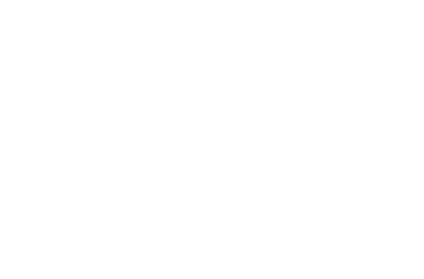

(155, 240)
(155, 240)


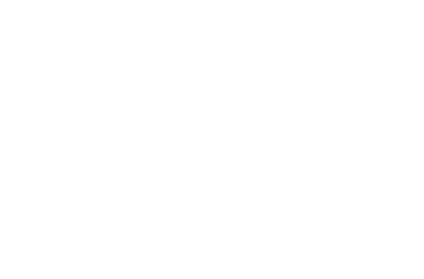

(155, 240)
(155, 240)


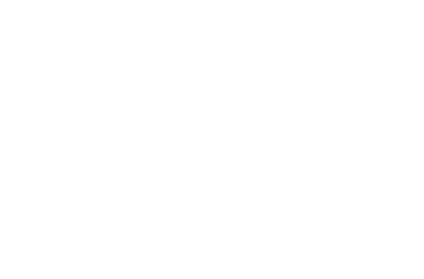

(155, 240)
(155, 240)


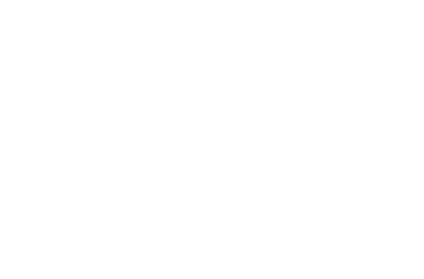

(155, 240)
(155, 240)


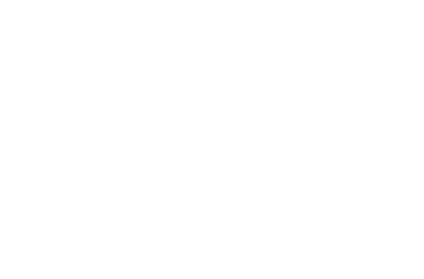

(155, 240)
(155, 240)


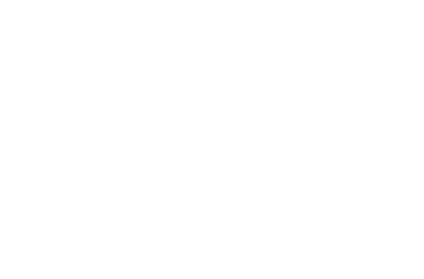

(155, 240)
(155, 240)


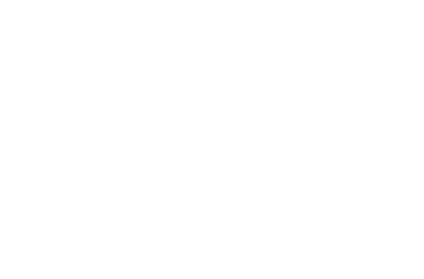

(155, 240)
(155, 240)


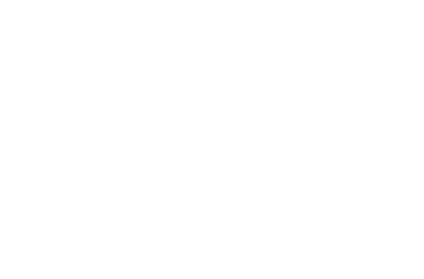

(155, 240)
(155, 240)


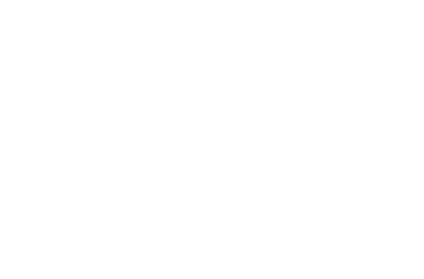

(155, 240)
(155, 240)


/usr/local/lib/python3.7/dist-packages/skimage/io/_plugins/matplotlib_plugin.py:150: UserWarning: Low image data range; displaying image with stretched contrast.
  lo, hi, cmap = _get_display_range(image)


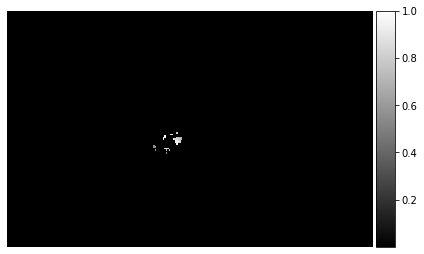

(155, 240)
(155, 240)


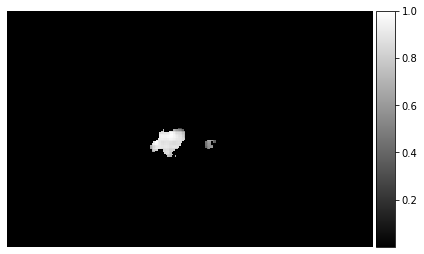

(155, 240)
(155, 240)


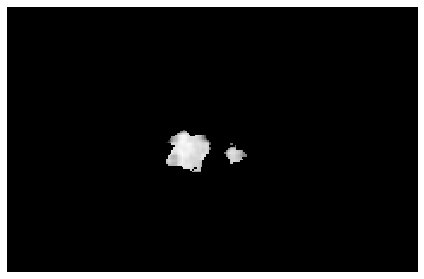

(155, 240)
(155, 240)


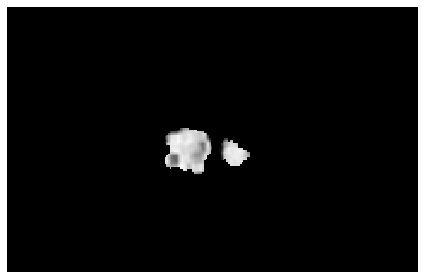

(155, 240)
(155, 240)


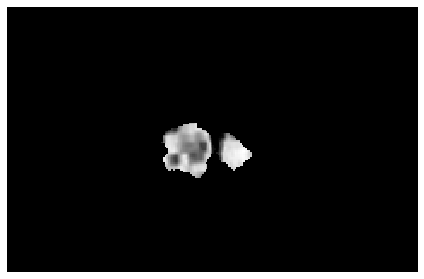

(155, 240)
(155, 240)


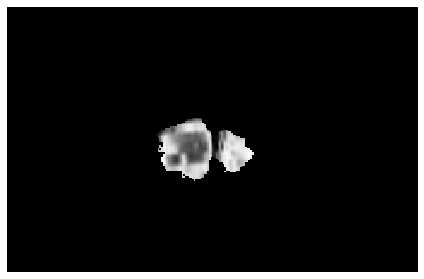

(155, 240)
(155, 240)


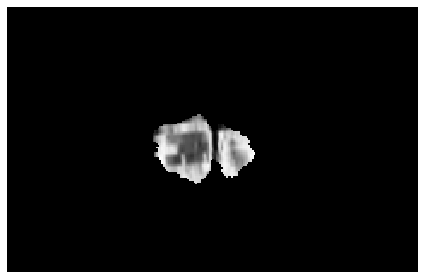

(155, 240)
(155, 240)


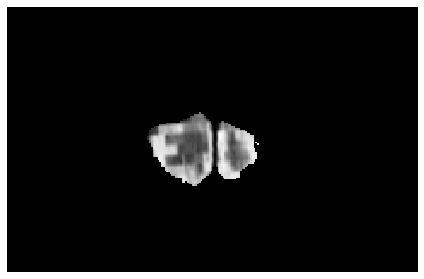

(155, 240)
(155, 240)


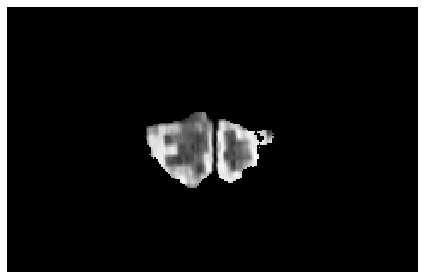

(155, 240)
(155, 240)


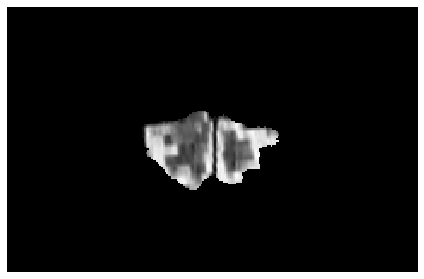

(155, 240)
(155, 240)


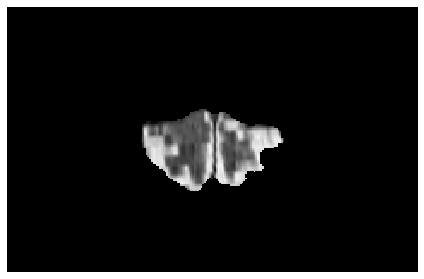

(155, 240)
(155, 240)


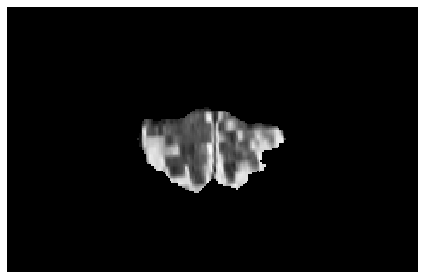

(155, 240)
(155, 240)


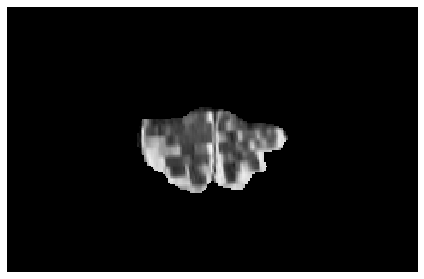

(155, 240)
(155, 240)


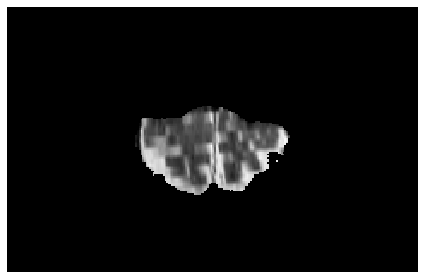

(155, 240)
(155, 240)


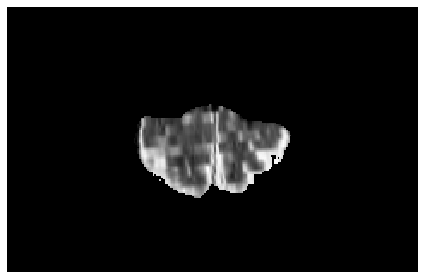

(155, 240)
(155, 240)


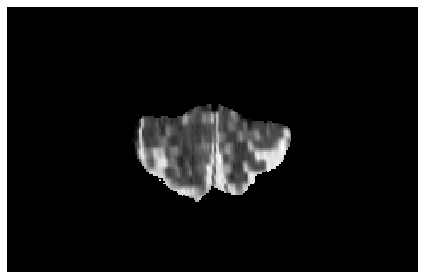

(155, 240)
(155, 240)


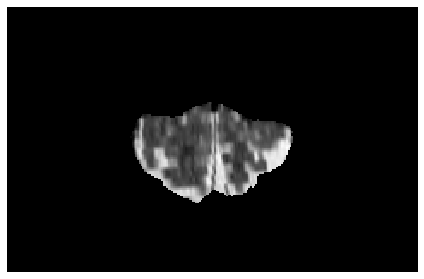

(155, 240)
(155, 240)


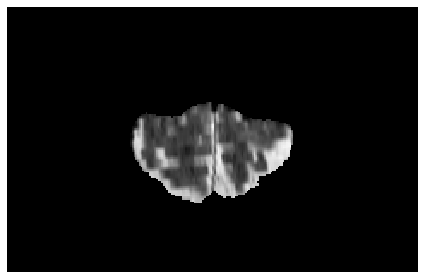

(155, 240)
(155, 240)


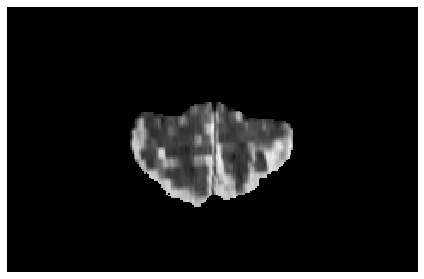

(155, 240)
(155, 240)


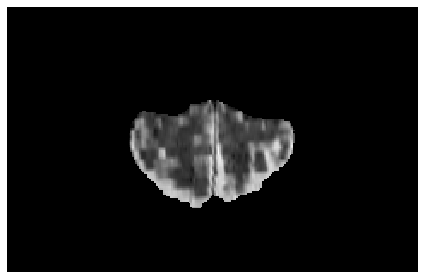

(155, 240)
(155, 240)


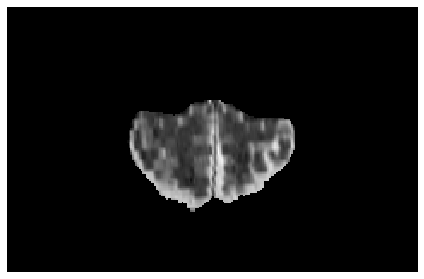

(155, 240)
(155, 240)


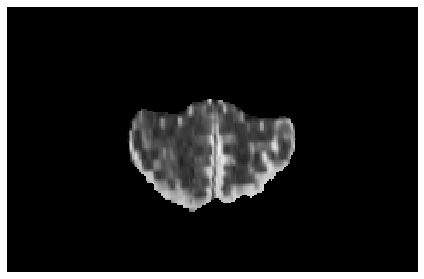

(155, 240)
(155, 240)


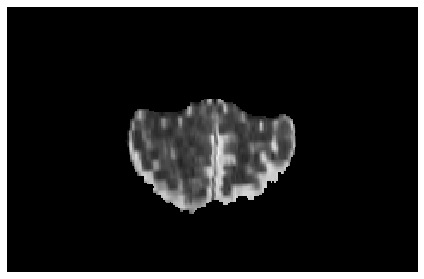

(155, 240)
(155, 240)


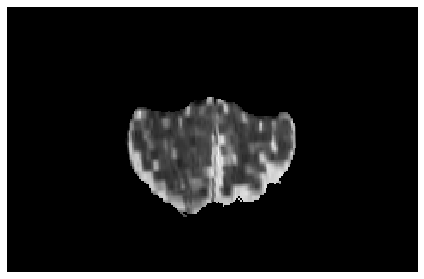

(155, 240)
(155, 240)


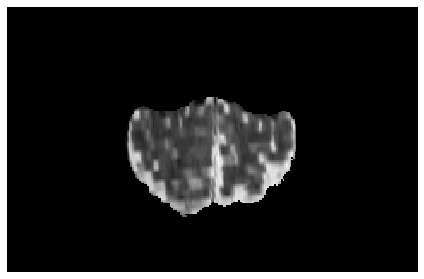

(155, 240)
(155, 240)


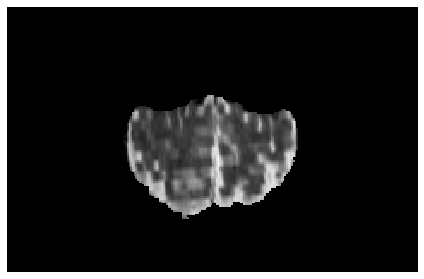

(155, 240)
(155, 240)


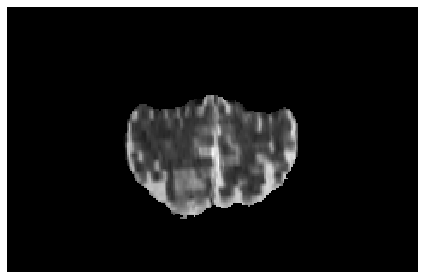

(155, 240)
(155, 240)


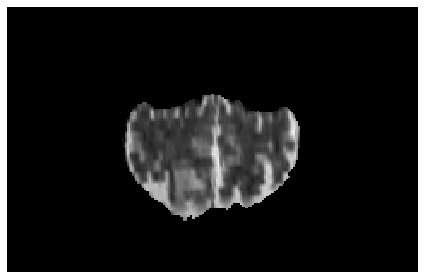

(155, 240)
(155, 240)


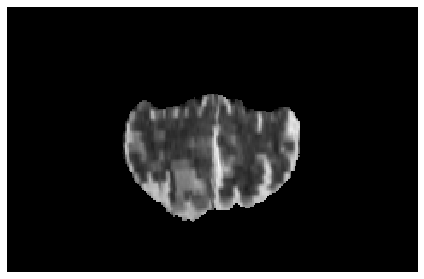

(155, 240)
(155, 240)


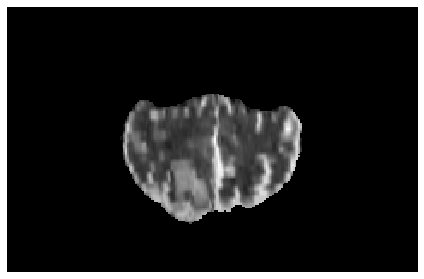

(155, 240)
(155, 240)


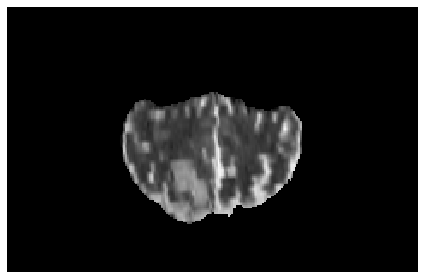

(155, 240)
(155, 240)


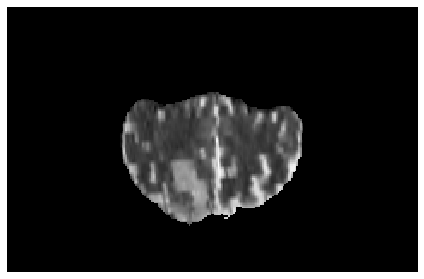

(155, 240)
(155, 240)


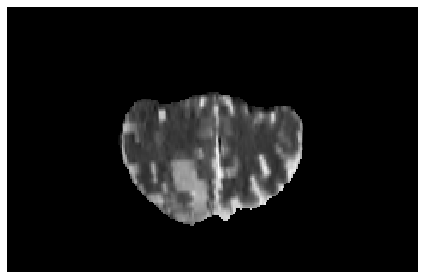

(155, 240)
(155, 240)


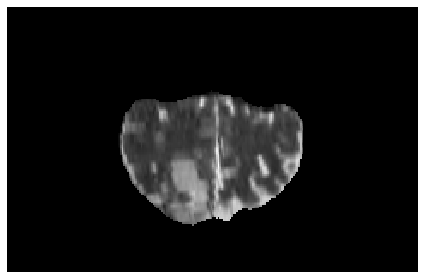

(155, 240)
(155, 240)


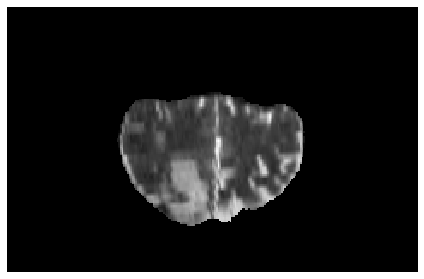

(155, 240)
(155, 240)


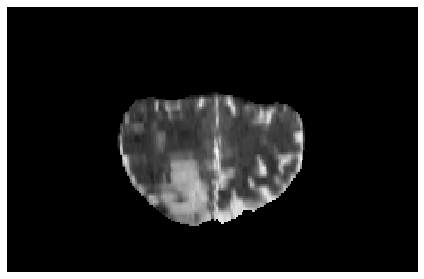

(155, 240)
(155, 240)


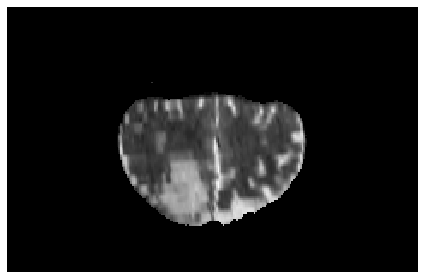

(155, 240)
(155, 240)


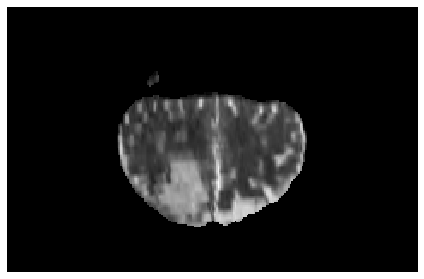

(155, 240)
(155, 240)


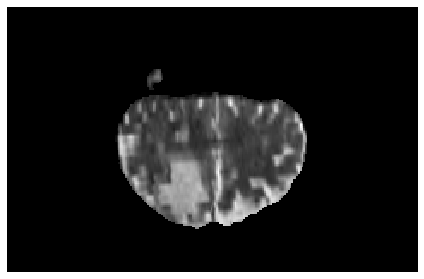

(155, 240)
(155, 240)


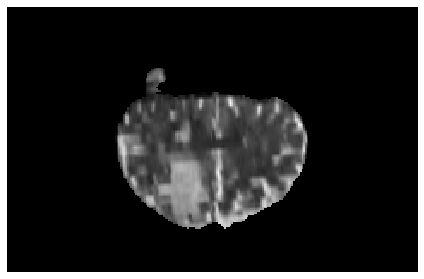

(155, 240)
(155, 240)


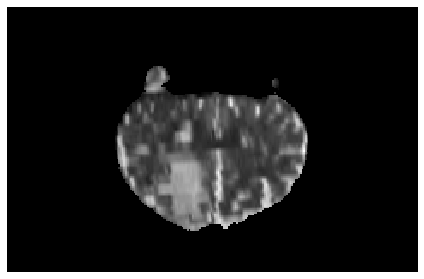

(155, 240)
(155, 240)


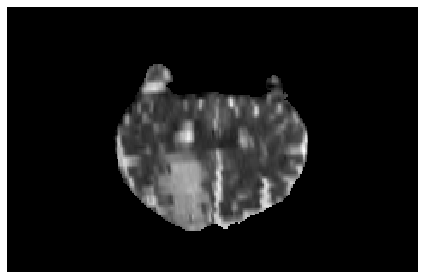

(155, 240)
(155, 240)


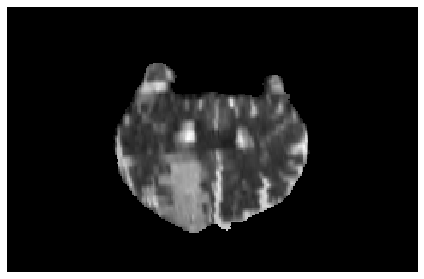

(155, 240)
(155, 240)


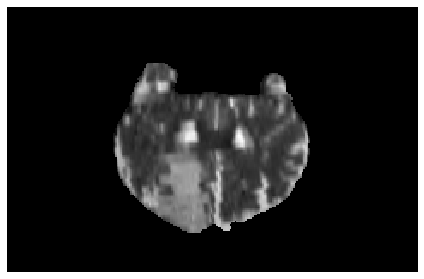

(155, 240)
(155, 240)


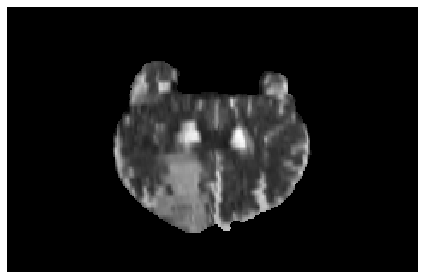

(155, 240)
(155, 240)


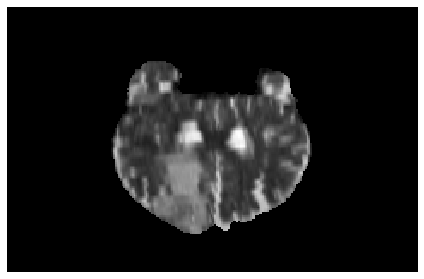

(155, 240)
(155, 240)


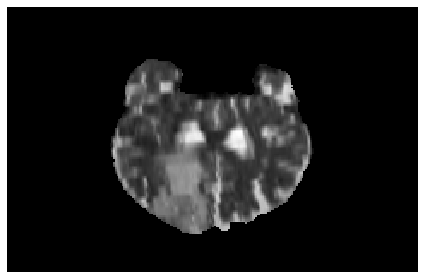

(155, 240)
(155, 240)


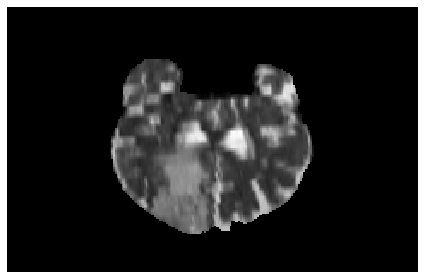

(155, 240)
(155, 240)


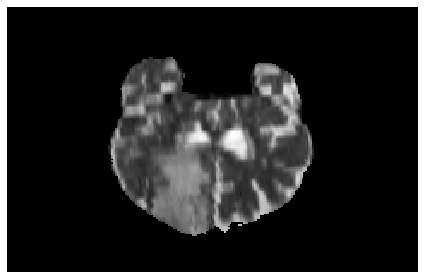

(155, 240)
(155, 240)


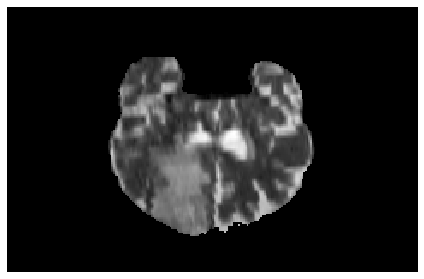

(155, 240)
(155, 240)


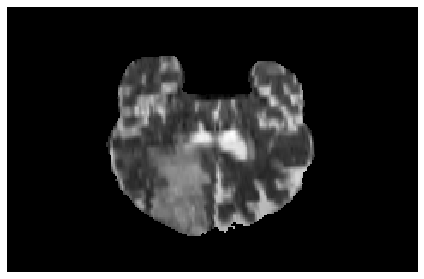

(155, 240)
(155, 240)


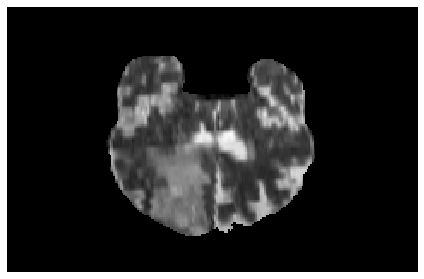

(155, 240)
(155, 240)


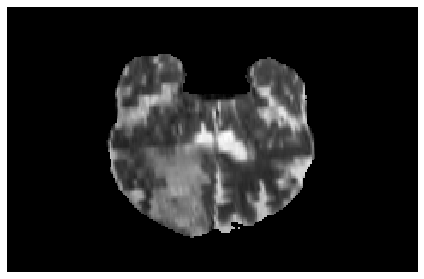

(155, 240)
(155, 240)


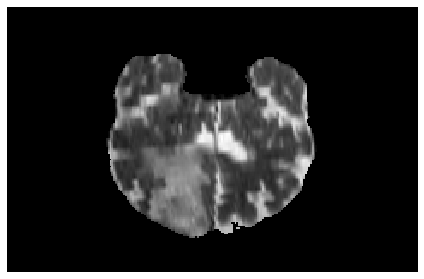

(155, 240)
(155, 240)


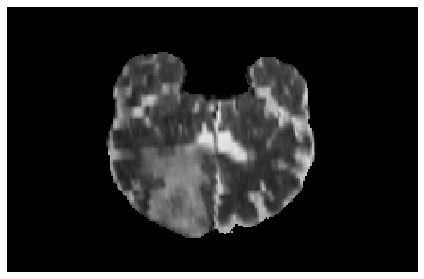

(155, 240)
(155, 240)


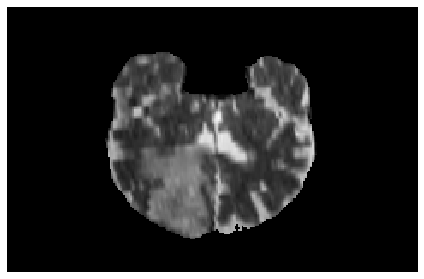

(155, 240)
(155, 240)


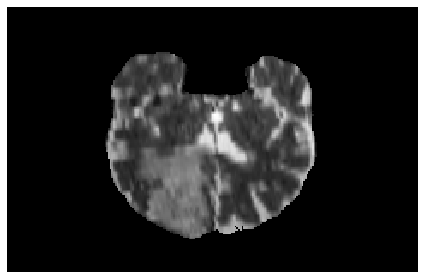

(155, 240)
(155, 240)


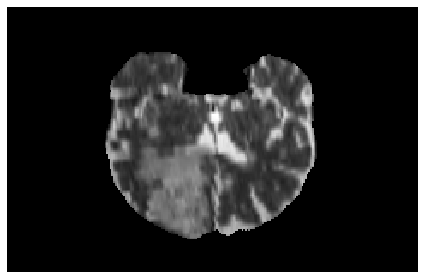

(155, 240)
(155, 240)


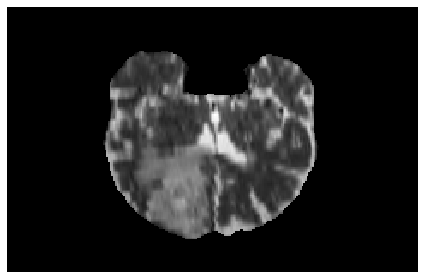

(155, 240)
(155, 240)


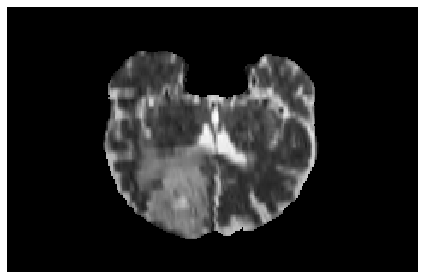

(155, 240)
(155, 240)


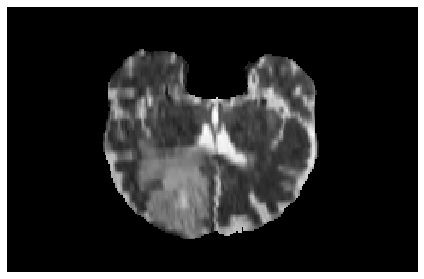

(155, 240)
(155, 240)


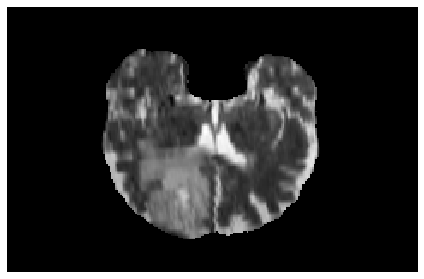

(155, 240)
(155, 240)


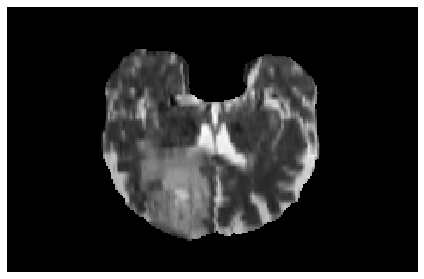

(155, 240)
(155, 240)


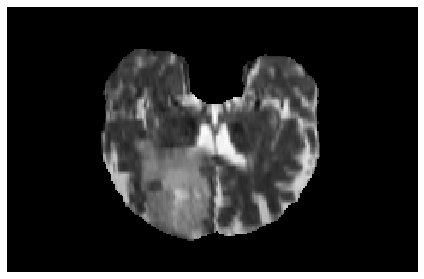

(155, 240)
(155, 240)


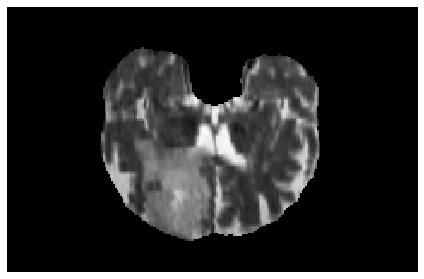

(155, 240)
(155, 240)


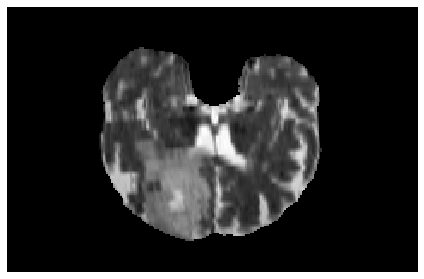

(155, 240)
(155, 240)


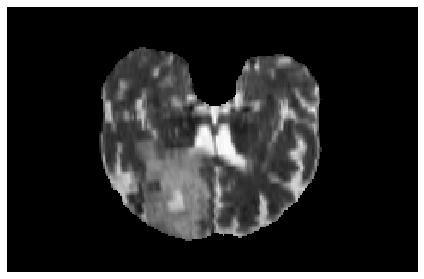

(155, 240)
(155, 240)


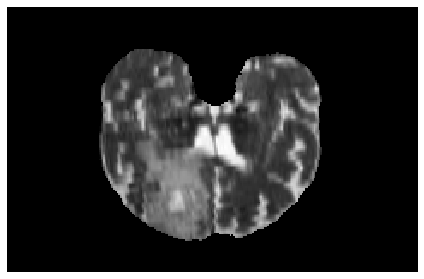

(155, 240)
(155, 240)


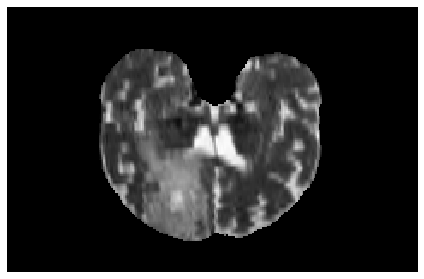

(155, 240)
(155, 240)


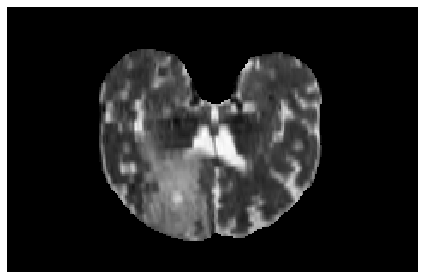

(155, 240)
(155, 240)


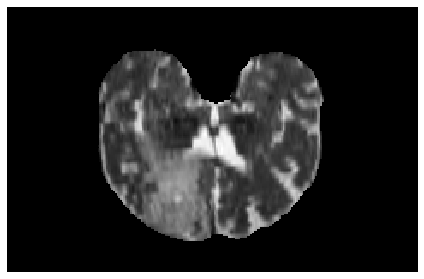

(155, 240)
(155, 240)


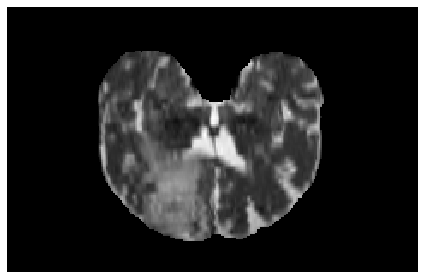

(155, 240)
(155, 240)


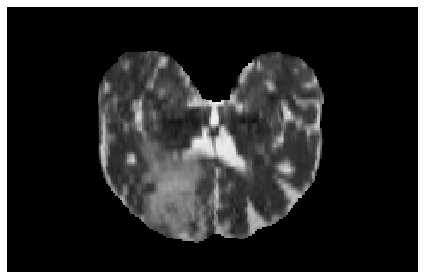

(155, 240)
(155, 240)


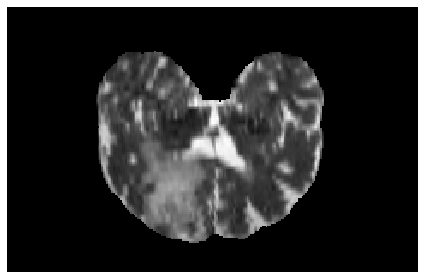

(155, 240)
(155, 240)


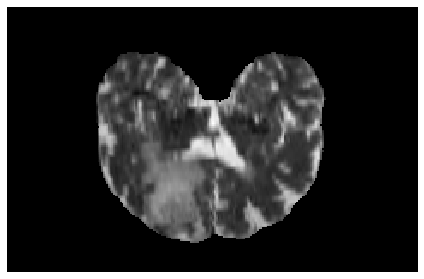

(155, 240)
(155, 240)


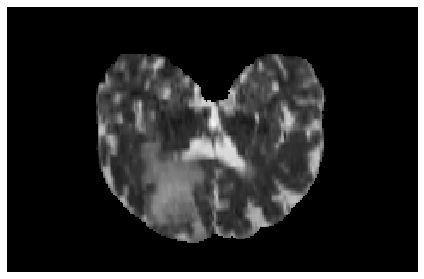

(155, 240)
(155, 240)


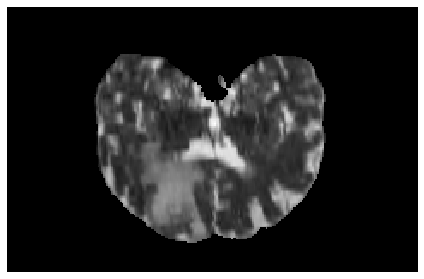

(155, 240)
(155, 240)


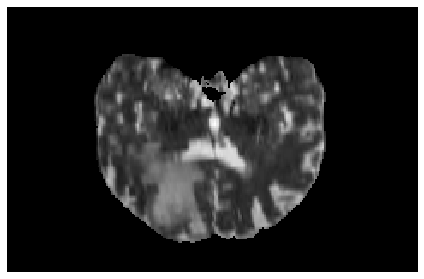

(155, 240)
(155, 240)


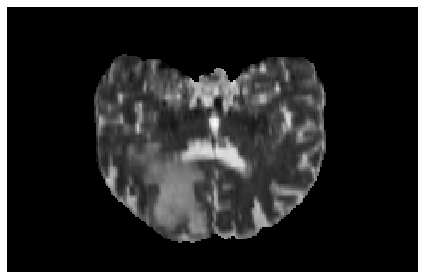

(155, 240)
(155, 240)


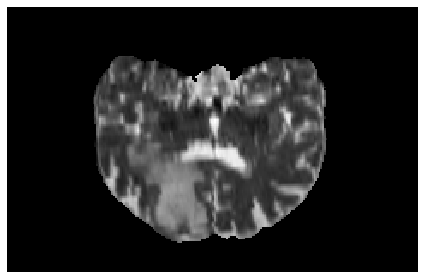

(155, 240)
(155, 240)


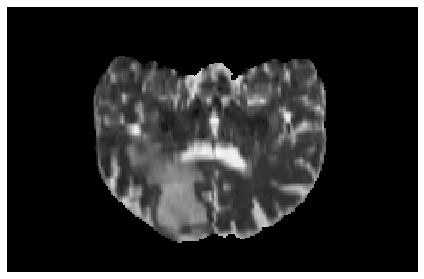

(155, 240)
(155, 240)


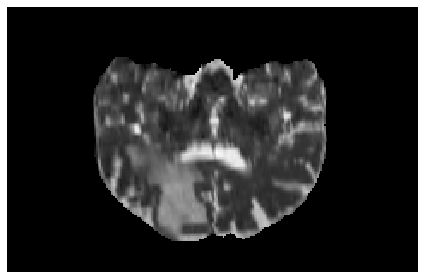

(155, 240)
(155, 240)


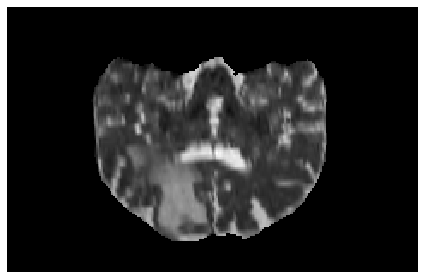

(155, 240)
(155, 240)


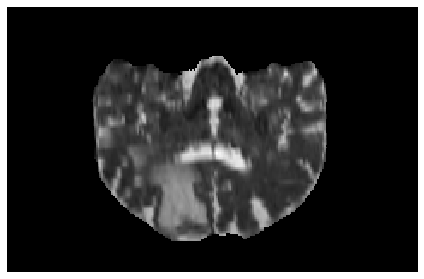

(155, 240)
(155, 240)


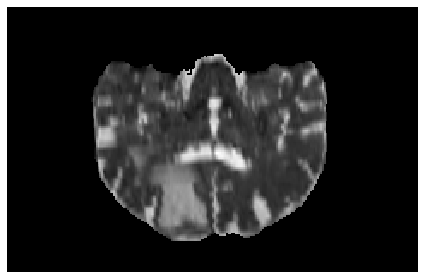

(155, 240)
(155, 240)


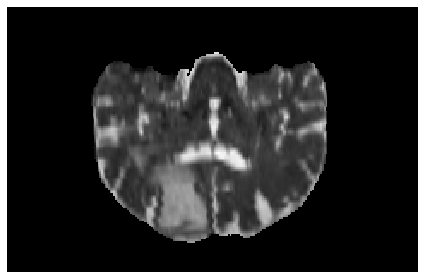

(155, 240)
(155, 240)


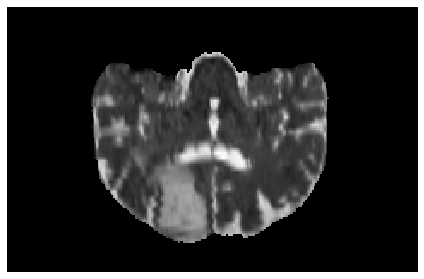

(155, 240)
(155, 240)


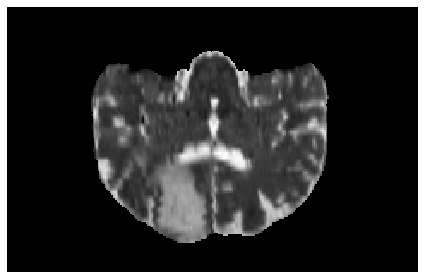

(155, 240)
(155, 240)


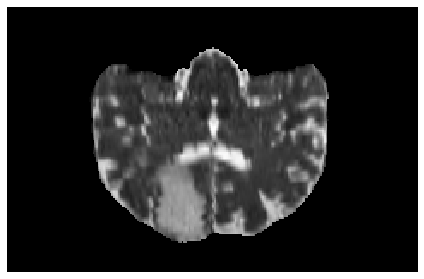

(155, 240)
(155, 240)


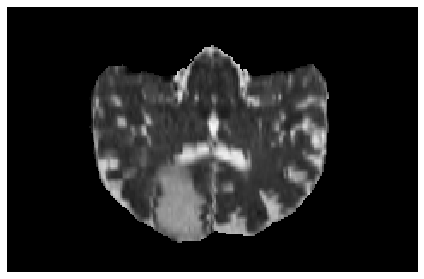

(155, 240)
(155, 240)


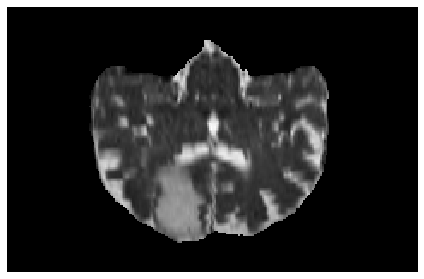

(155, 240)
(155, 240)


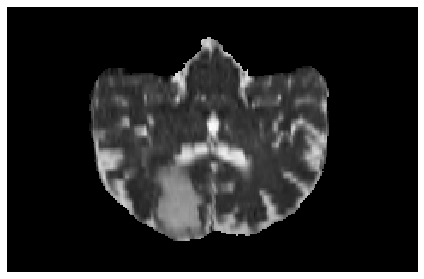

(155, 240)
(155, 240)


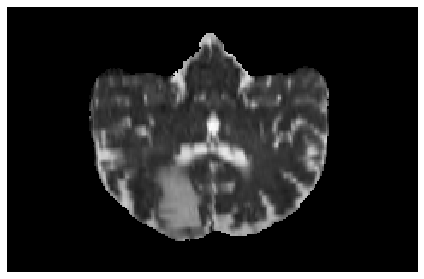

(155, 240)
(155, 240)


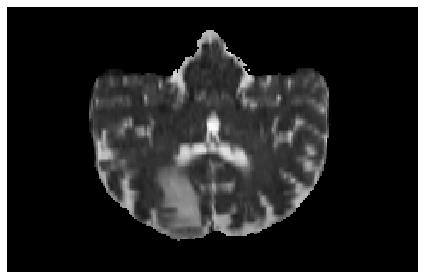

(155, 240)
(155, 240)


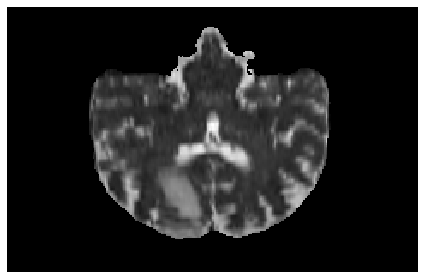

(155, 240)
(155, 240)


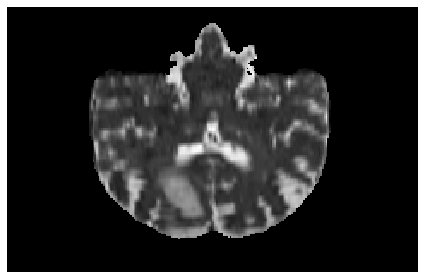

(155, 240)
(155, 240)


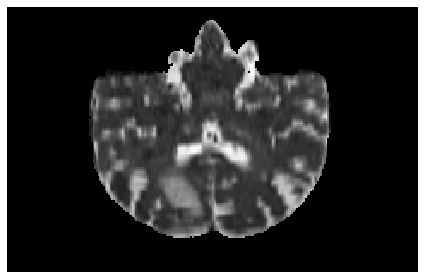

(155, 240)
(155, 240)


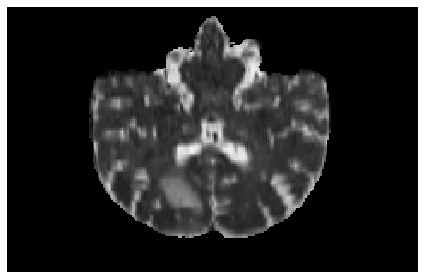

(155, 240)
(155, 240)


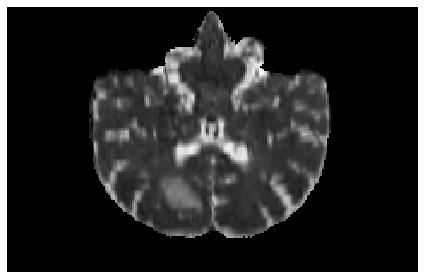

(155, 240)
(155, 240)


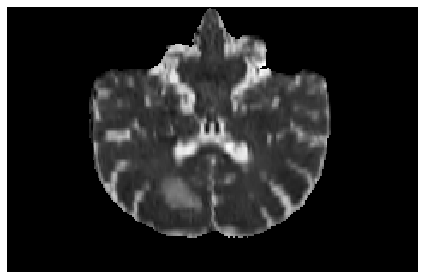

(155, 240)
(155, 240)


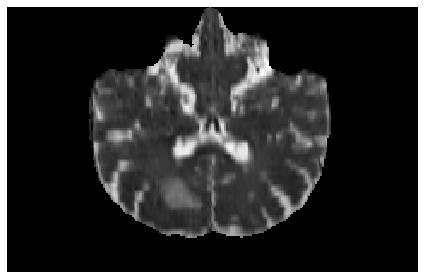

(155, 240)
(155, 240)


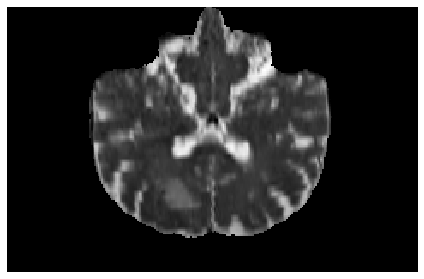

(155, 240)
(155, 240)


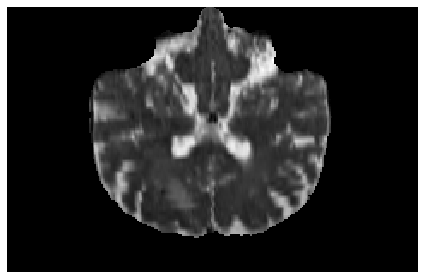

(155, 240)
(155, 240)


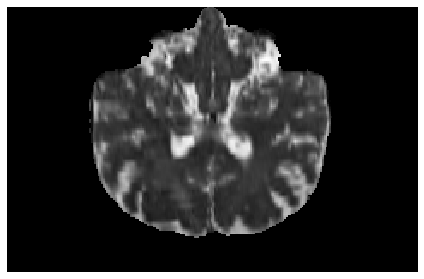

(155, 240)
(155, 240)


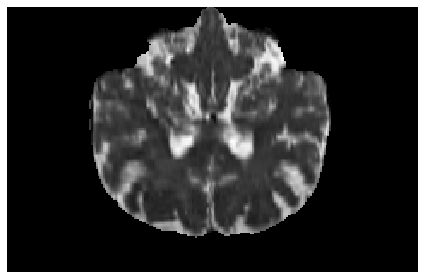

(155, 240)
(155, 240)


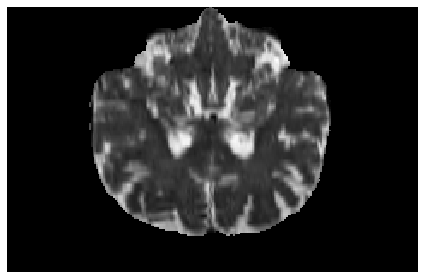

(155, 240)
(155, 240)


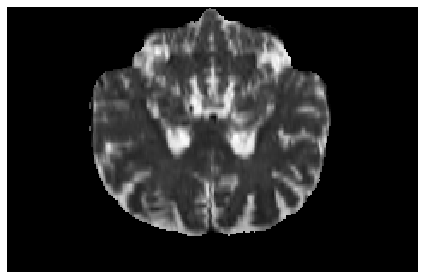

(155, 240)
(155, 240)


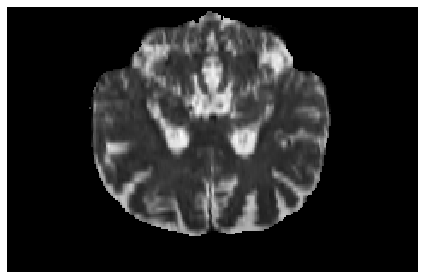

(155, 240)
(155, 240)


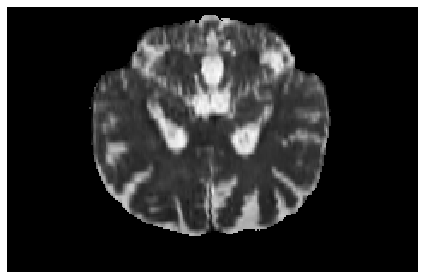

(155, 240)
(155, 240)


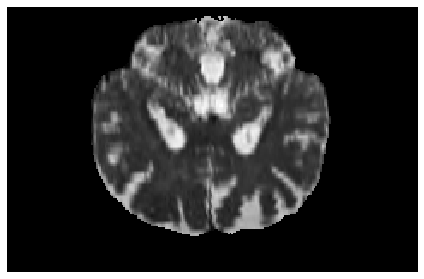

(155, 240)
(155, 240)


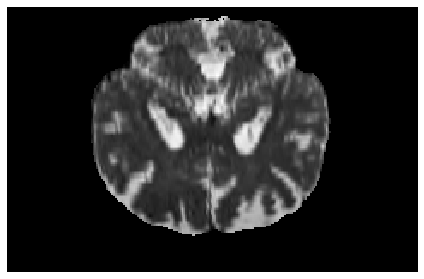

(155, 240)
(155, 240)


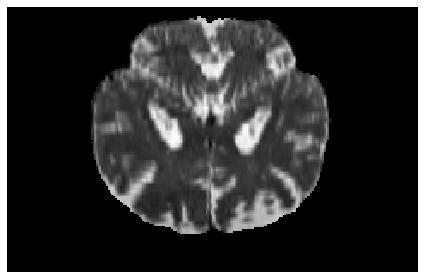

(155, 240)
(155, 240)


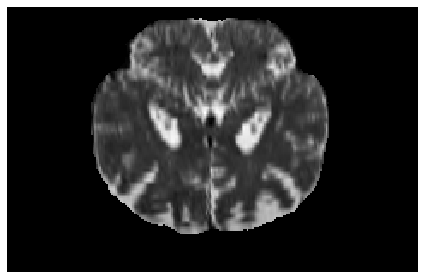

(155, 240)
(155, 240)


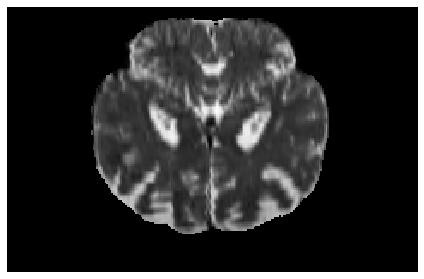

(155, 240)
(155, 240)


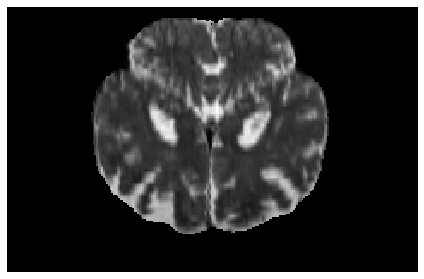

(155, 240)
(155, 240)


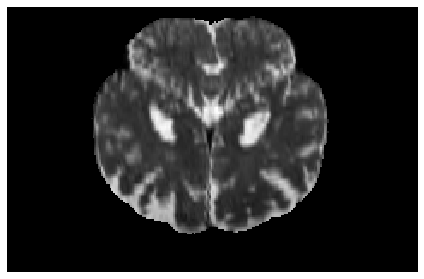

(155, 240)
(155, 240)


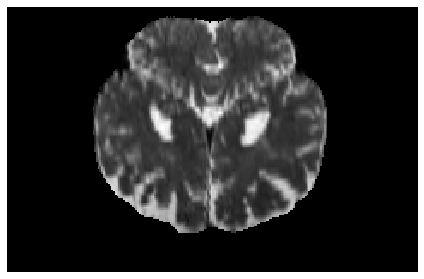

(155, 240)
(155, 240)


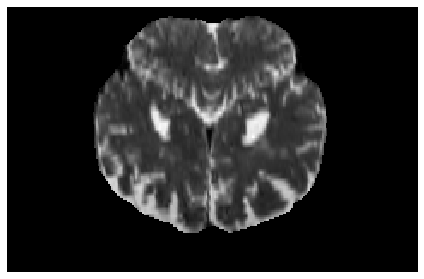

(155, 240)
(155, 240)


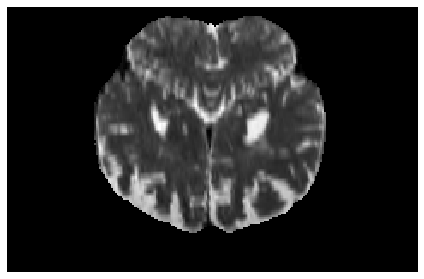

(155, 240)
(155, 240)


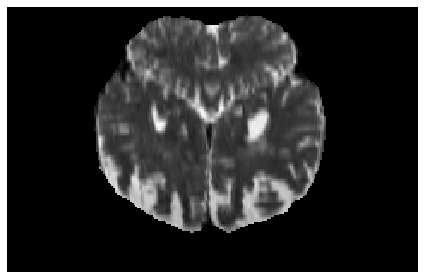

(155, 240)
(155, 240)


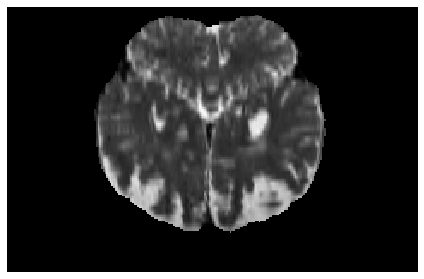

(155, 240)
(155, 240)


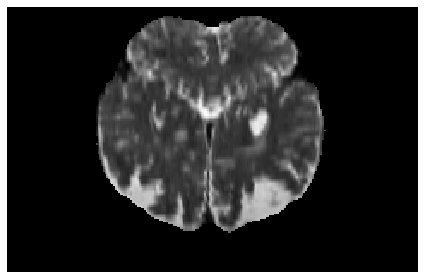

(155, 240)
(155, 240)


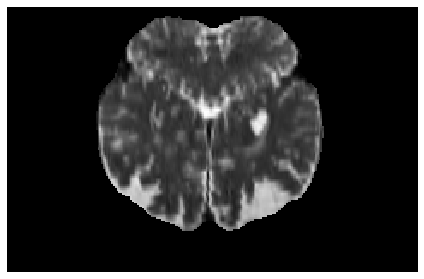

(155, 240)
(155, 240)


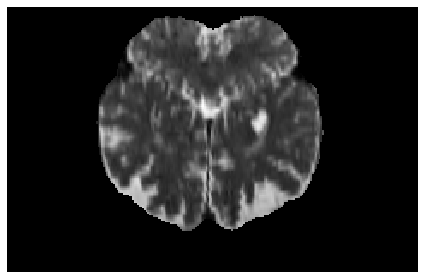

(155, 240)
(155, 240)


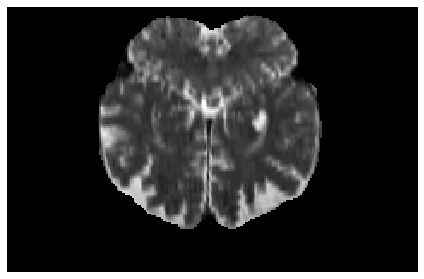

(155, 240)
(155, 240)


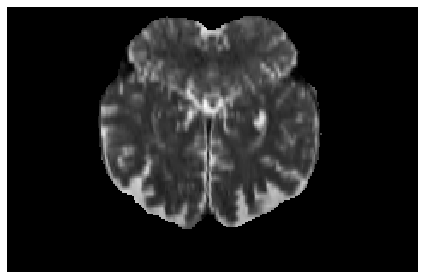

(155, 240)
(155, 240)


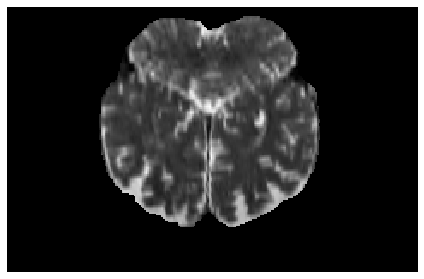

(155, 240)
(155, 240)


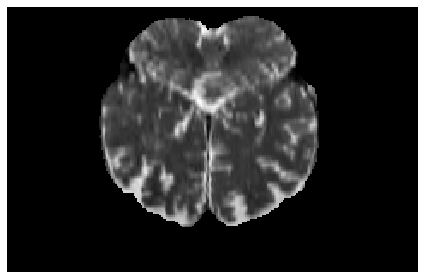

(155, 240)
(155, 240)


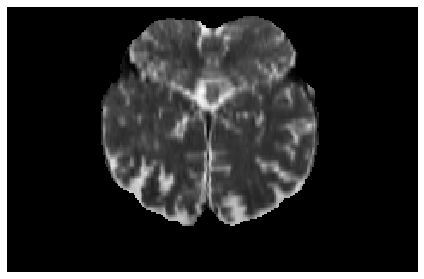

(155, 240)
(155, 240)


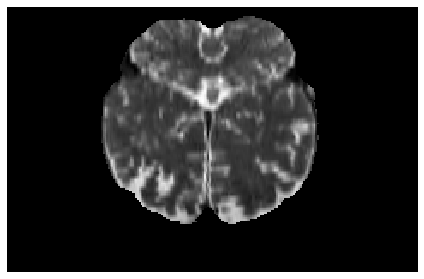

(155, 240)
(155, 240)


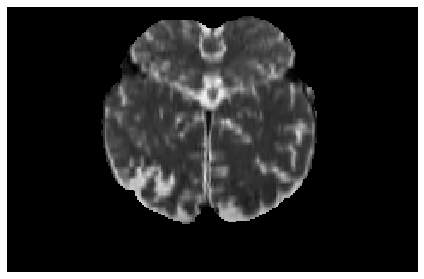

(155, 240)
(155, 240)


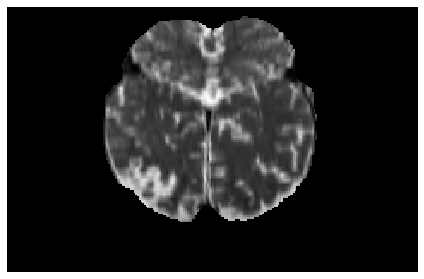

(155, 240)
(155, 240)


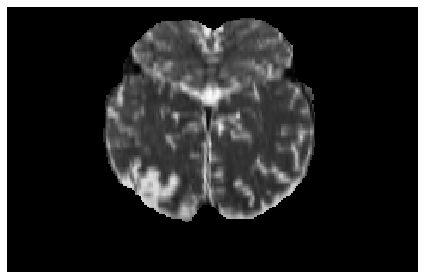

(155, 240)
(155, 240)


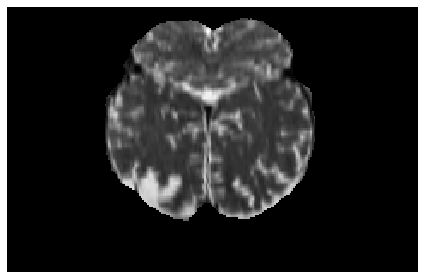

(155, 240)
(155, 240)


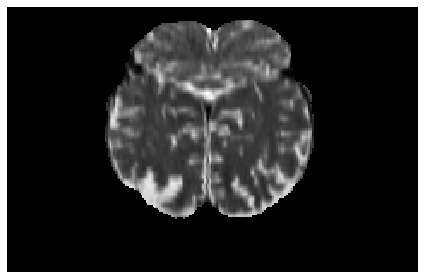

(155, 240)
(155, 240)


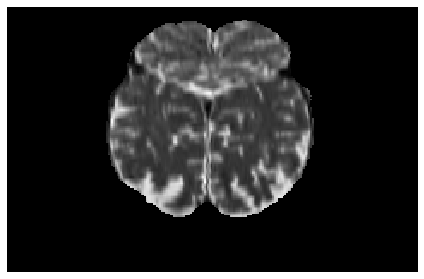

(155, 240)
(155, 240)


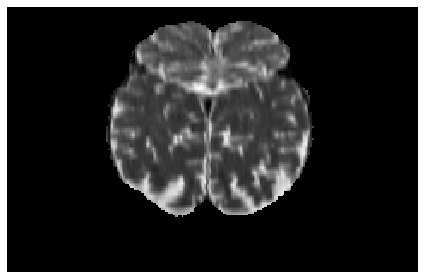

(155, 240)
(155, 240)


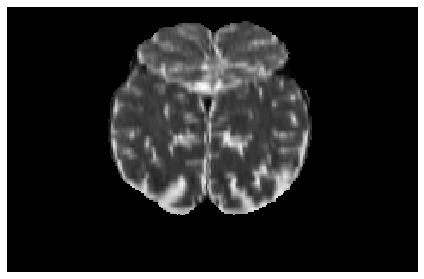

(155, 240)
(155, 240)


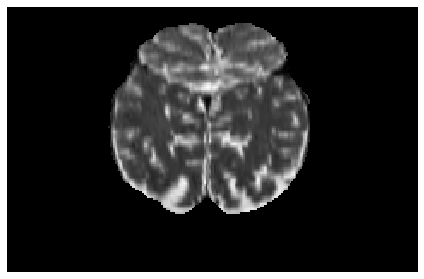

(155, 240)
(155, 240)


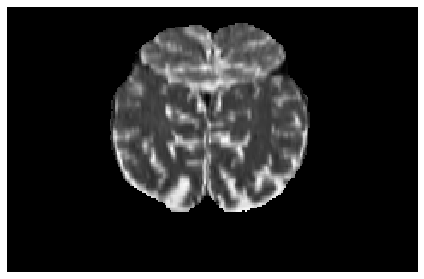

(155, 240)
(155, 240)


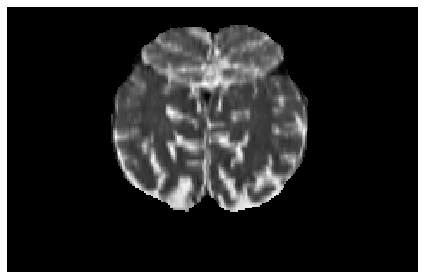

(155, 240)
(155, 240)


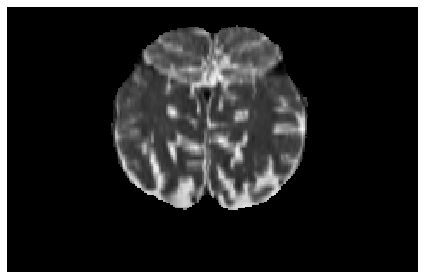

(155, 240)
(155, 240)


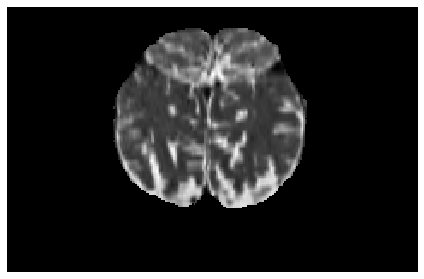

(155, 240)
(155, 240)


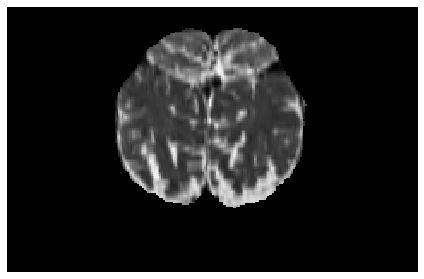

(155, 240)
(155, 240)


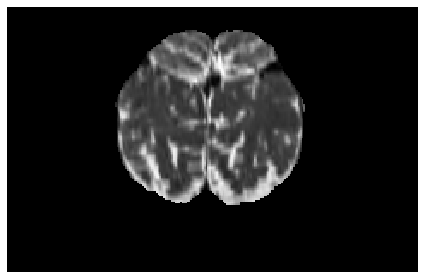

(155, 240)
(155, 240)


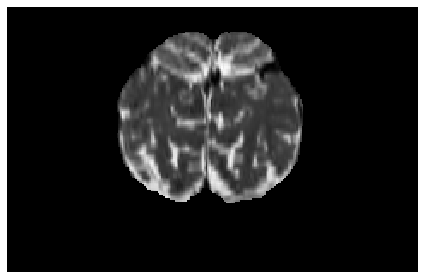

(155, 240)
(155, 240)


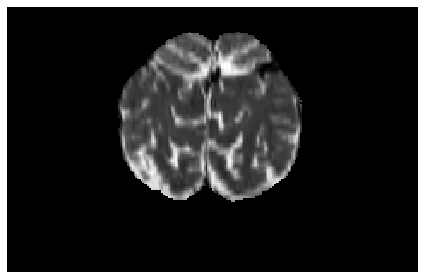

(155, 240)
(155, 240)


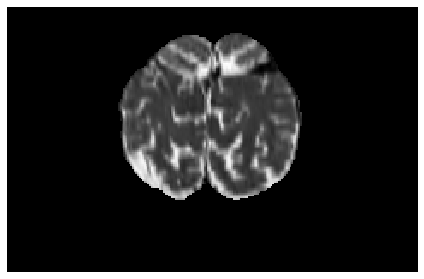

(155, 240)
(155, 240)


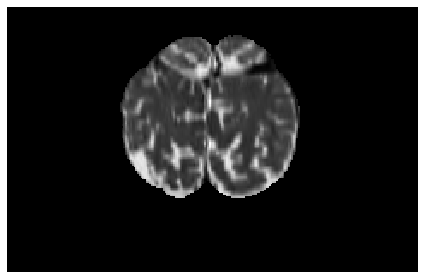

(155, 240)
(155, 240)


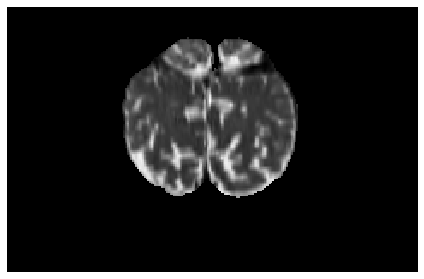

(155, 240)
(155, 240)


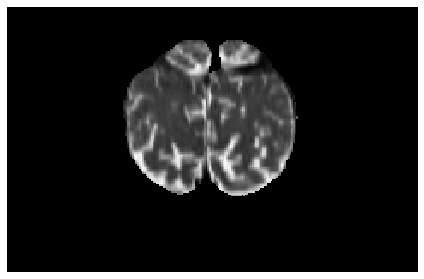

(155, 240)
(155, 240)


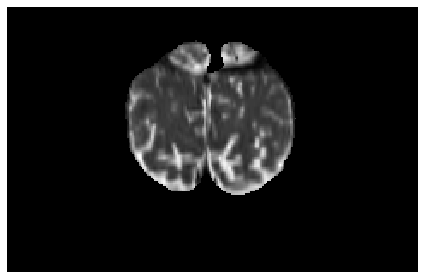

(155, 240)
(155, 240)


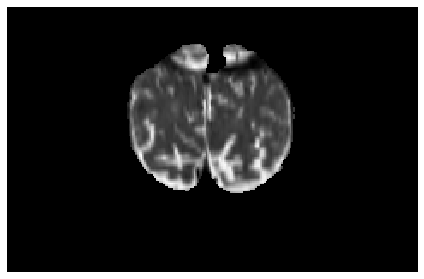

(155, 240)
(155, 240)


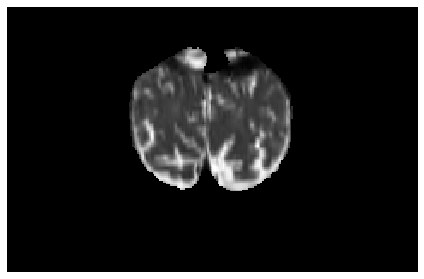

(155, 240)
(155, 240)


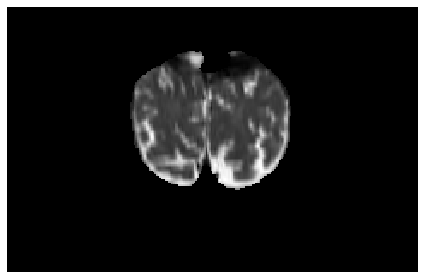

(155, 240)
(155, 240)


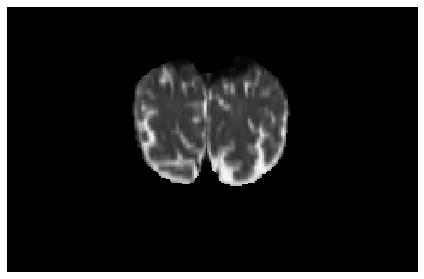

(155, 240)
(155, 240)


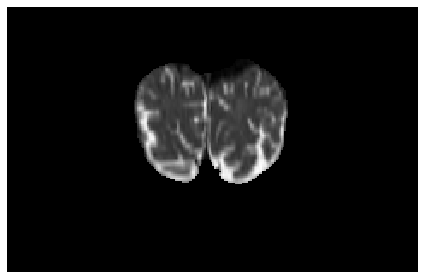

(155, 240)
(155, 240)


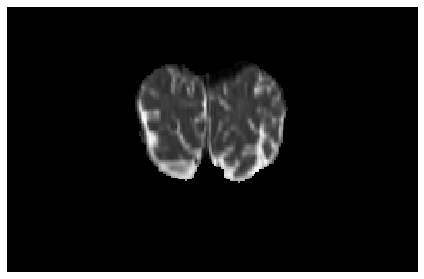

(155, 240)
(155, 240)


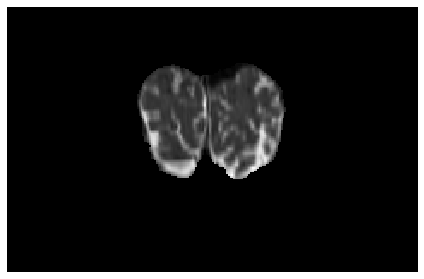

(155, 240)
(155, 240)


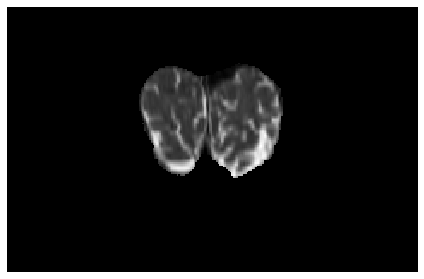

(155, 240)
(155, 240)


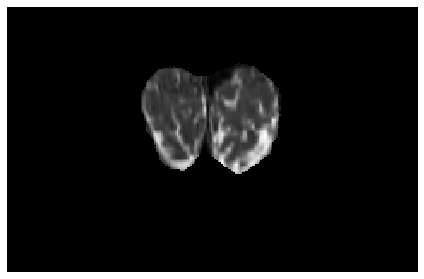

(155, 240)
(155, 240)


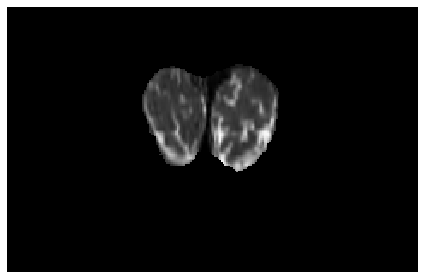

(155, 240)
(155, 240)


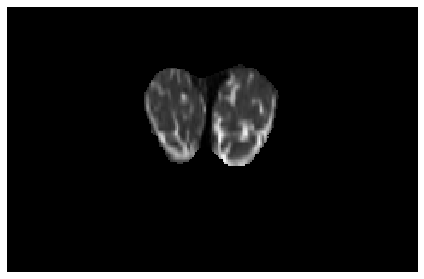

(155, 240)
(155, 240)


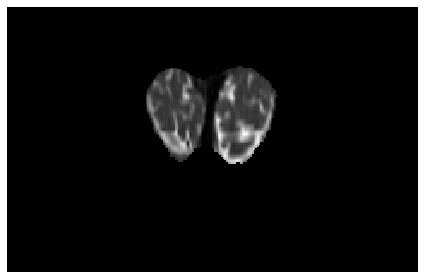

(155, 240)
(155, 240)


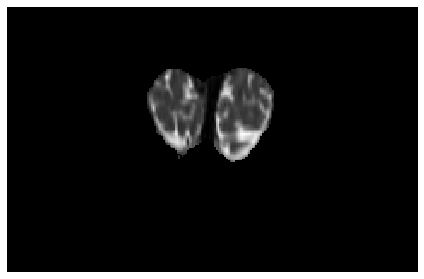

(155, 240)
(155, 240)


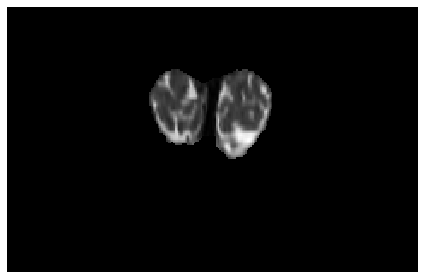

(155, 240)
(155, 240)


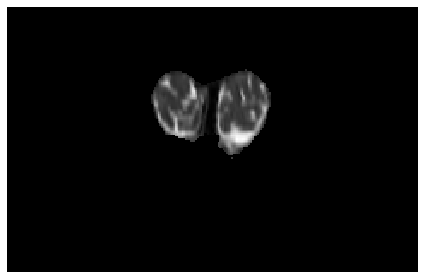

(155, 240)
(155, 240)


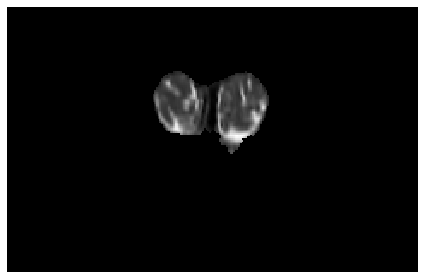

(155, 240)
(155, 240)


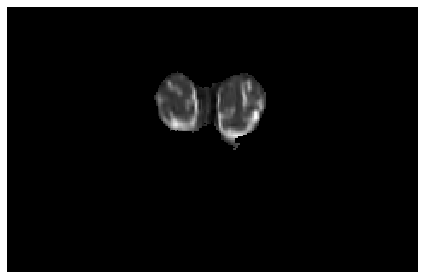

(155, 240)
(155, 240)


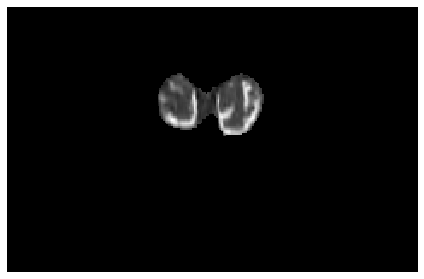

(155, 240)
(155, 240)


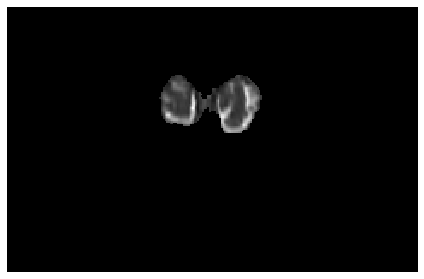

(155, 240)
(155, 240)


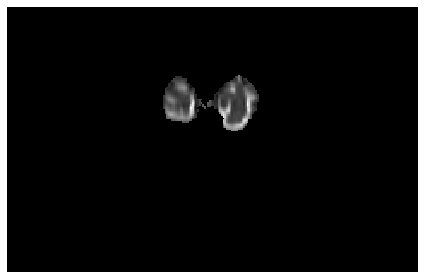

(155, 240)
(155, 240)


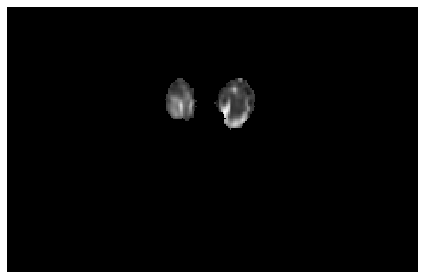

(155, 240)
(155, 240)


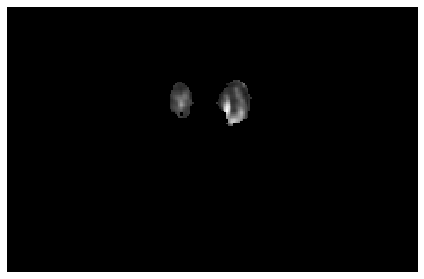

(155, 240)
(155, 240)


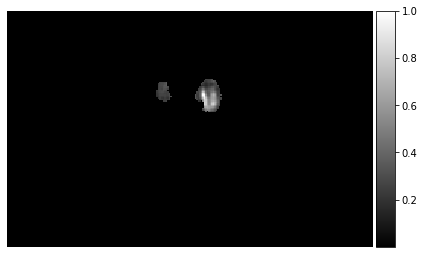

(155, 240)
(155, 240)


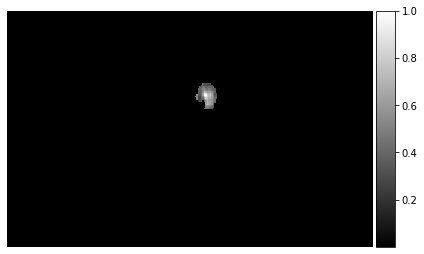

(155, 240)
(155, 240)


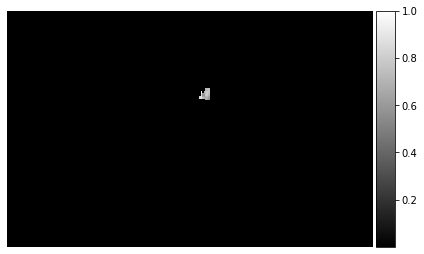

(155, 240)
(155, 240)


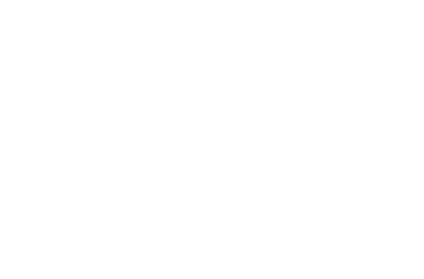

(155, 240)
(155, 240)


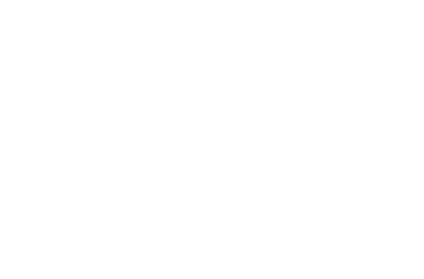

(155, 240)
(155, 240)


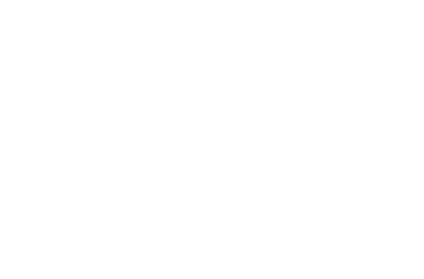

(155, 240)
(155, 240)


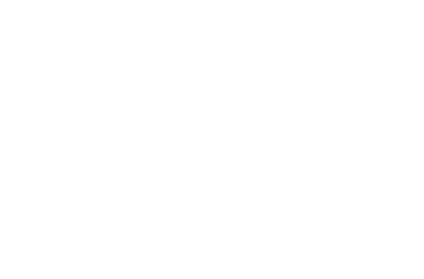

(155, 240)
(155, 240)


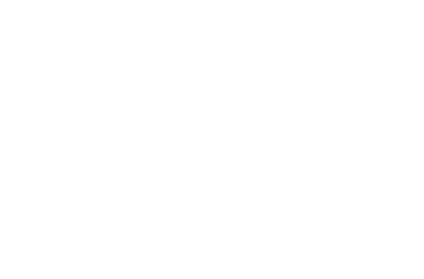

(155, 240)
(155, 240)


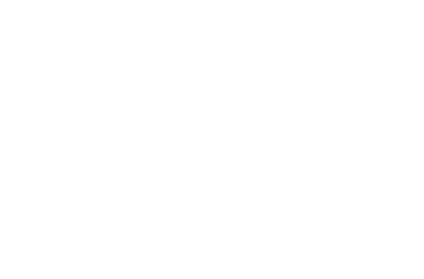

(155, 240)
(155, 240)


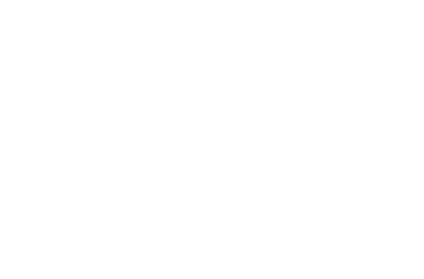

(155, 240)
(155, 240)


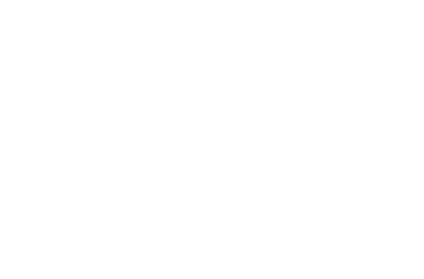

(155, 240)
(155, 240)


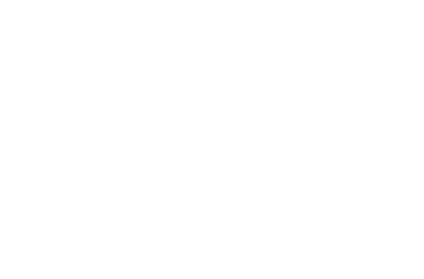

(155, 240)
(155, 240)


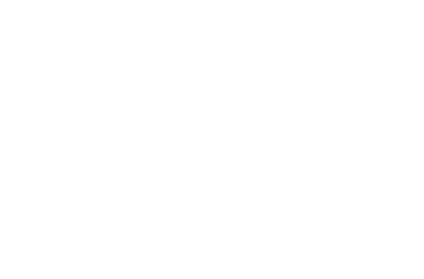

(155, 240)
(155, 240)


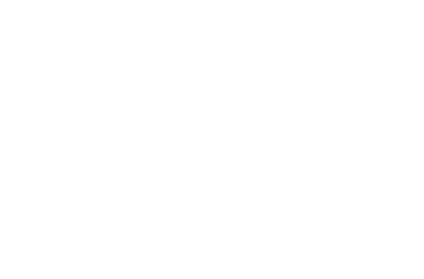

(155, 240)
(155, 240)


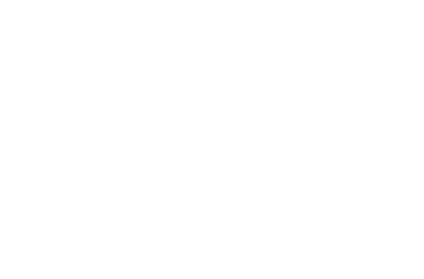

(155, 240)
(155, 240)


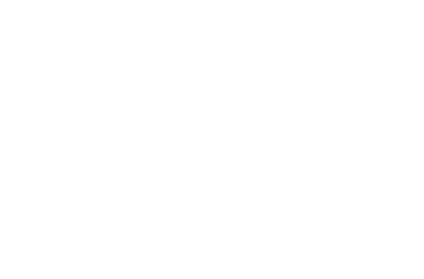

(155, 240)
(155, 240)


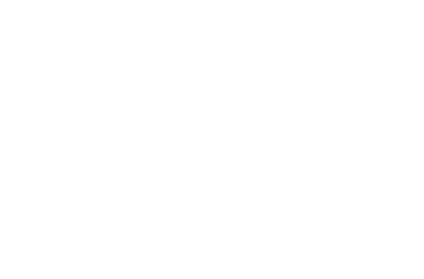

(155, 240)
(155, 240)


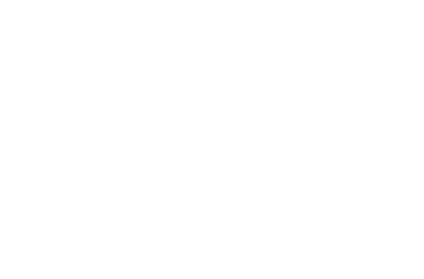

(155, 240)
(155, 240)


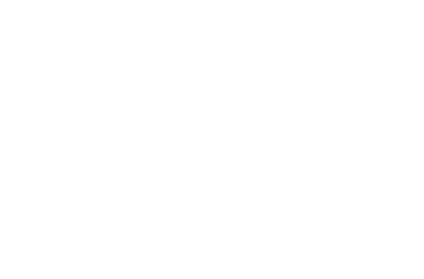

(155, 240)
(155, 240)


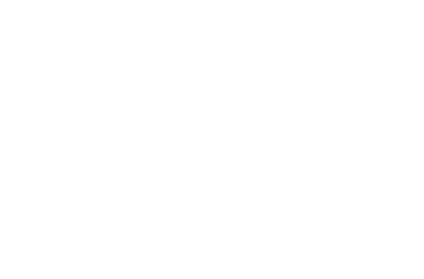

(155, 240)
(155, 240)


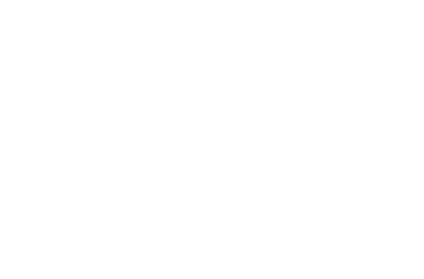

(155, 240)
(155, 240)


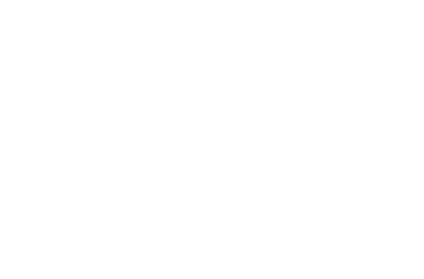

(155, 240)
(155, 240)


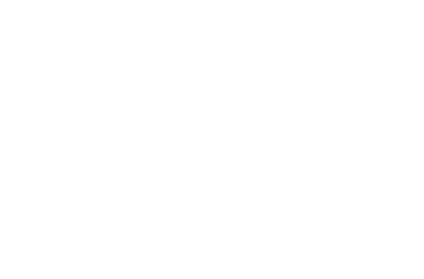

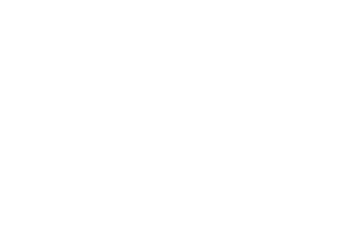

In [ ]:
root_path = '/content/drive/MyDrive/Training_115_Segmentation/T2/Coronal/'
#path = os.path.join(os.path.join(root_path), 'Ground_Truth_Overlap')
path = os.path.join(os.path.join(root_path), 'Brain_MRI')
#path = os.path.join(os.path.join(root_path), 'Prediction_Overlap')

for i in range(240):
  brainMRI = all_modalities[:, i, :, 0]
  #GroundTruth = gt[:,:,i,0]
  Predicted = prediction[:,i,:,0]
  print(brainMRI.shape)
  print(Predicted.shape)
  visualization=show_segmented_image(brainMRI,Predicted)
  i=str(i)
  j = "brain_name" + i + ".jpg"
  path1 = os.path.join(os.path.join(path), j)
  #io.imshow(visualization)
  io.imshow(visualization,cmap="gray")
  fig1 = plt.gcf()
  plt.show()
  plt.draw()
  plt.axis('off')
  fig1.savefig(path1, bbox_inches='tight', pad_inches = 0)

# Saving the Visualizations of Sagittal overlapped segmented regions

* Use the following code line for saving the overlapped ground truth region on the Sagittal brain MRI Sequence
```
# brainMRI = all_modalitiesall_modalities[:, :, i, 0]
# GroundTruth = gtall_modalities[:, :, i, 0]
```
* Use the following code line for saving the overlapped predicted region on the Sagittal brain MRI Sequence
```
# brainMRI = all_modalitiesall_modalities[:, :, i, 0]
# Predicted = predictionall_modalities[:, :, i, 0]
```

  

  

(155, 240)
(155, 240)


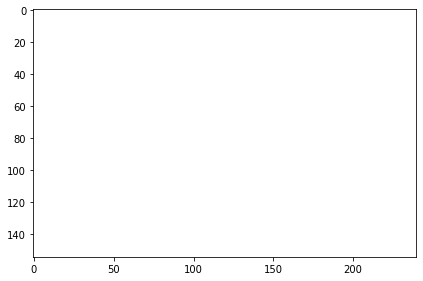

(155, 240)
(155, 240)


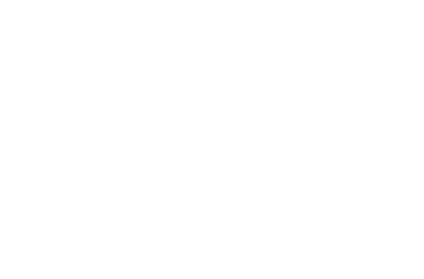

(155, 240)
(155, 240)


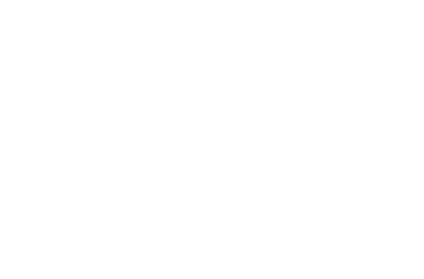

(155, 240)
(155, 240)


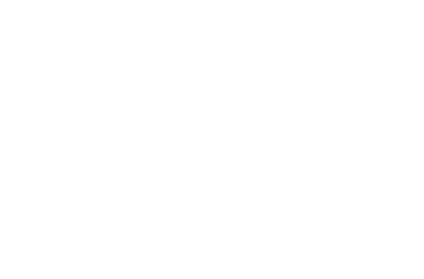

(155, 240)
(155, 240)


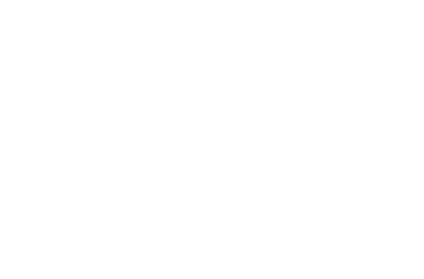

(155, 240)
(155, 240)


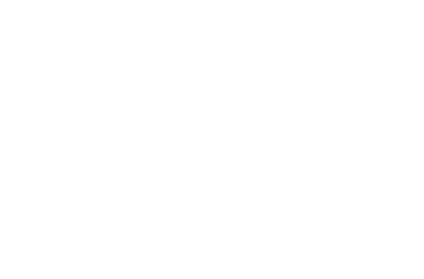

(155, 240)
(155, 240)


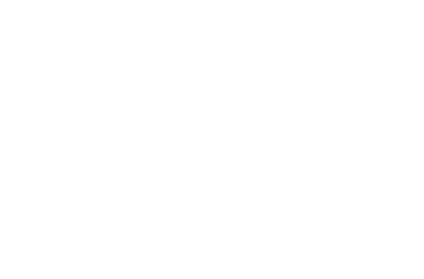

(155, 240)
(155, 240)


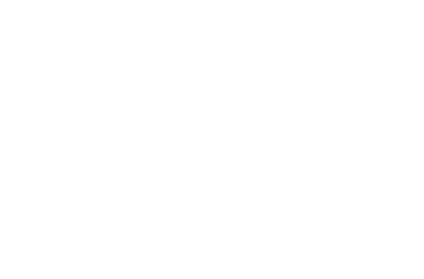

(155, 240)
(155, 240)


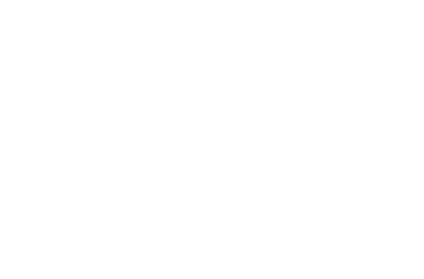

(155, 240)
(155, 240)


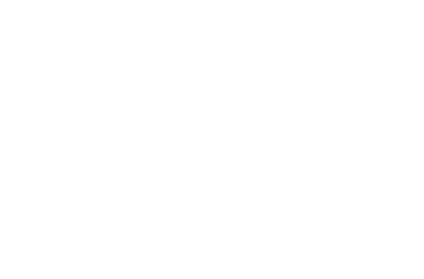

(155, 240)
(155, 240)


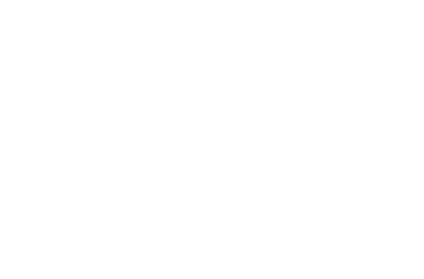

(155, 240)
(155, 240)


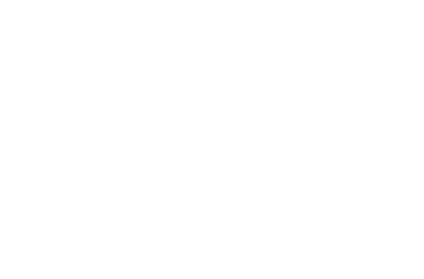

(155, 240)
(155, 240)


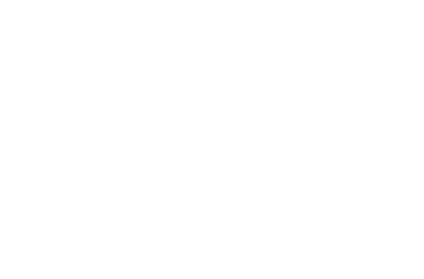

(155, 240)
(155, 240)


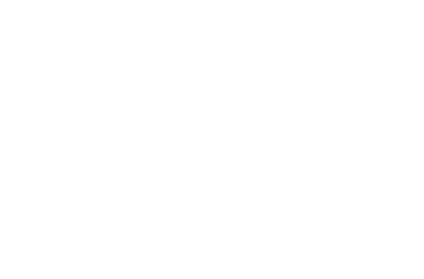

(155, 240)
(155, 240)


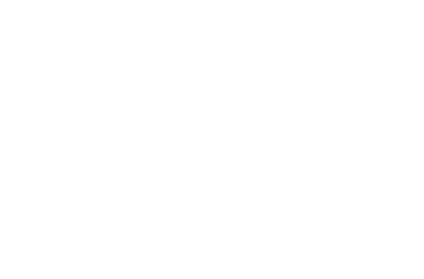

(155, 240)
(155, 240)


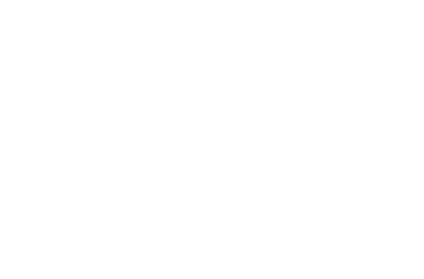

(155, 240)
(155, 240)


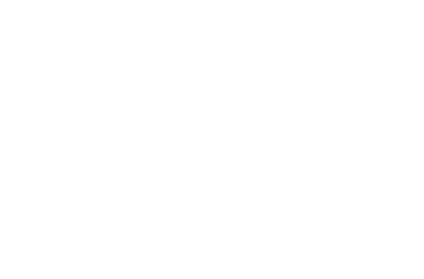

(155, 240)
(155, 240)


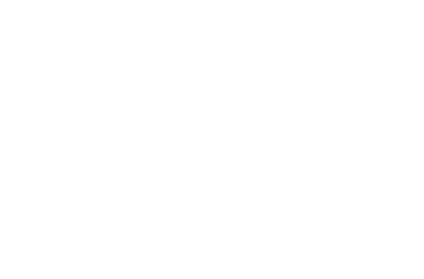

(155, 240)
(155, 240)


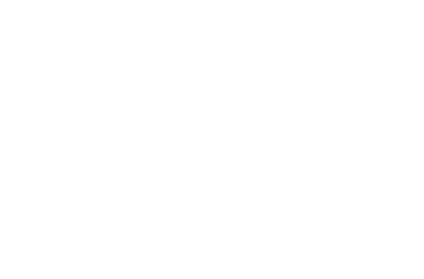

(155, 240)
(155, 240)


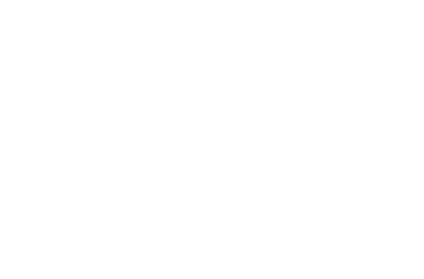

(155, 240)
(155, 240)


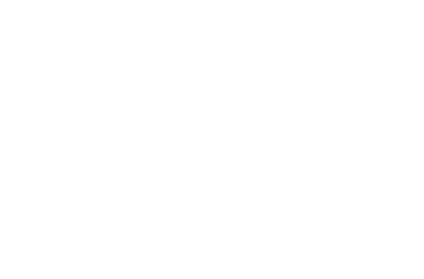

(155, 240)
(155, 240)


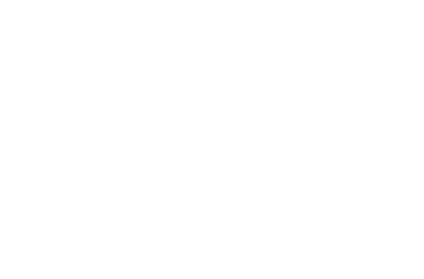

(155, 240)
(155, 240)


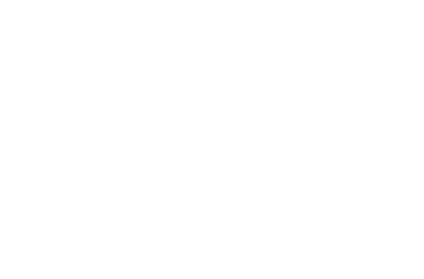

(155, 240)
(155, 240)


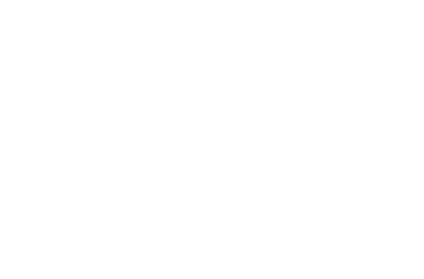

(155, 240)
(155, 240)


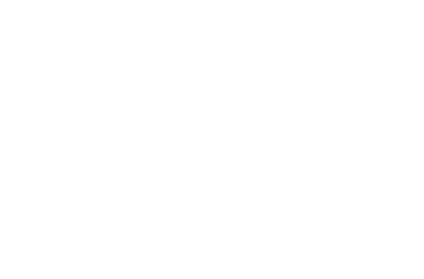

(155, 240)
(155, 240)


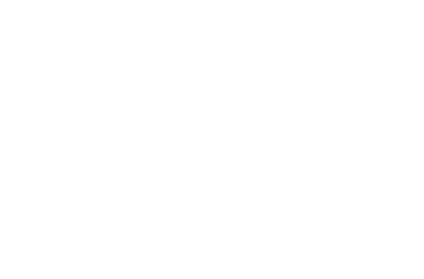

(155, 240)
(155, 240)


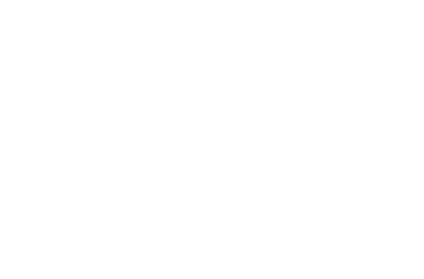

(155, 240)
(155, 240)


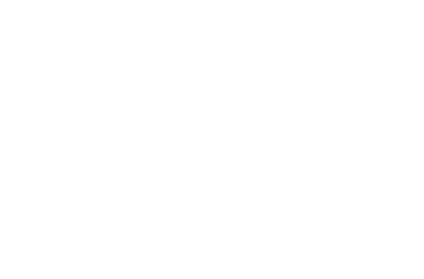

(155, 240)
(155, 240)


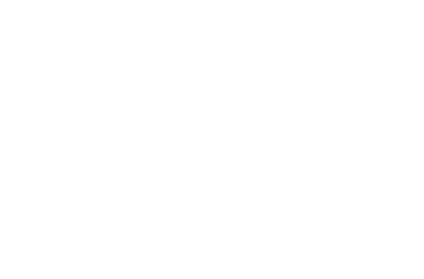

(155, 240)
(155, 240)


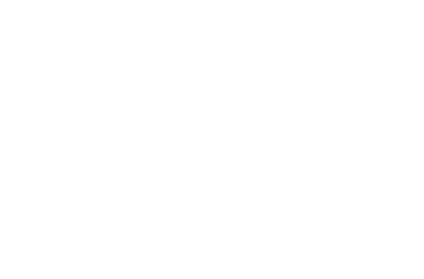

(155, 240)
(155, 240)


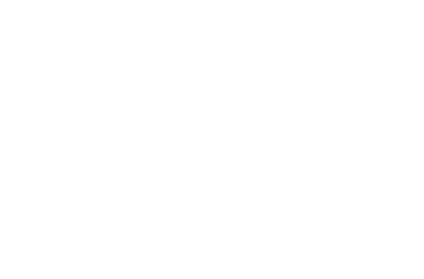

(155, 240)
(155, 240)


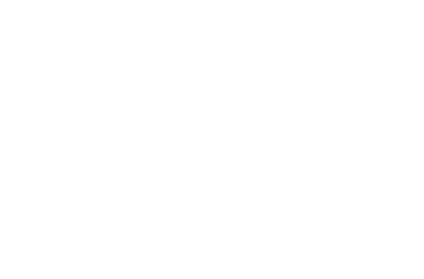

(155, 240)
(155, 240)


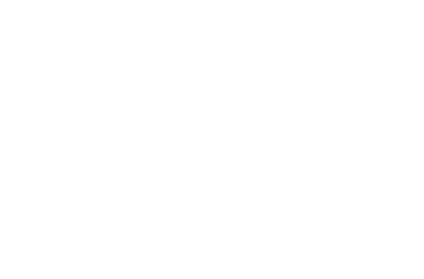

(155, 240)
(155, 240)


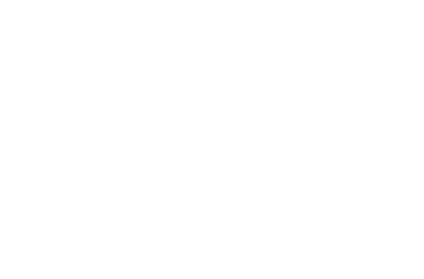

(155, 240)
(155, 240)


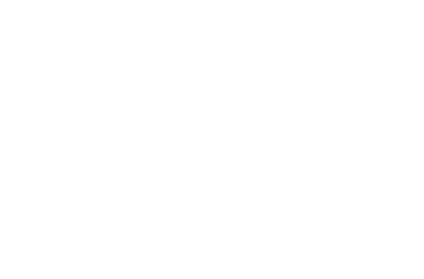

(155, 240)
(155, 240)


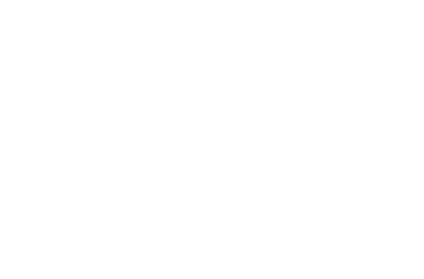

(155, 240)
(155, 240)


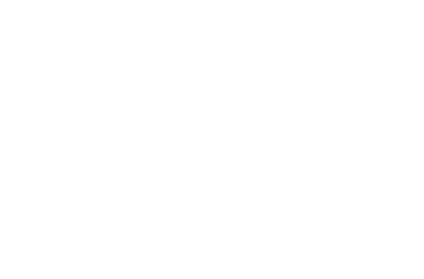

(155, 240)
(155, 240)


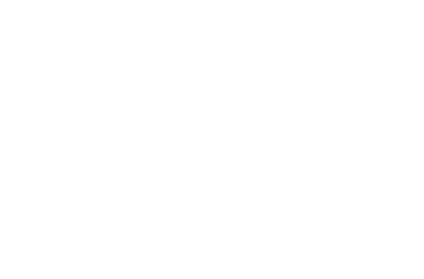

(155, 240)
(155, 240)


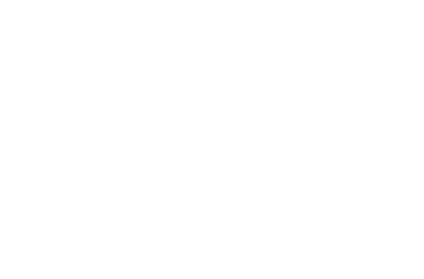

(155, 240)
(155, 240)


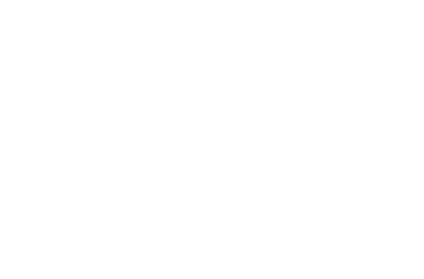

(155, 240)
(155, 240)


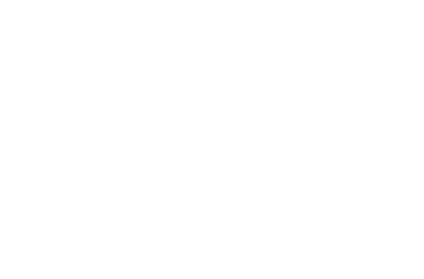

(155, 240)
(155, 240)


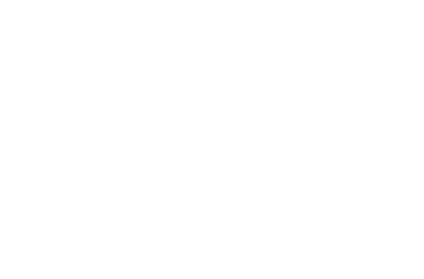

(155, 240)
(155, 240)


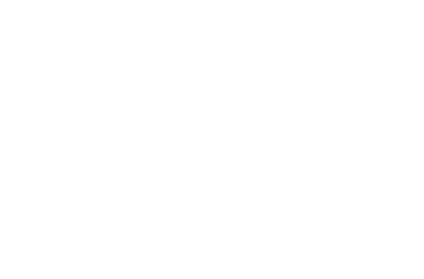

(155, 240)
(155, 240)


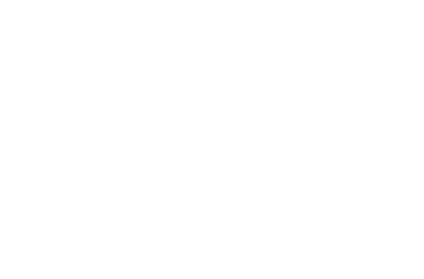

(155, 240)
(155, 240)


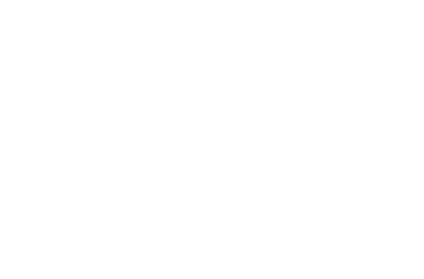

(155, 240)
(155, 240)


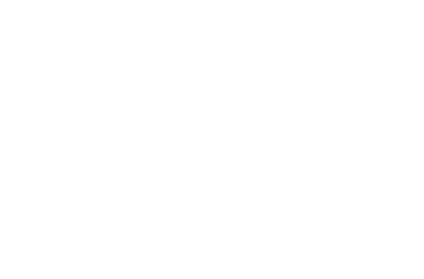

(155, 240)
(155, 240)


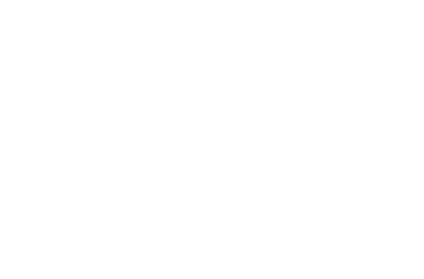

(155, 240)
(155, 240)


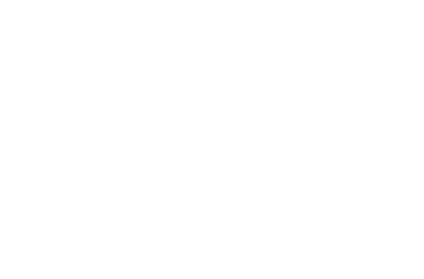

(155, 240)
(155, 240)


/usr/local/lib/python3.7/dist-packages/skimage/io/_plugins/matplotlib_plugin.py:150: UserWarning: Low image data range; displaying image with stretched contrast.
  lo, hi, cmap = _get_display_range(image)


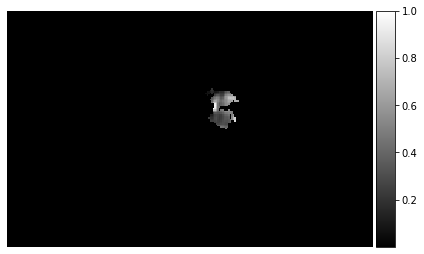

(155, 240)
(155, 240)


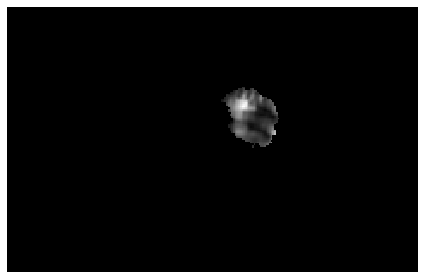

(155, 240)
(155, 240)


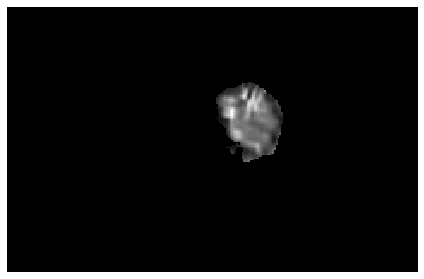

(155, 240)
(155, 240)


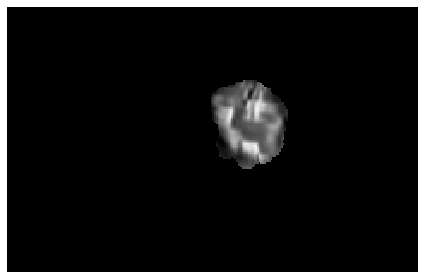

(155, 240)
(155, 240)


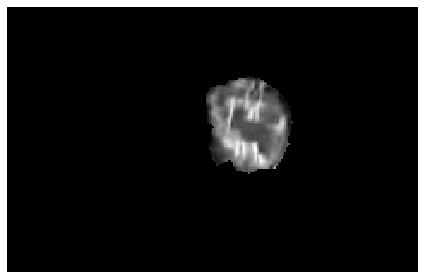

(155, 240)
(155, 240)


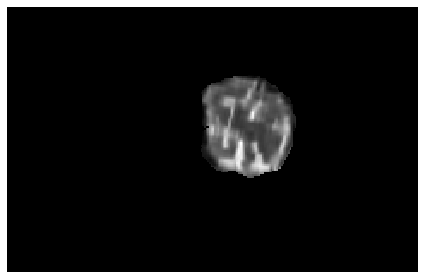

(155, 240)
(155, 240)


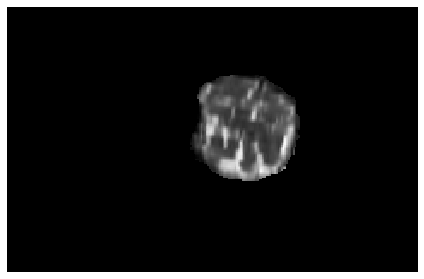

(155, 240)
(155, 240)


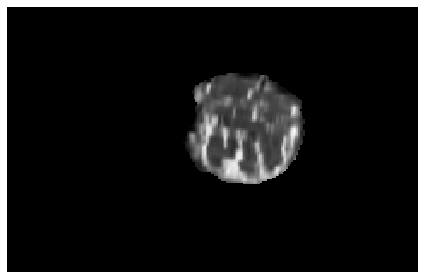

(155, 240)
(155, 240)


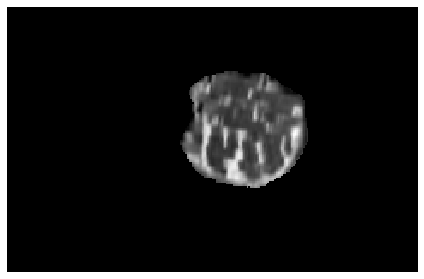

(155, 240)
(155, 240)


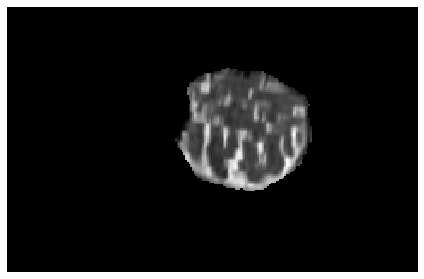

(155, 240)
(155, 240)


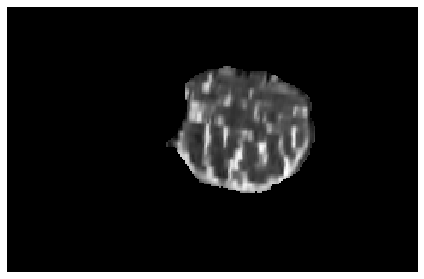

(155, 240)
(155, 240)


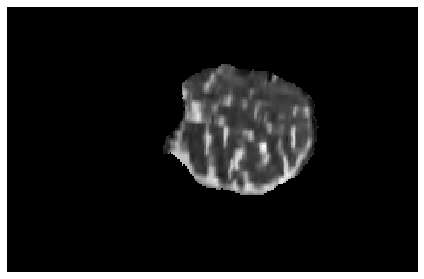

(155, 240)
(155, 240)


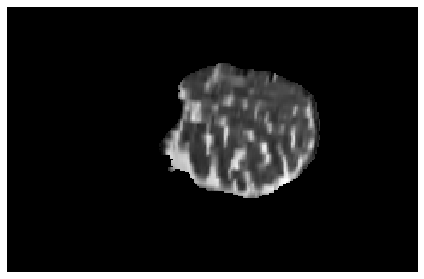

(155, 240)
(155, 240)


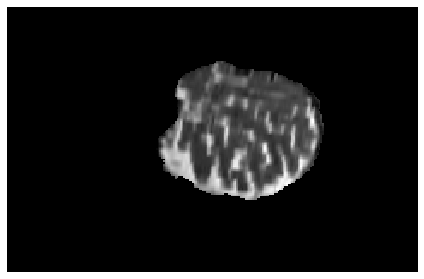

(155, 240)
(155, 240)


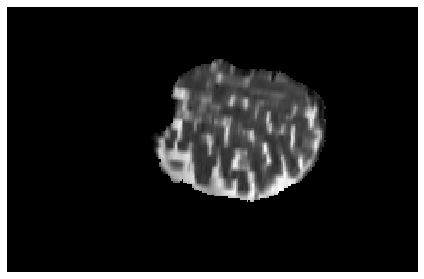

(155, 240)
(155, 240)


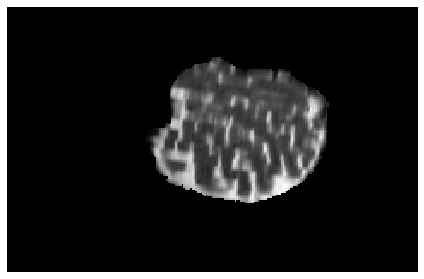

(155, 240)
(155, 240)


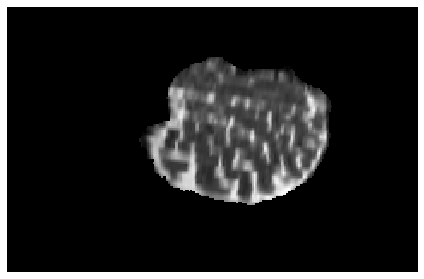

(155, 240)
(155, 240)


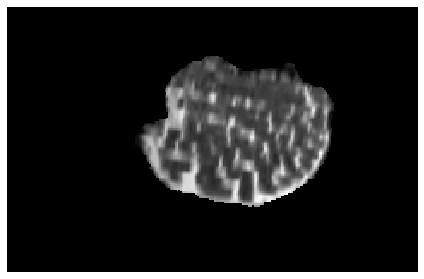

(155, 240)
(155, 240)


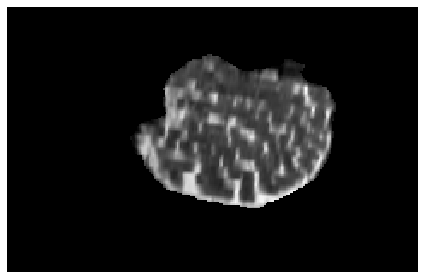

(155, 240)
(155, 240)


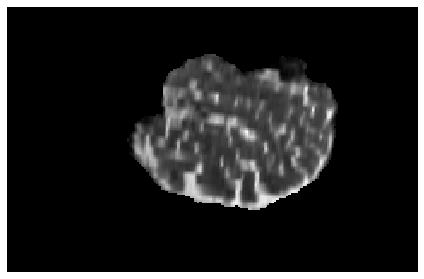

(155, 240)
(155, 240)


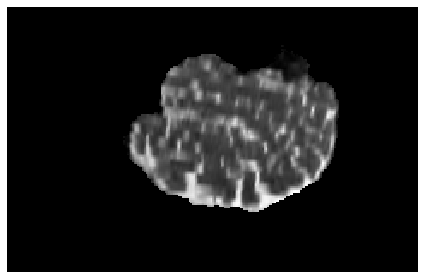

(155, 240)
(155, 240)


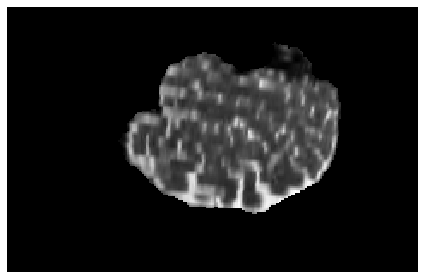

(155, 240)
(155, 240)


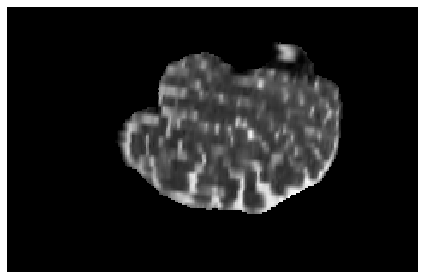

(155, 240)
(155, 240)


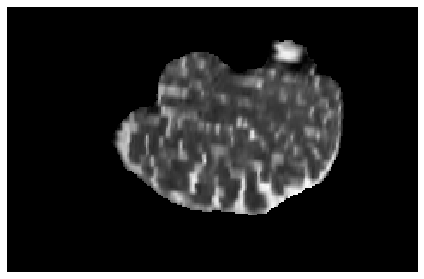

(155, 240)
(155, 240)


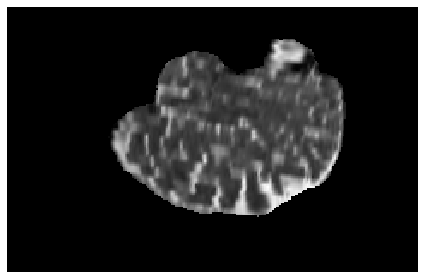

(155, 240)
(155, 240)


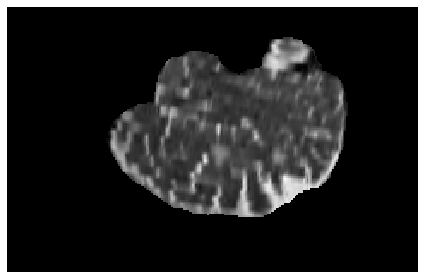

(155, 240)
(155, 240)


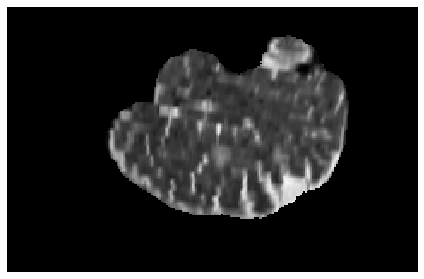

(155, 240)
(155, 240)


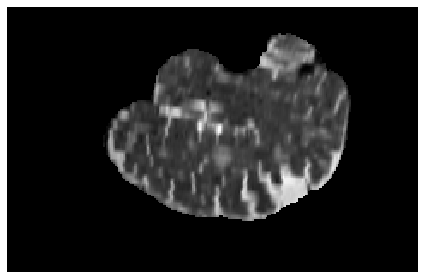

(155, 240)
(155, 240)


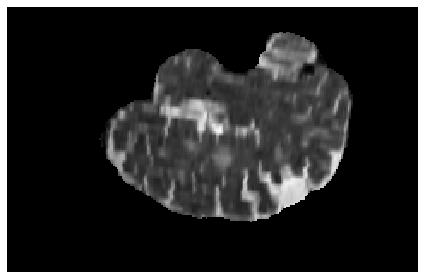

(155, 240)
(155, 240)


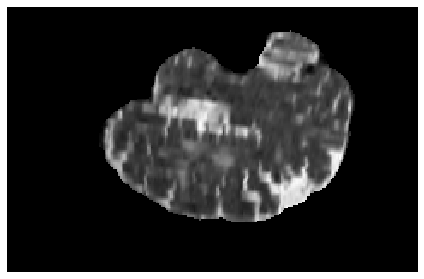

(155, 240)
(155, 240)


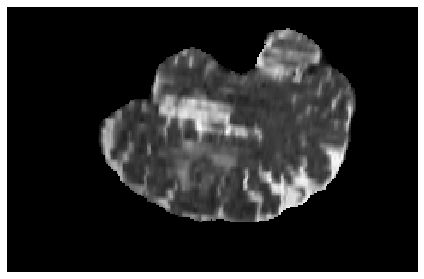

(155, 240)
(155, 240)


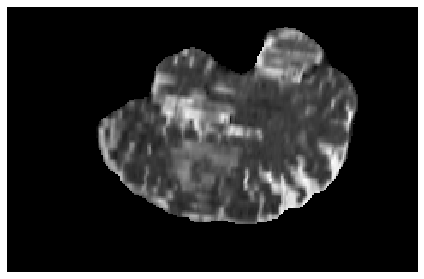

(155, 240)
(155, 240)


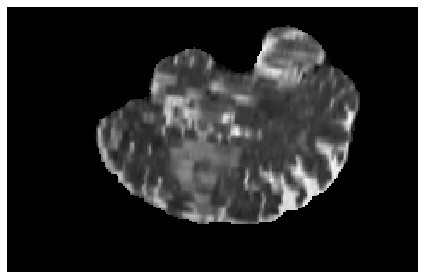

(155, 240)
(155, 240)


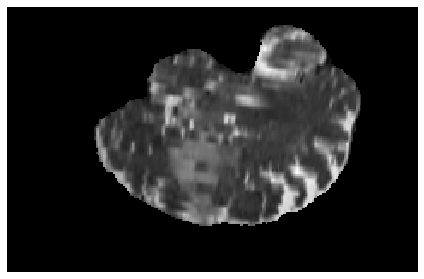

(155, 240)
(155, 240)


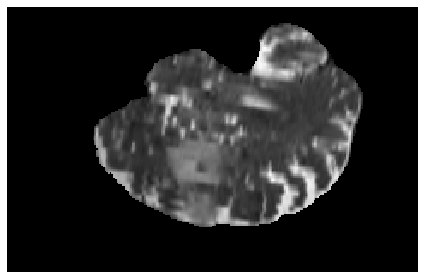

(155, 240)
(155, 240)


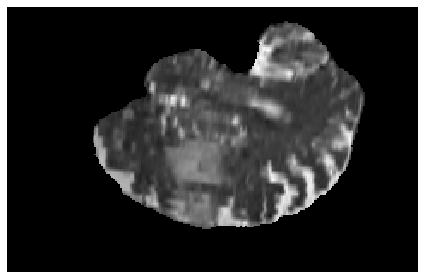

(155, 240)
(155, 240)


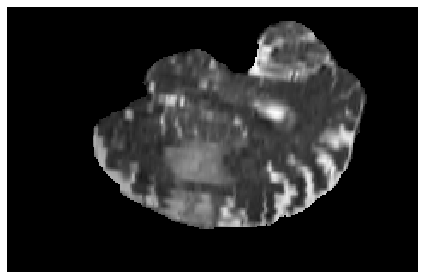

(155, 240)
(155, 240)


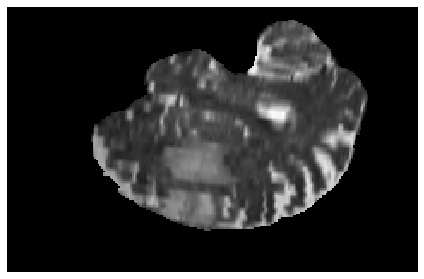

(155, 240)
(155, 240)


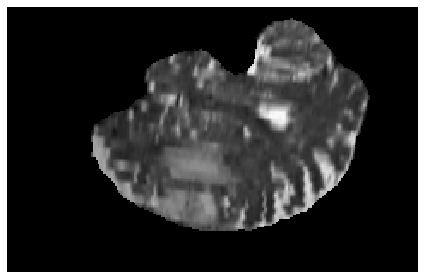

(155, 240)
(155, 240)


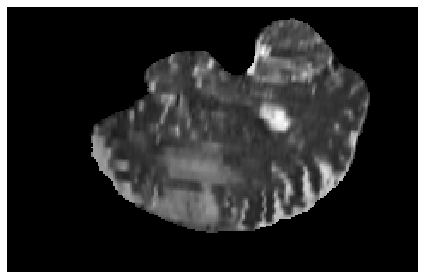

(155, 240)
(155, 240)


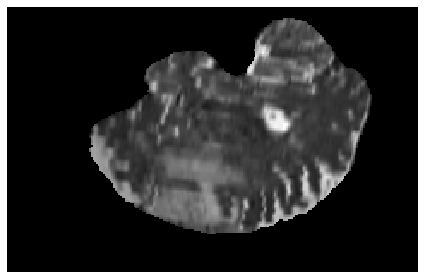

(155, 240)
(155, 240)


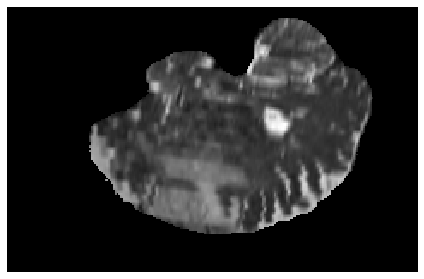

(155, 240)
(155, 240)


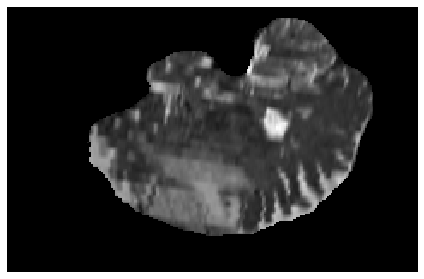

(155, 240)
(155, 240)


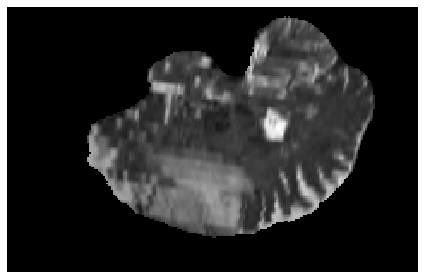

(155, 240)
(155, 240)


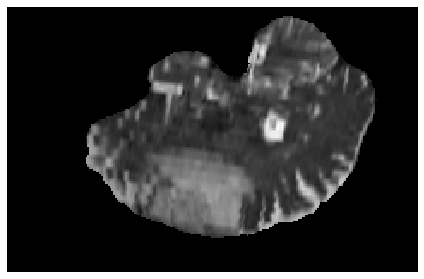

(155, 240)
(155, 240)


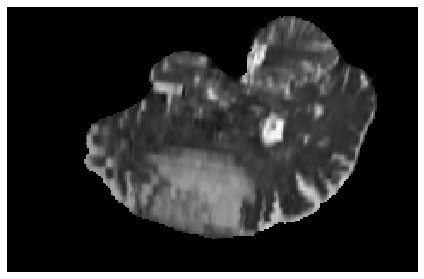

(155, 240)
(155, 240)


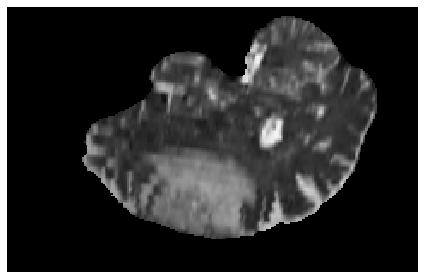

(155, 240)
(155, 240)


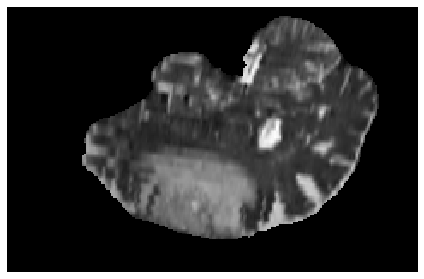

(155, 240)
(155, 240)


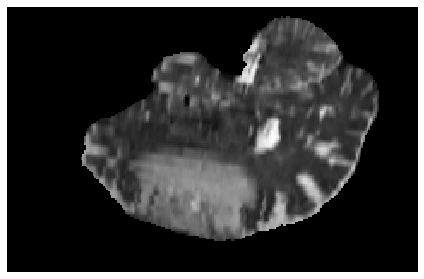

(155, 240)
(155, 240)


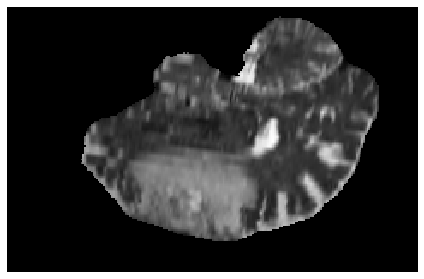

(155, 240)
(155, 240)


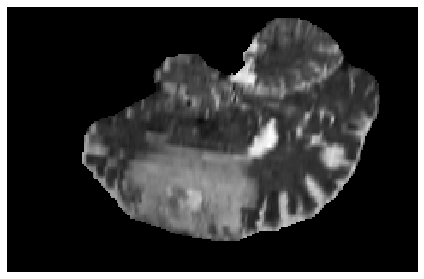

(155, 240)
(155, 240)


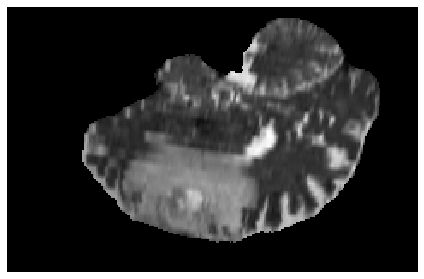

(155, 240)
(155, 240)


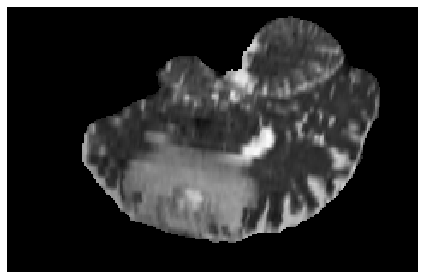

(155, 240)
(155, 240)


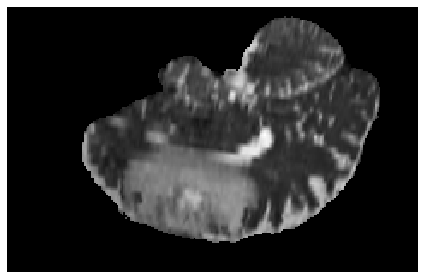

(155, 240)
(155, 240)


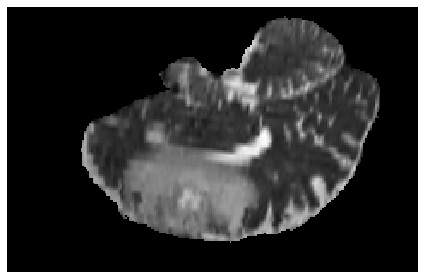

(155, 240)
(155, 240)


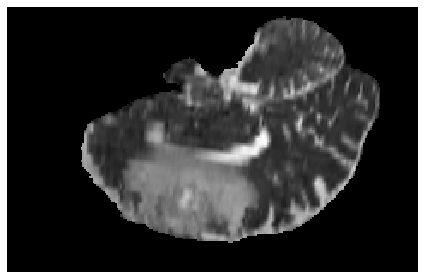

(155, 240)
(155, 240)


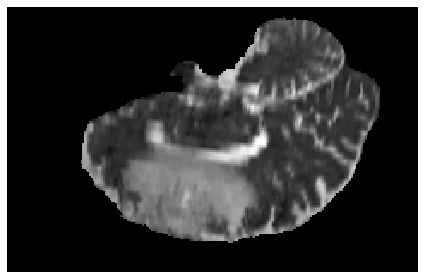

(155, 240)
(155, 240)


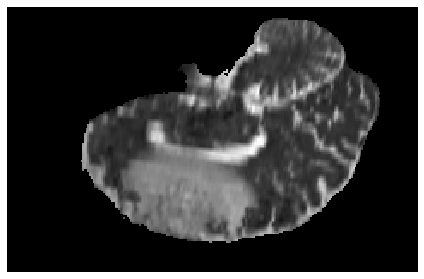

(155, 240)
(155, 240)


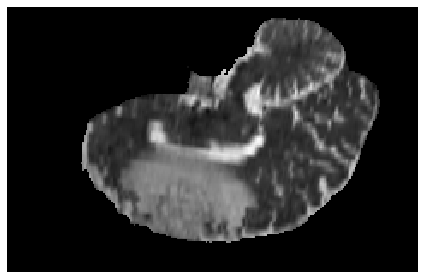

(155, 240)
(155, 240)


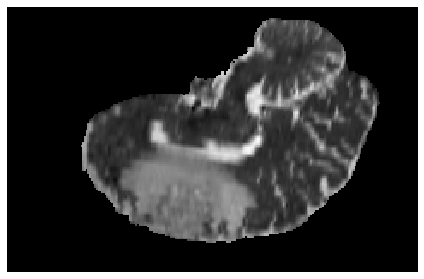

(155, 240)
(155, 240)


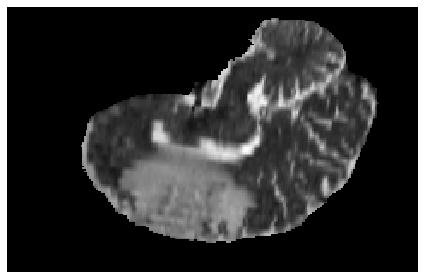

(155, 240)
(155, 240)


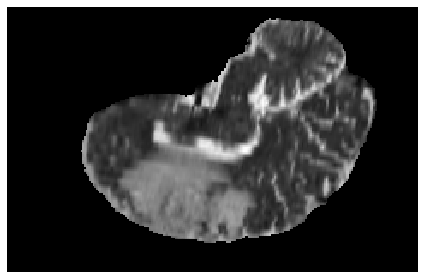

(155, 240)
(155, 240)


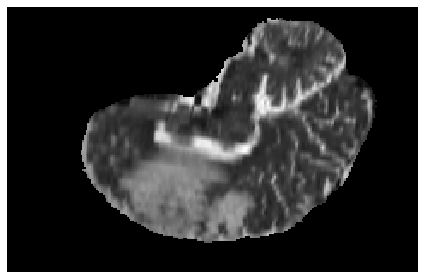

(155, 240)
(155, 240)


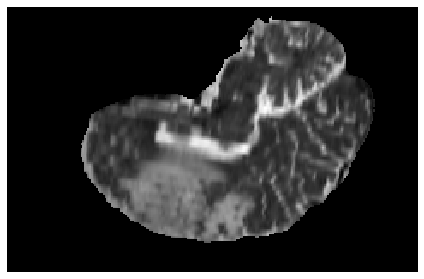

(155, 240)
(155, 240)


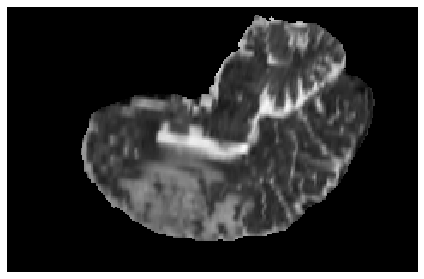

(155, 240)
(155, 240)


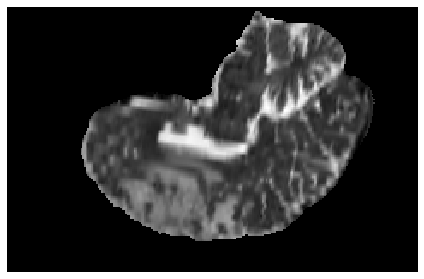

(155, 240)
(155, 240)


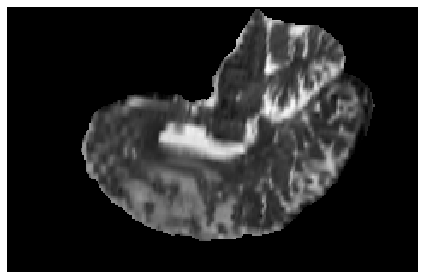

(155, 240)
(155, 240)


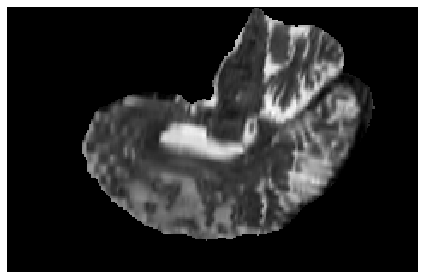

(155, 240)
(155, 240)


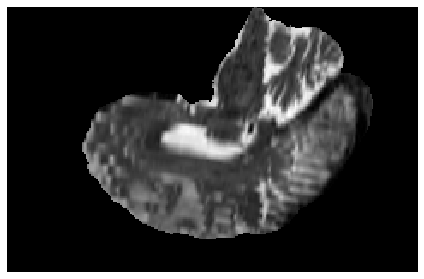

(155, 240)
(155, 240)


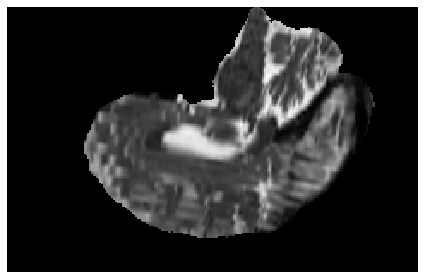

(155, 240)
(155, 240)


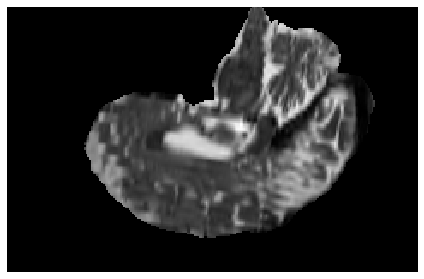

(155, 240)
(155, 240)


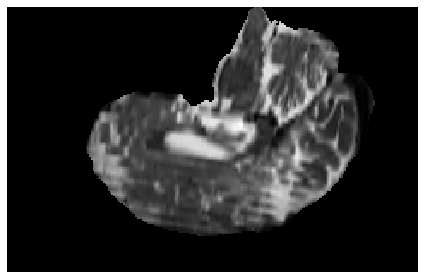

(155, 240)
(155, 240)


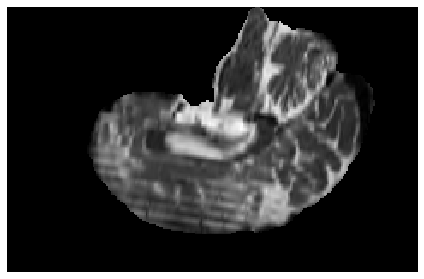

(155, 240)
(155, 240)


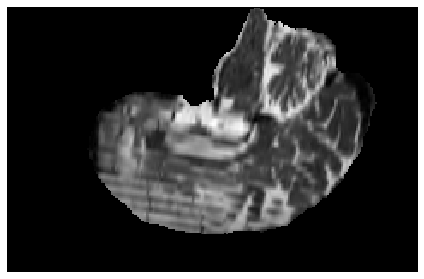

(155, 240)
(155, 240)


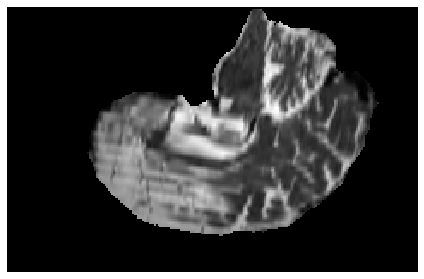

(155, 240)
(155, 240)


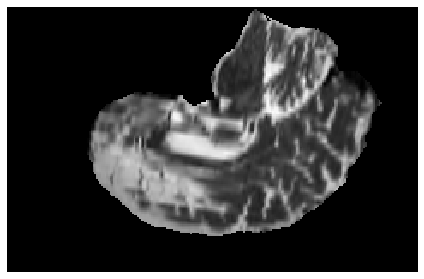

(155, 240)
(155, 240)


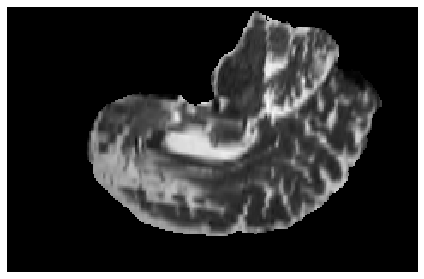

(155, 240)
(155, 240)


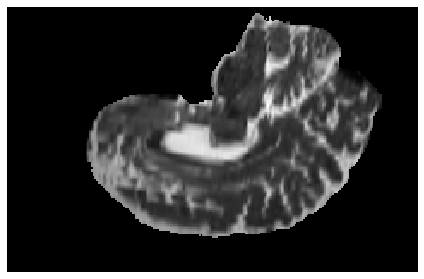

(155, 240)
(155, 240)


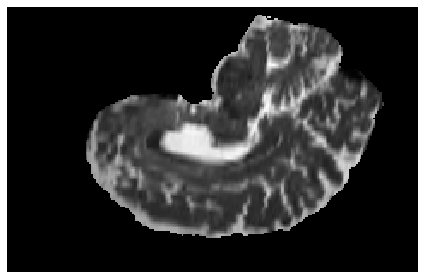

(155, 240)
(155, 240)


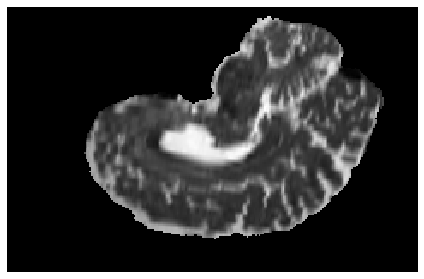

(155, 240)
(155, 240)


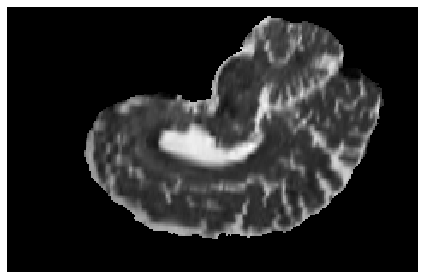

(155, 240)
(155, 240)


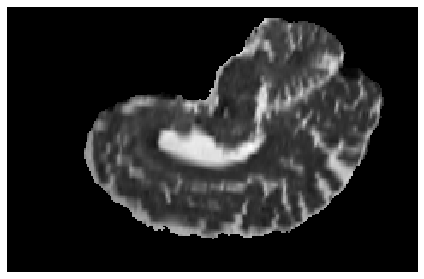

(155, 240)
(155, 240)


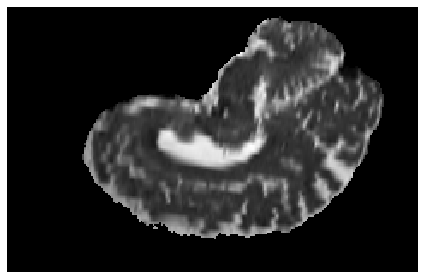

(155, 240)
(155, 240)


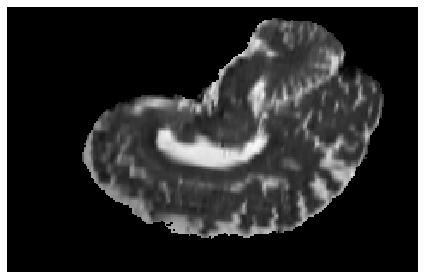

(155, 240)
(155, 240)


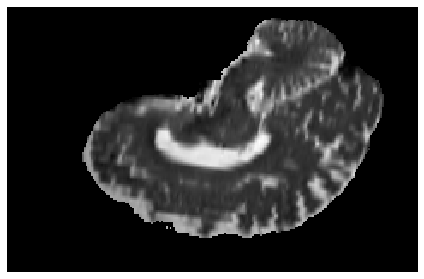

(155, 240)
(155, 240)


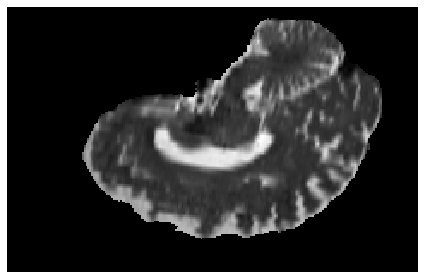

(155, 240)
(155, 240)


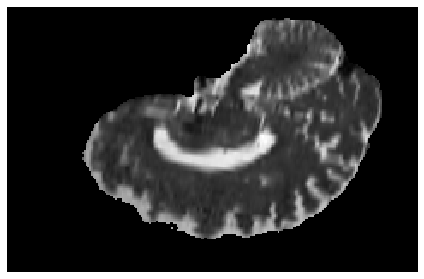

(155, 240)
(155, 240)


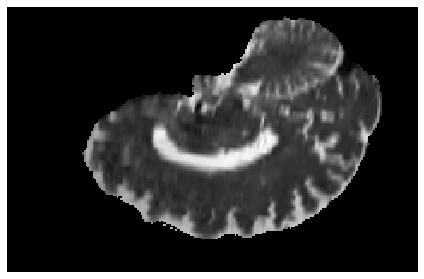

(155, 240)
(155, 240)


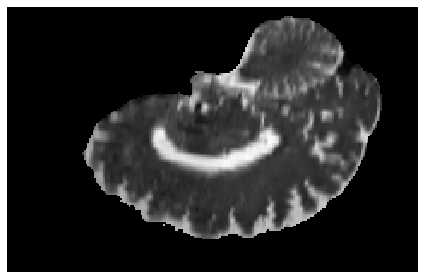

(155, 240)
(155, 240)


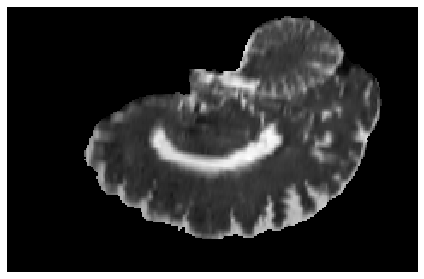

(155, 240)
(155, 240)


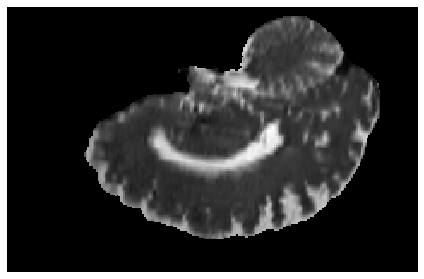

(155, 240)
(155, 240)


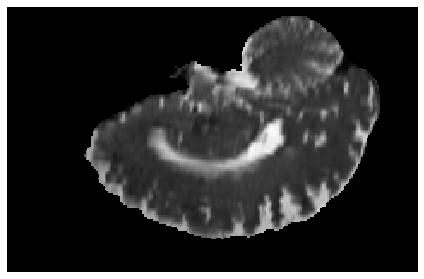

(155, 240)
(155, 240)


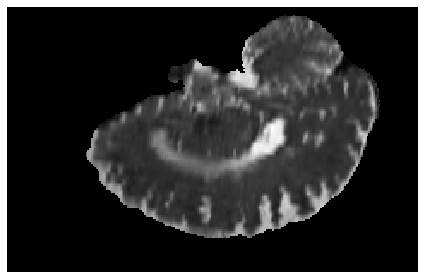

(155, 240)
(155, 240)


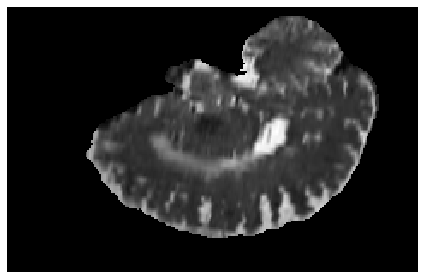

(155, 240)
(155, 240)


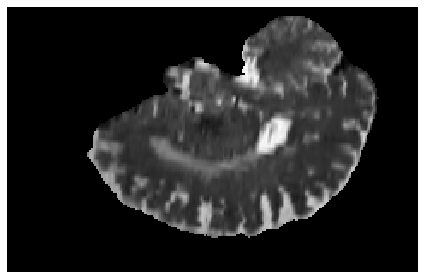

(155, 240)
(155, 240)


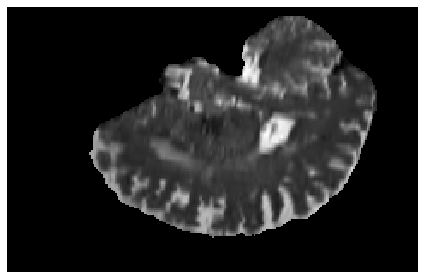

(155, 240)
(155, 240)


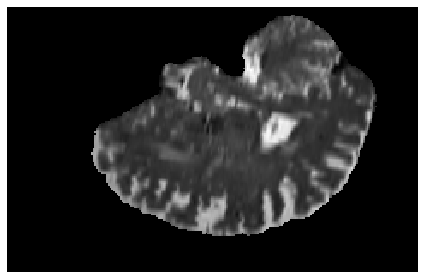

(155, 240)
(155, 240)


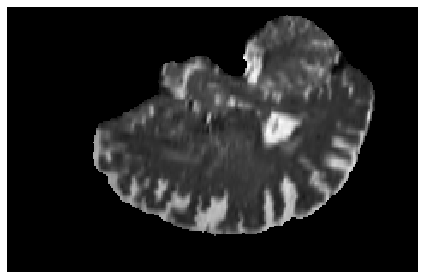

(155, 240)
(155, 240)


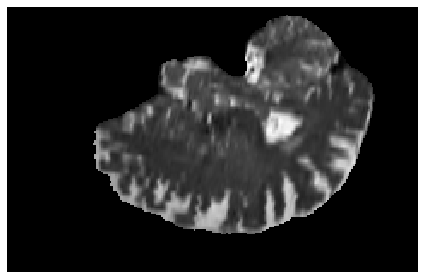

(155, 240)
(155, 240)


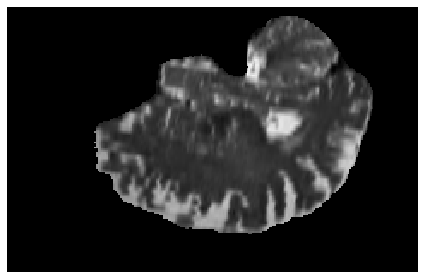

(155, 240)
(155, 240)


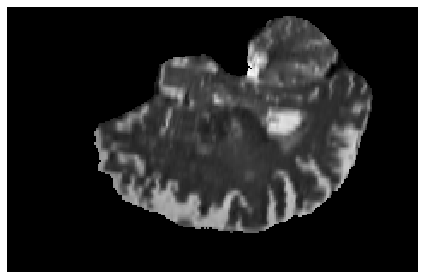

(155, 240)
(155, 240)


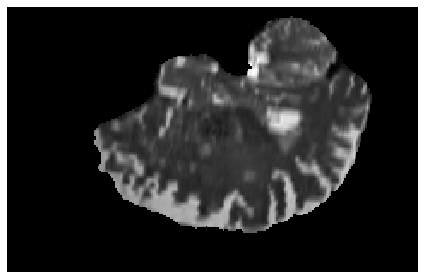

(155, 240)
(155, 240)


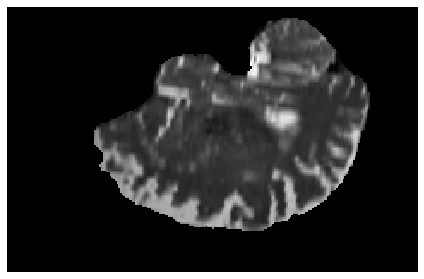

(155, 240)
(155, 240)


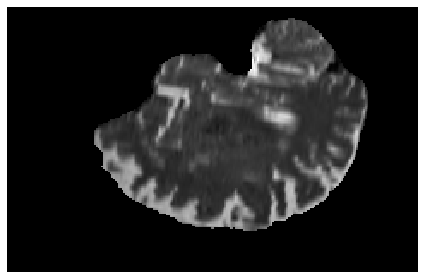

(155, 240)
(155, 240)


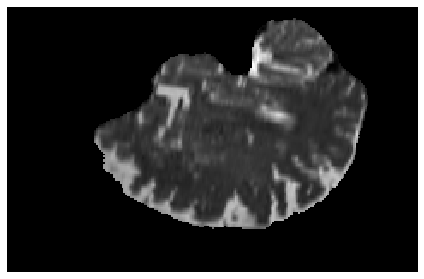

(155, 240)
(155, 240)


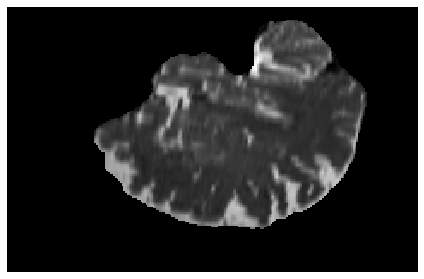

(155, 240)
(155, 240)


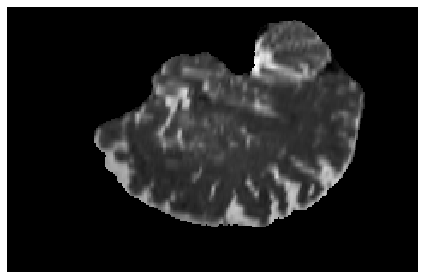

(155, 240)
(155, 240)


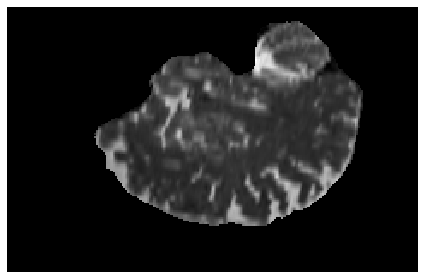

(155, 240)
(155, 240)


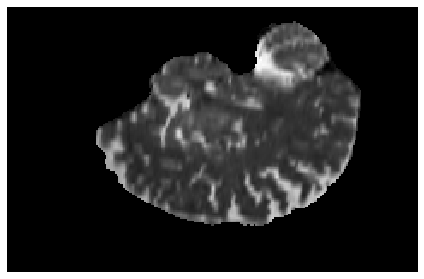

(155, 240)
(155, 240)


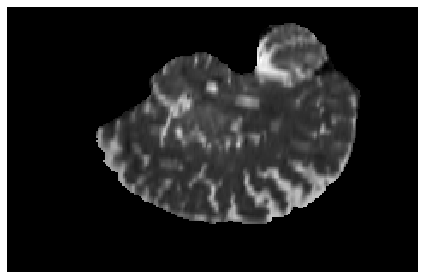

(155, 240)
(155, 240)


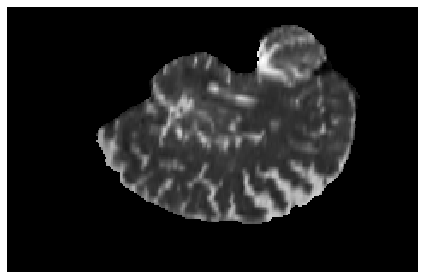

(155, 240)
(155, 240)


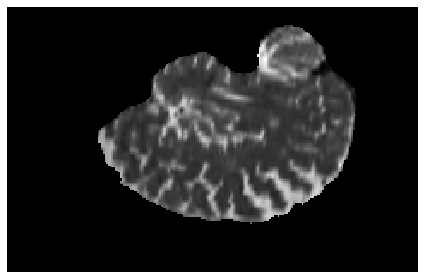

(155, 240)
(155, 240)


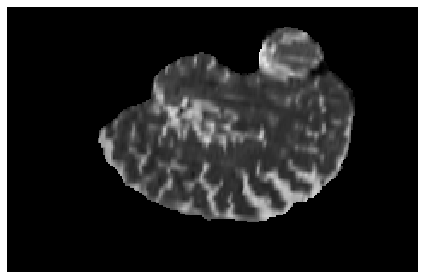

(155, 240)
(155, 240)


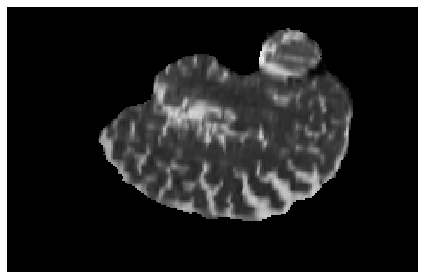

(155, 240)
(155, 240)


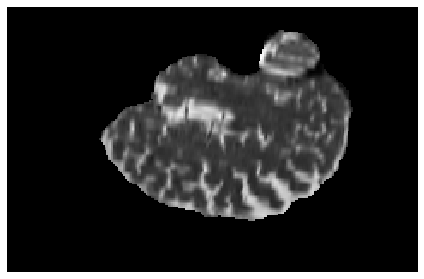

(155, 240)
(155, 240)


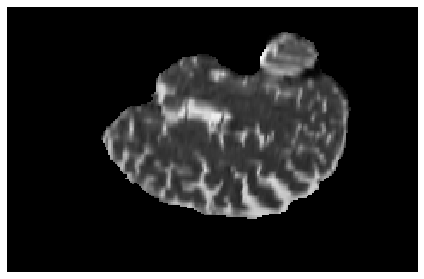

(155, 240)
(155, 240)


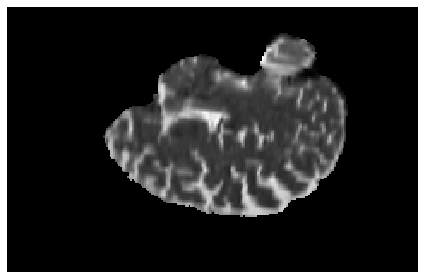

(155, 240)
(155, 240)


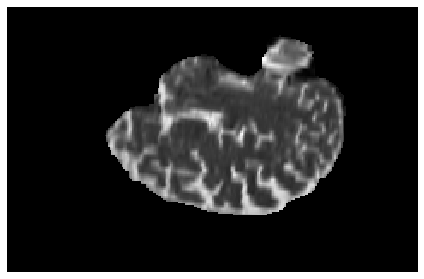

(155, 240)
(155, 240)


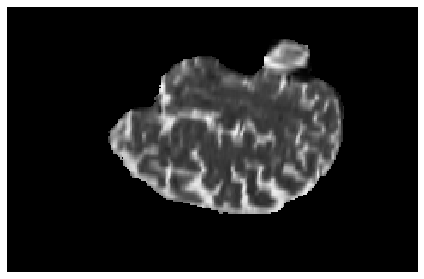

(155, 240)
(155, 240)


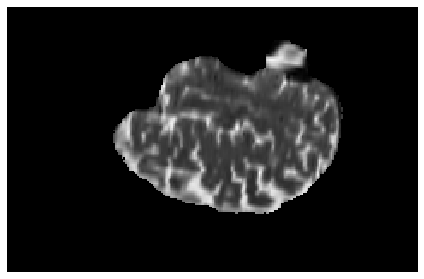

(155, 240)
(155, 240)


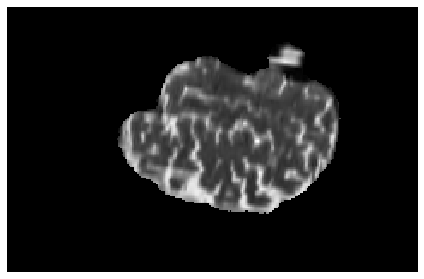

(155, 240)
(155, 240)


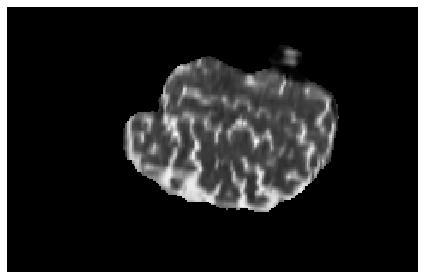

(155, 240)
(155, 240)


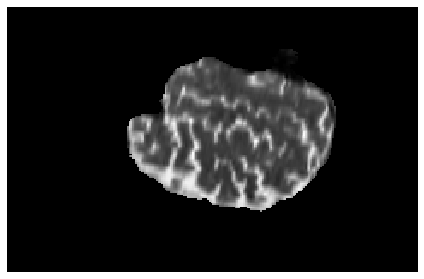

(155, 240)
(155, 240)


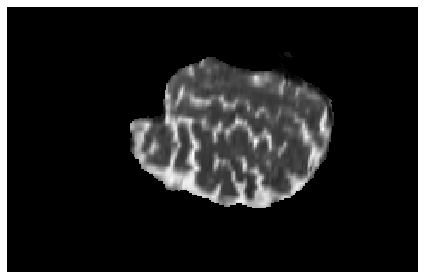

(155, 240)
(155, 240)


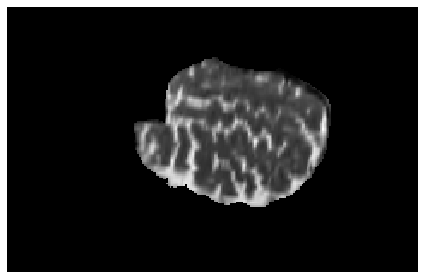

(155, 240)
(155, 240)


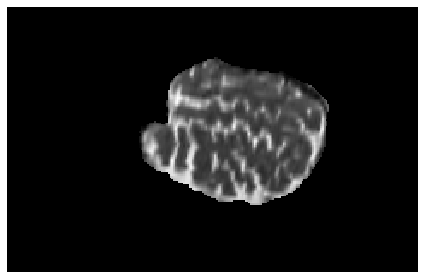

(155, 240)
(155, 240)


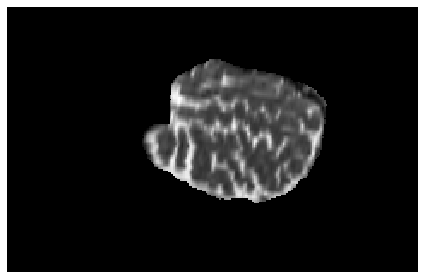

(155, 240)
(155, 240)


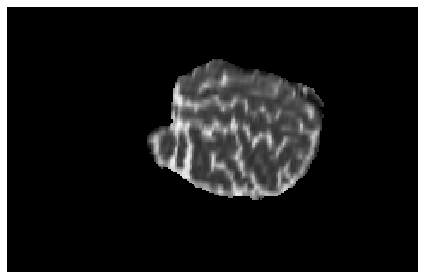

(155, 240)
(155, 240)


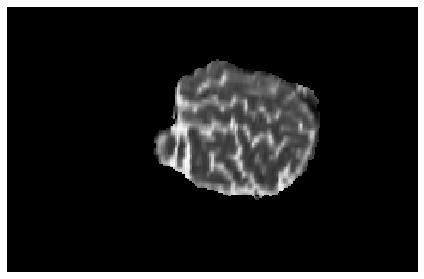

(155, 240)
(155, 240)


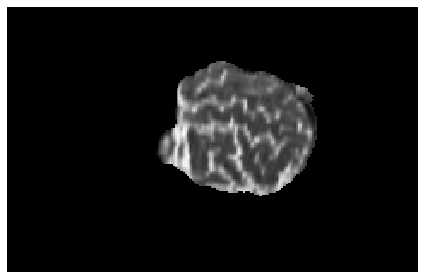

(155, 240)
(155, 240)


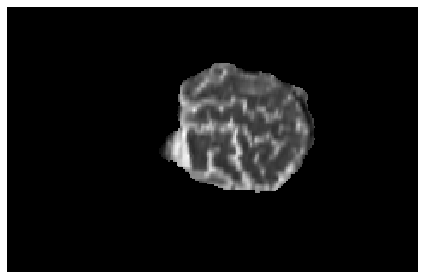

(155, 240)
(155, 240)


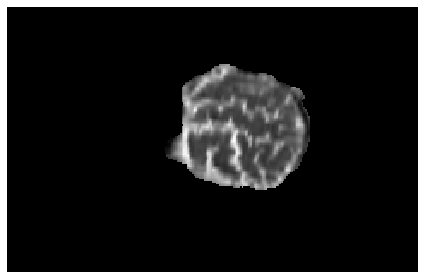

(155, 240)
(155, 240)


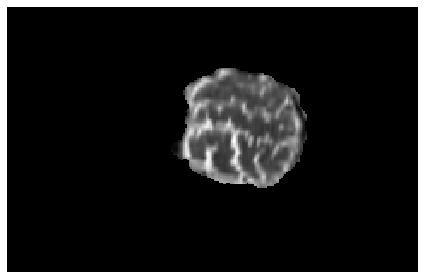

(155, 240)
(155, 240)


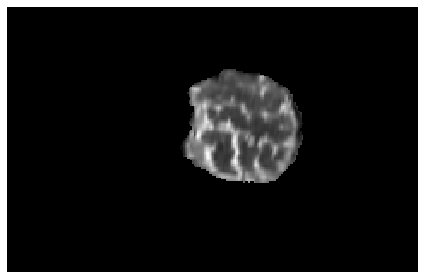

(155, 240)
(155, 240)


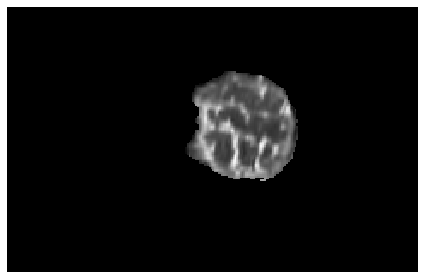

(155, 240)
(155, 240)


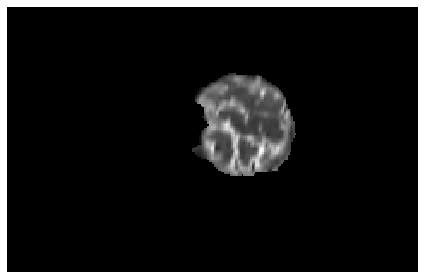

(155, 240)
(155, 240)


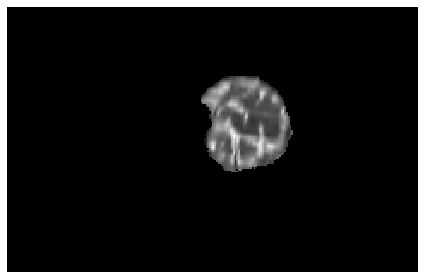

(155, 240)
(155, 240)


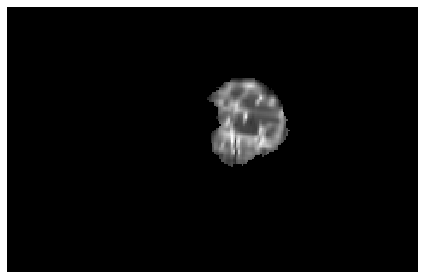

(155, 240)
(155, 240)


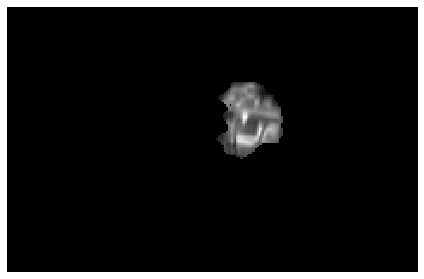

(155, 240)
(155, 240)


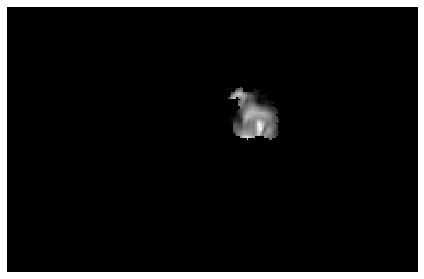

(155, 240)
(155, 240)


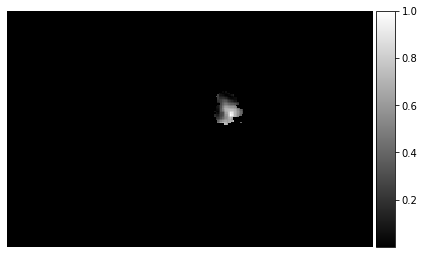

(155, 240)
(155, 240)


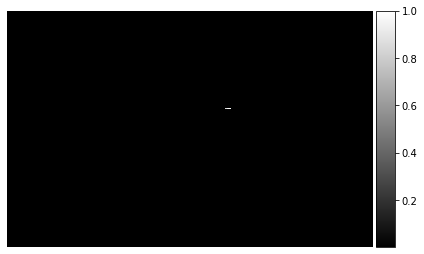

(155, 240)
(155, 240)


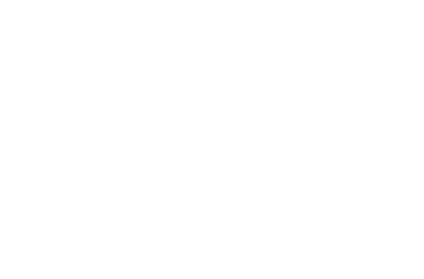

(155, 240)
(155, 240)


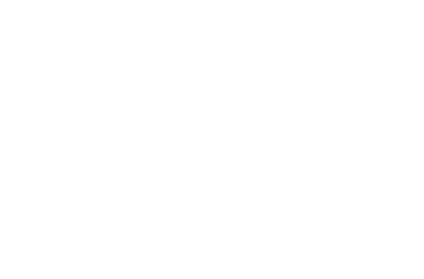

(155, 240)
(155, 240)


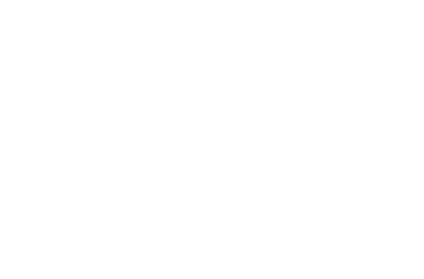

(155, 240)
(155, 240)


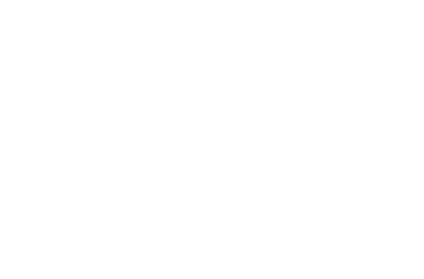

(155, 240)
(155, 240)


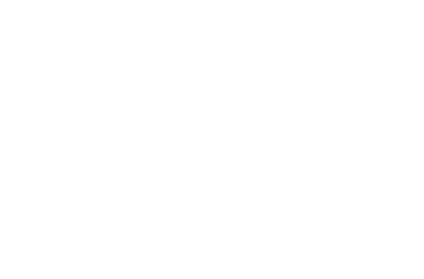

(155, 240)
(155, 240)


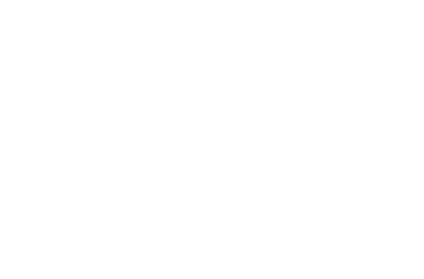

(155, 240)
(155, 240)


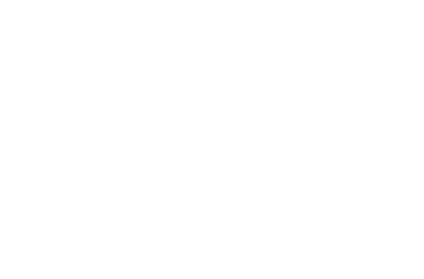

(155, 240)
(155, 240)


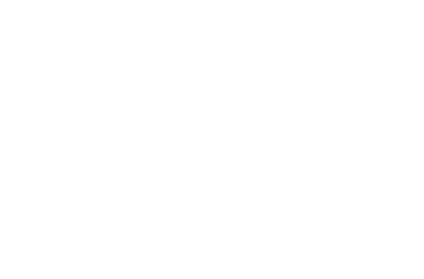

(155, 240)
(155, 240)


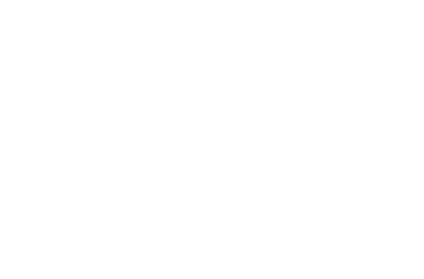

(155, 240)
(155, 240)


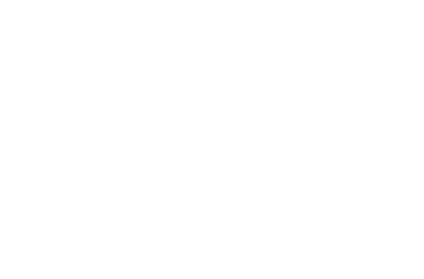

(155, 240)
(155, 240)


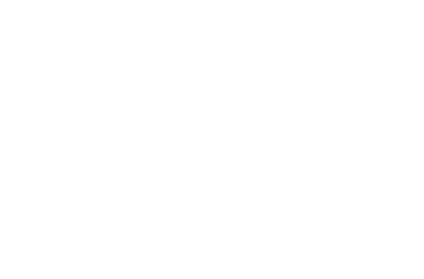

(155, 240)
(155, 240)


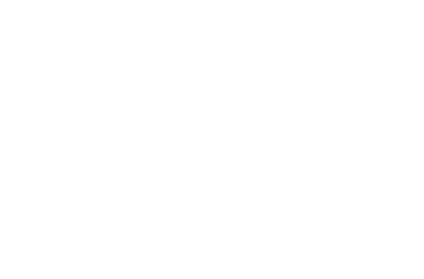

(155, 240)
(155, 240)


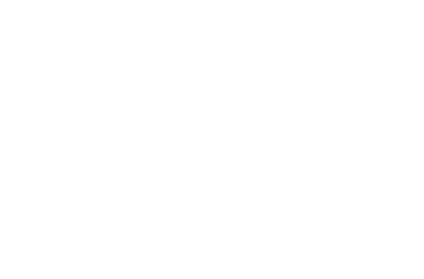

(155, 240)
(155, 240)


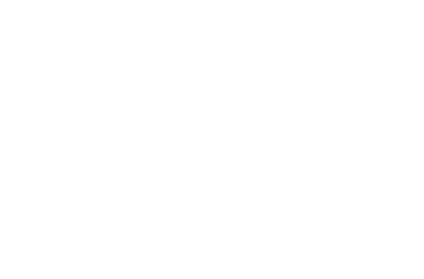

(155, 240)
(155, 240)


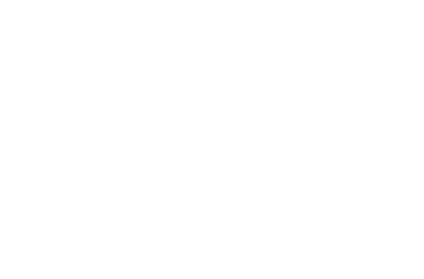

(155, 240)
(155, 240)


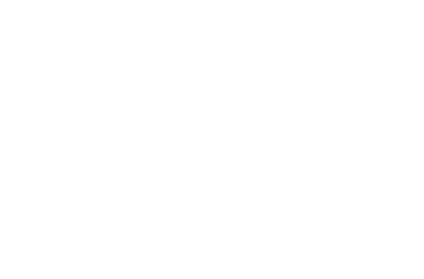

(155, 240)
(155, 240)


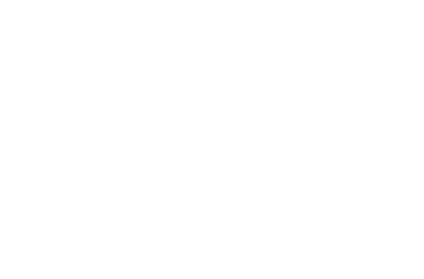

(155, 240)
(155, 240)


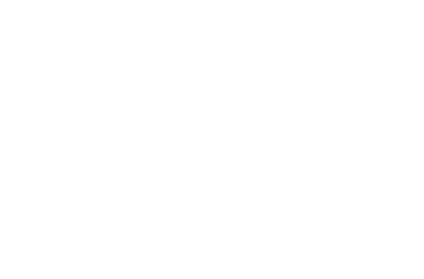

(155, 240)
(155, 240)


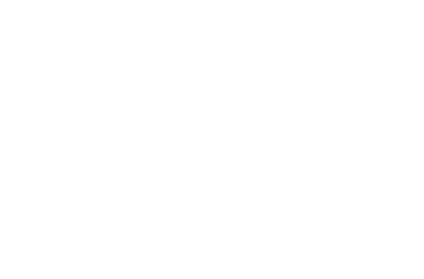

(155, 240)
(155, 240)


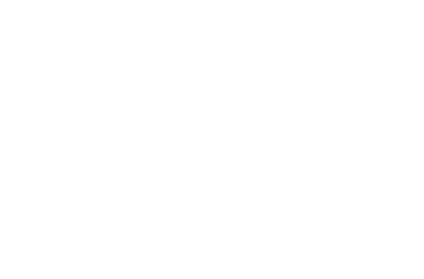

(155, 240)
(155, 240)


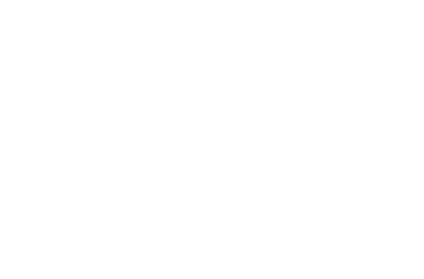

(155, 240)
(155, 240)


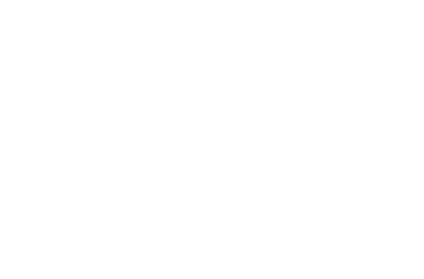

(155, 240)
(155, 240)


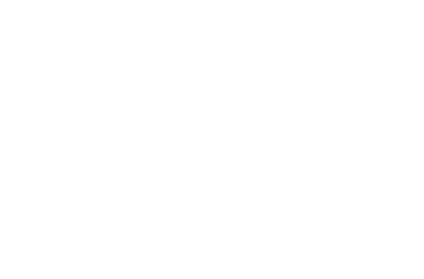

(155, 240)
(155, 240)


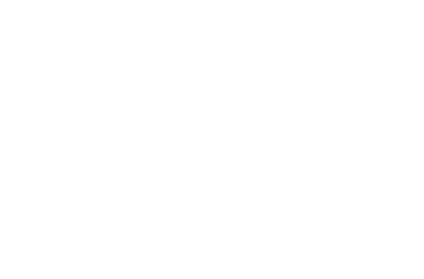

(155, 240)
(155, 240)


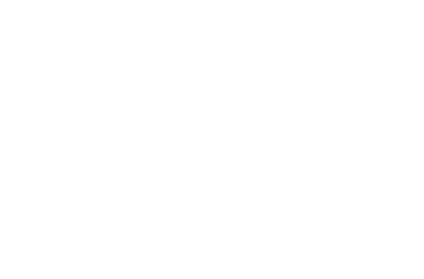

(155, 240)
(155, 240)


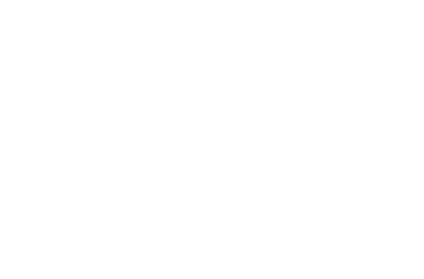

(155, 240)
(155, 240)


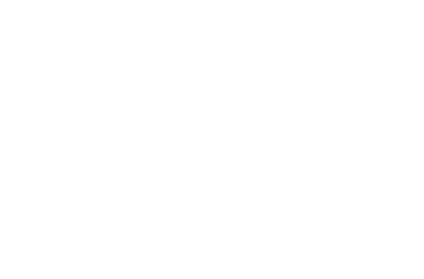

(155, 240)
(155, 240)


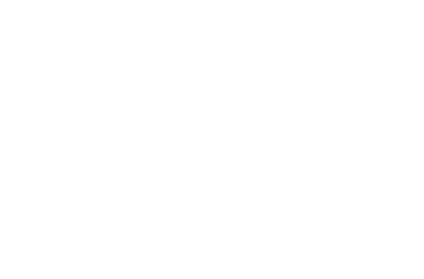

(155, 240)
(155, 240)


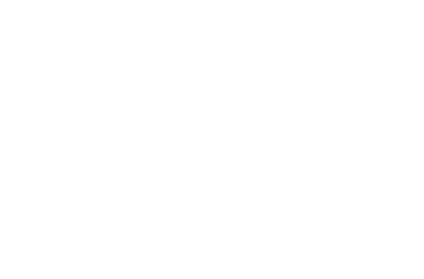

(155, 240)
(155, 240)


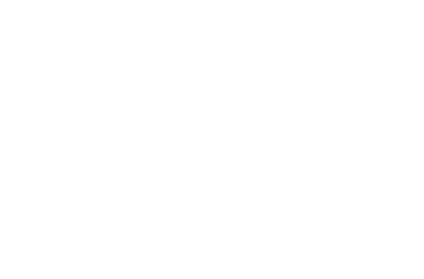

(155, 240)
(155, 240)


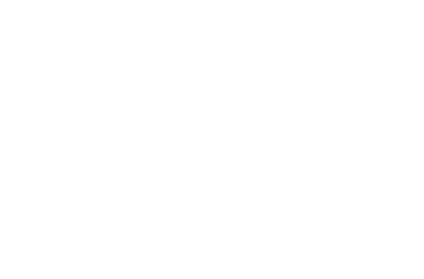

(155, 240)
(155, 240)


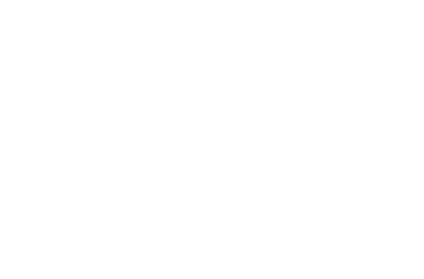

(155, 240)
(155, 240)


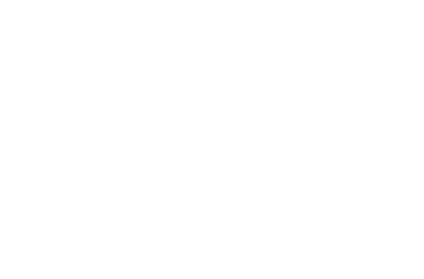

(155, 240)
(155, 240)


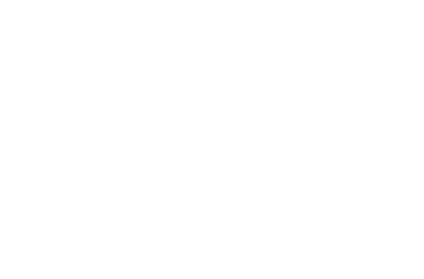

(155, 240)
(155, 240)


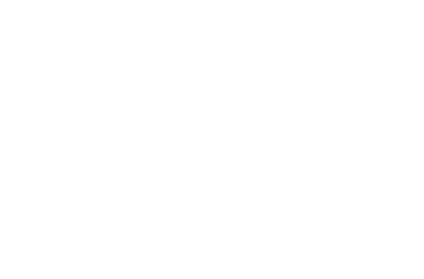

(155, 240)
(155, 240)


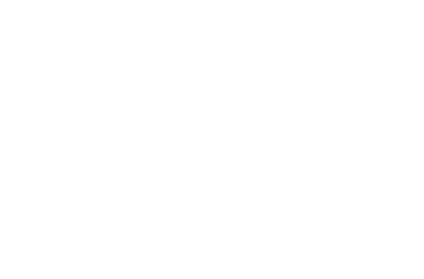

(155, 240)
(155, 240)


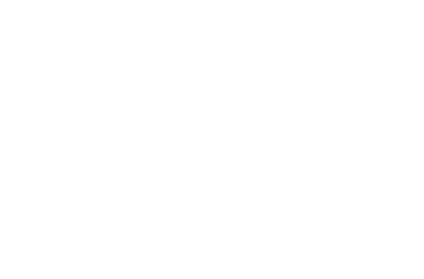

(155, 240)
(155, 240)


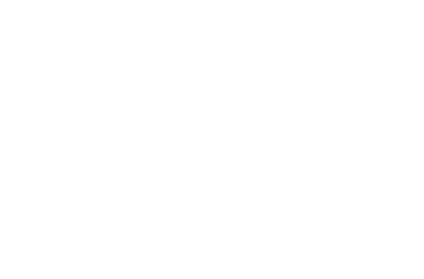

(155, 240)
(155, 240)


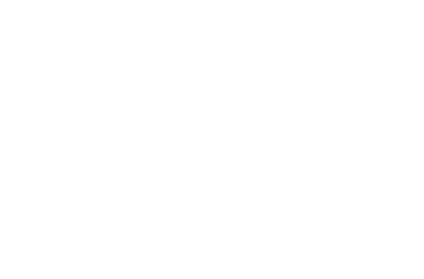

(155, 240)
(155, 240)


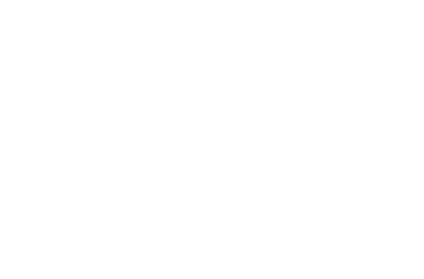

(155, 240)
(155, 240)


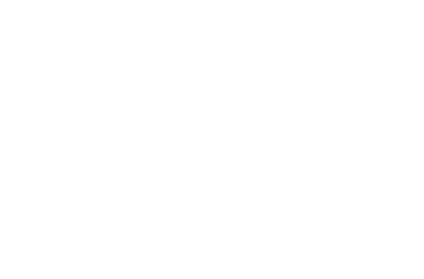

(155, 240)
(155, 240)


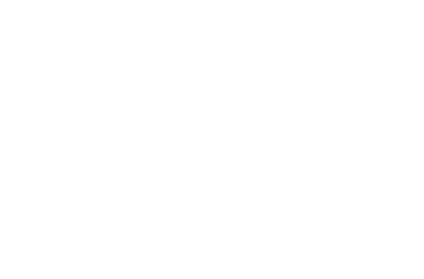

(155, 240)
(155, 240)


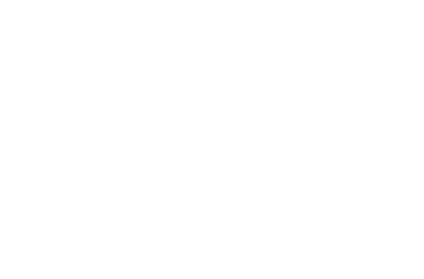

(155, 240)
(155, 240)


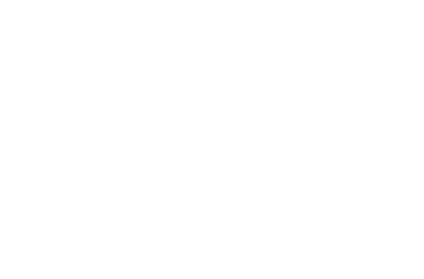

(155, 240)
(155, 240)


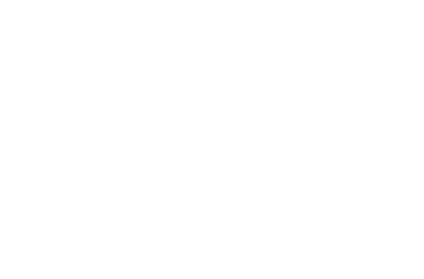

(155, 240)
(155, 240)


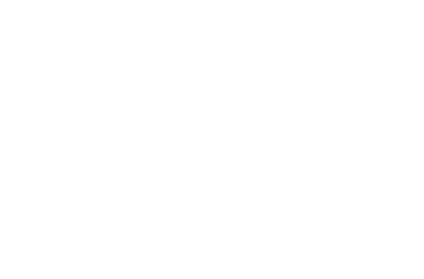

(155, 240)
(155, 240)


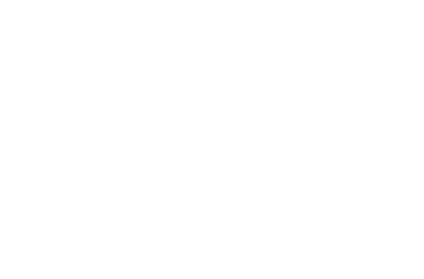

(155, 240)
(155, 240)


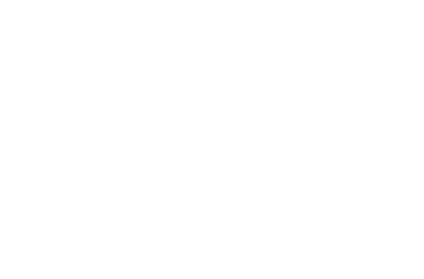

(155, 240)
(155, 240)


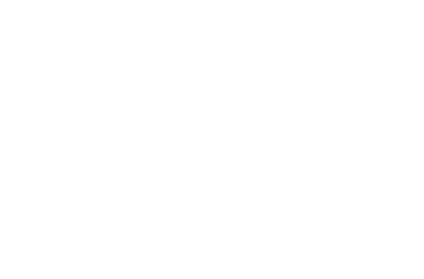

(155, 240)
(155, 240)


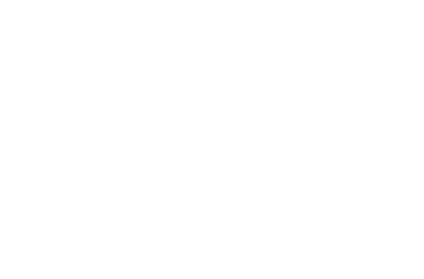

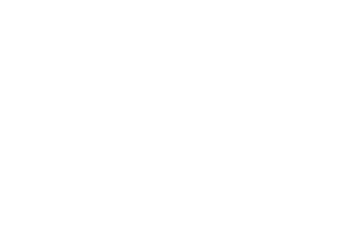

In [ ]:
root_path = '/content/drive/MyDrive/Training_115_Segmentation/T2/Sagittal/'
#path = os.path.join(os.path.join(root_path), 'Ground_Truth_Overlap')
path = os.path.join(os.path.join(root_path), 'Brain_MRI')
#path = os.path.join(os.path.join(root_path), 'Prediction_Overlap')

for i in range(240):
  brainMRI = all_modalities[:, :, i, 0]
  #GroundTruth = gt[:,:,i,0]
  Predicted = prediction[:,:,i,0]
  print(brainMRI.shape)
  print(Predicted.shape)
  visualization=show_segmented_image(brainMRI,Predicted)
  i=str(i)
  j = "brain_name" + i + ".jpg"
  path1 = os.path.join(os.path.join(path), j)
  #io.imshow(visualization)
  #For visualizing Segmented regions use below line of code
  io.imshow(visualization,cmap="gray")
  fig1 = plt.gcf()
  plt.show()
  plt.draw()
  plt.axis('off')
  fig1.savefig(path1, bbox_inches='tight', pad_inches = 0)

# Saving the Visualizations of Axial overlapped segmented regions
* Use the following code line for saving the overlapped ground truth region on the Axial brain MRI Sequence
```
# brainMRI = all_modalities[i, :, :, 0]
# GroundTruth = gt[i,:,:,0]
```
* Use the following code line for saving the overlapped predicted region on the Axial brain MRI Sequence
```
# brainMRI = all_modalities[i, :, :, 0]
# Predicted = prediction[i,:,:,0]
```

  

(240, 240)
(240, 240)


/usr/local/lib/python3.7/dist-packages/skimage/io/_plugins/matplotlib_plugin.py:150: UserWarning: Low image data range; displaying image with stretched contrast.
  lo, hi, cmap = _get_display_range(image)


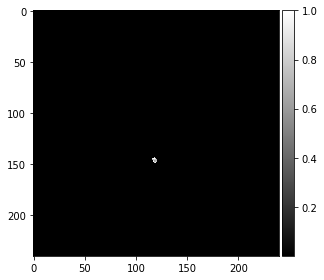

(240, 240)
(240, 240)


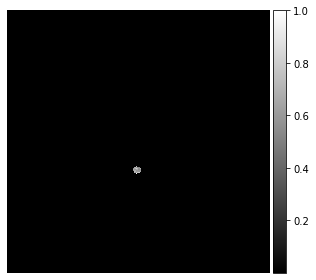

(240, 240)
(240, 240)


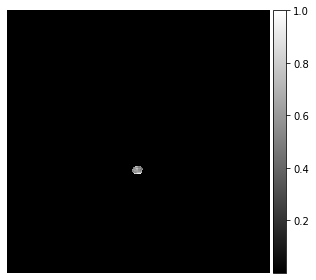

(240, 240)
(240, 240)


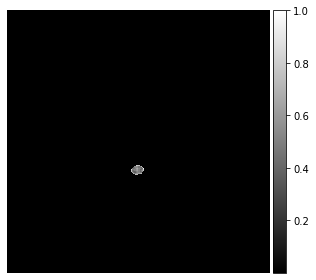

(240, 240)
(240, 240)


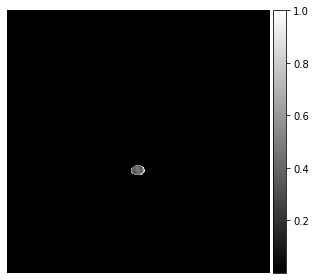

(240, 240)
(240, 240)


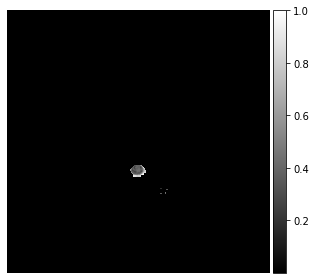

(240, 240)
(240, 240)


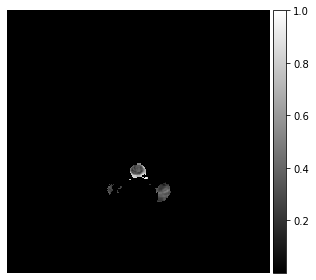

(240, 240)
(240, 240)


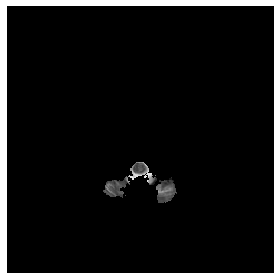

(240, 240)
(240, 240)


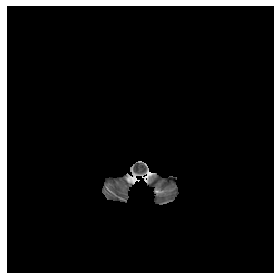

(240, 240)
(240, 240)


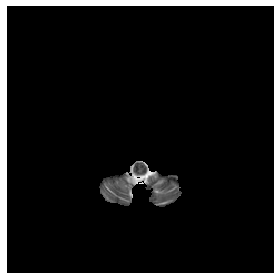

(240, 240)
(240, 240)


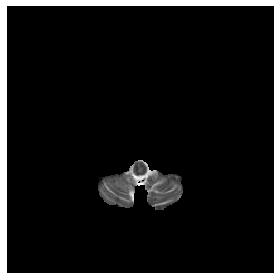

(240, 240)
(240, 240)


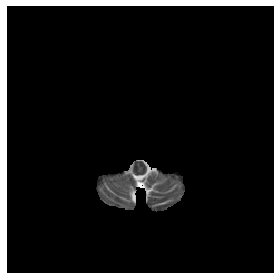

(240, 240)
(240, 240)


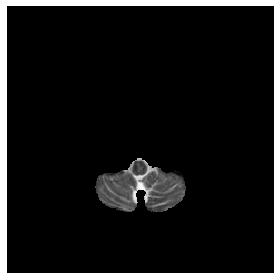

(240, 240)
(240, 240)


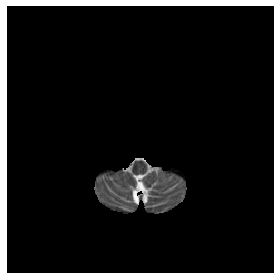

(240, 240)
(240, 240)


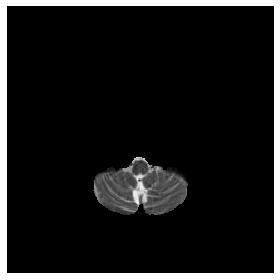

(240, 240)
(240, 240)


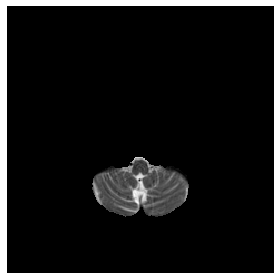

(240, 240)
(240, 240)


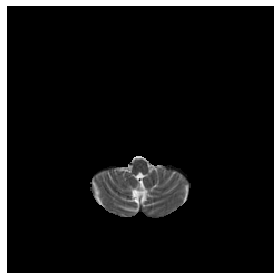

(240, 240)
(240, 240)


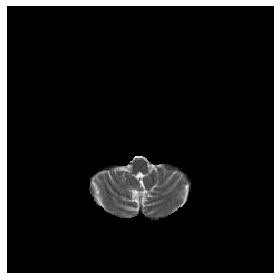

(240, 240)
(240, 240)


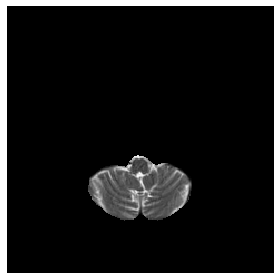

(240, 240)
(240, 240)


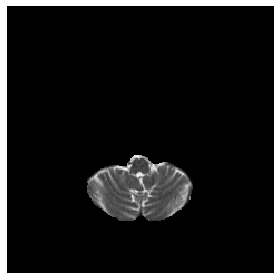

(240, 240)
(240, 240)


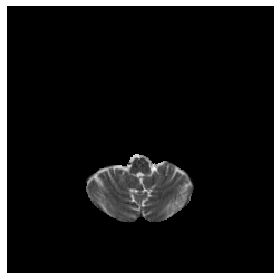

(240, 240)
(240, 240)


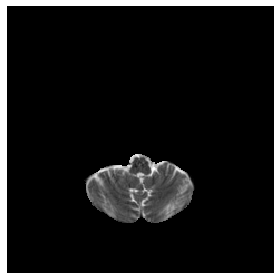

(240, 240)
(240, 240)


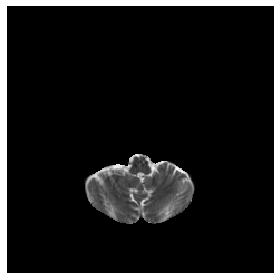

(240, 240)
(240, 240)


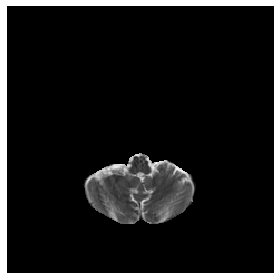

(240, 240)
(240, 240)


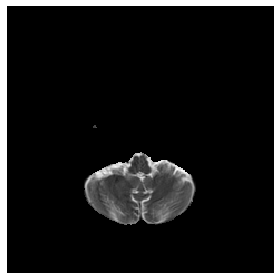

(240, 240)
(240, 240)


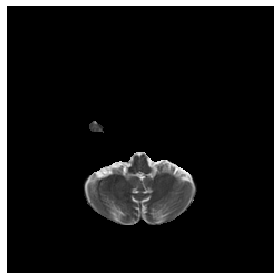

(240, 240)
(240, 240)


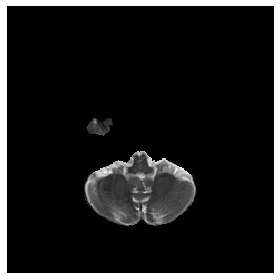

(240, 240)
(240, 240)


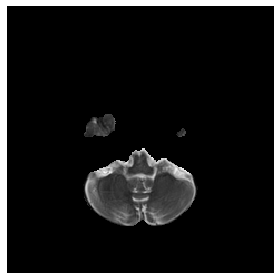

(240, 240)
(240, 240)


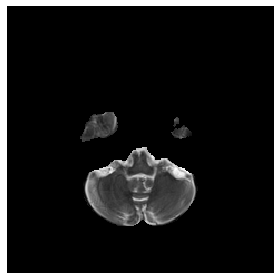

(240, 240)
(240, 240)


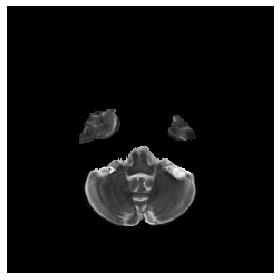

(240, 240)
(240, 240)


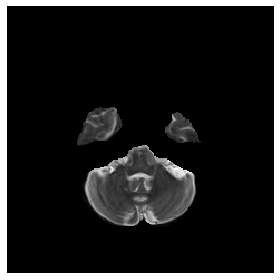

(240, 240)
(240, 240)


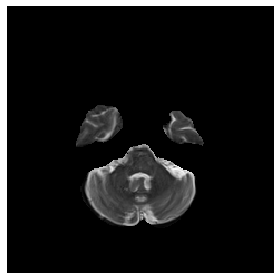

(240, 240)
(240, 240)


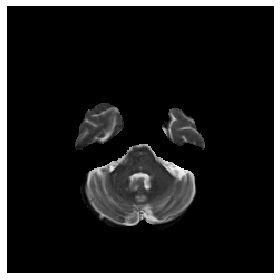

(240, 240)
(240, 240)


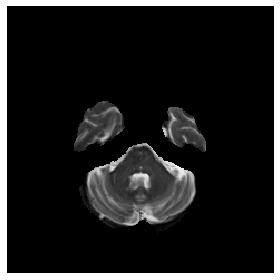

(240, 240)
(240, 240)


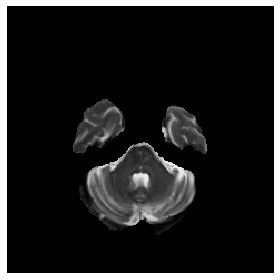

(240, 240)
(240, 240)


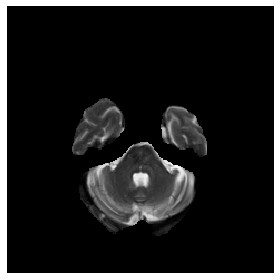

(240, 240)
(240, 240)


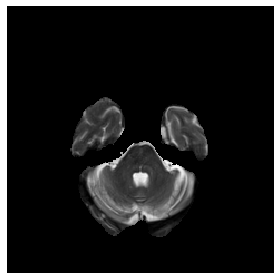

(240, 240)
(240, 240)


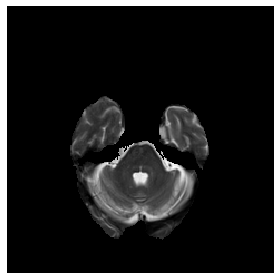

(240, 240)
(240, 240)


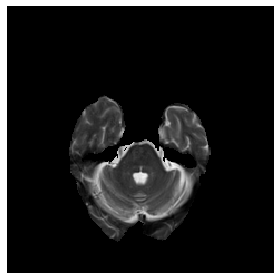

(240, 240)
(240, 240)


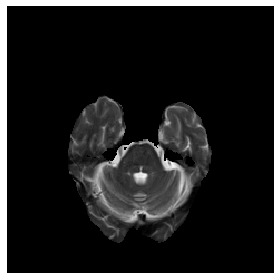

(240, 240)
(240, 240)


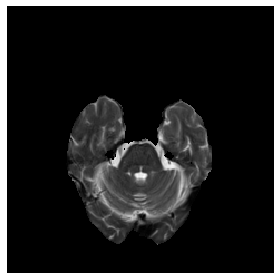

(240, 240)
(240, 240)


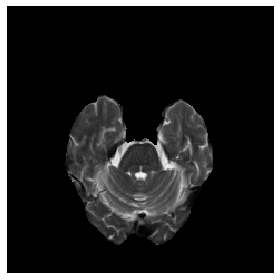

(240, 240)
(240, 240)


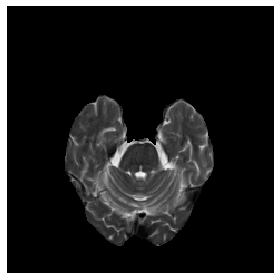

(240, 240)
(240, 240)


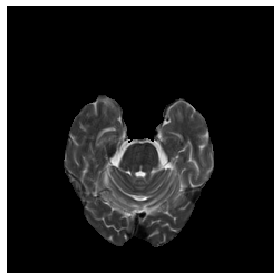

(240, 240)
(240, 240)


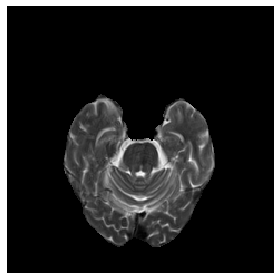

(240, 240)
(240, 240)


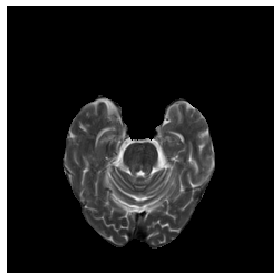

(240, 240)
(240, 240)


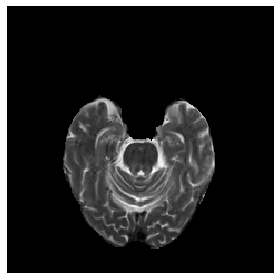

(240, 240)
(240, 240)


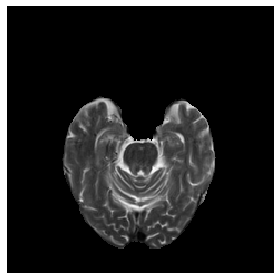

(240, 240)
(240, 240)


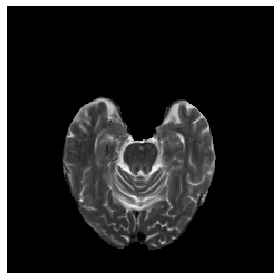

(240, 240)
(240, 240)


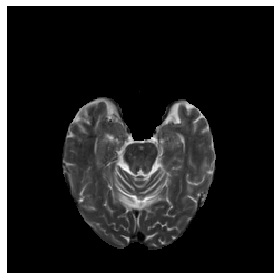

(240, 240)
(240, 240)


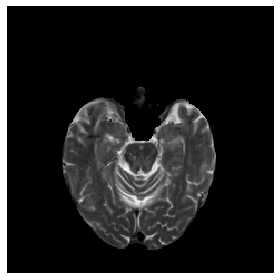

(240, 240)
(240, 240)


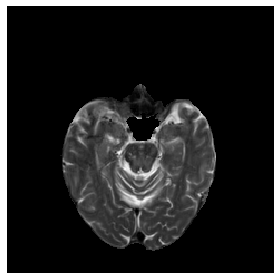

(240, 240)
(240, 240)


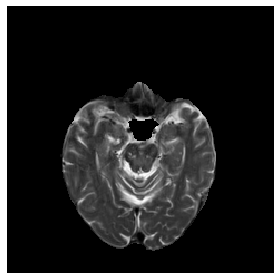

(240, 240)
(240, 240)


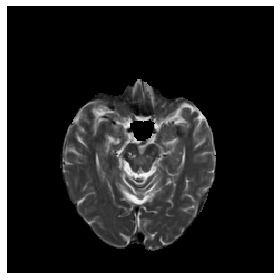

(240, 240)
(240, 240)


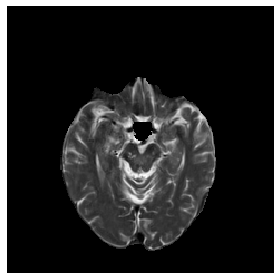

(240, 240)
(240, 240)


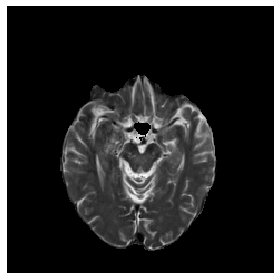

(240, 240)
(240, 240)


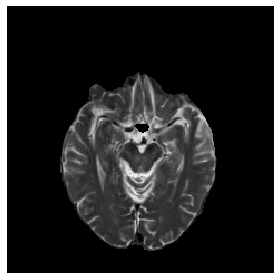

(240, 240)
(240, 240)


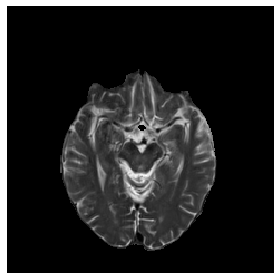

(240, 240)
(240, 240)


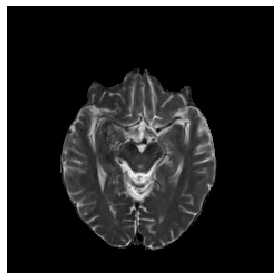

(240, 240)
(240, 240)


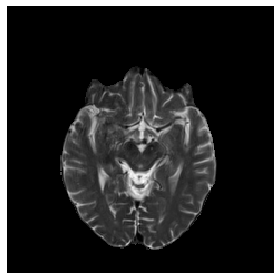

(240, 240)
(240, 240)


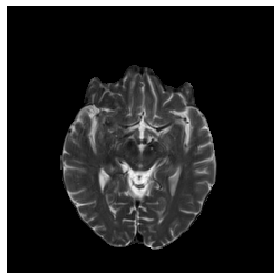

(240, 240)
(240, 240)


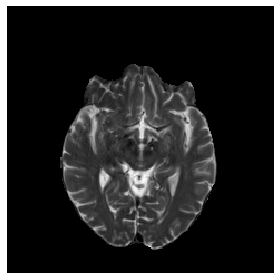

(240, 240)
(240, 240)


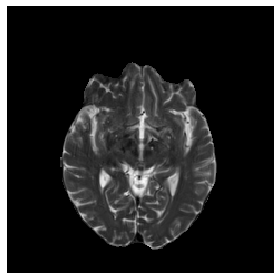

(240, 240)
(240, 240)


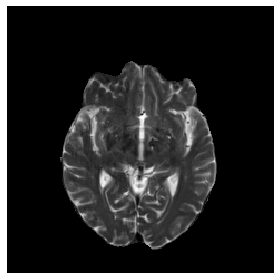

(240, 240)
(240, 240)


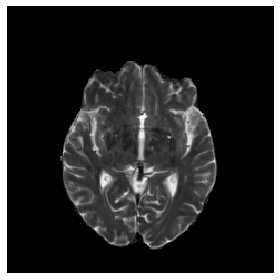

(240, 240)
(240, 240)


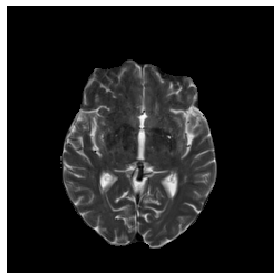

(240, 240)
(240, 240)


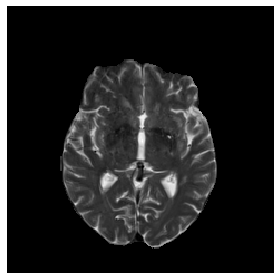

(240, 240)
(240, 240)


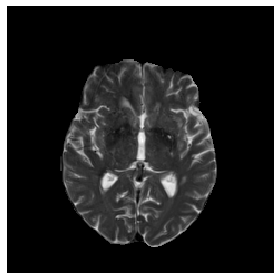

(240, 240)
(240, 240)


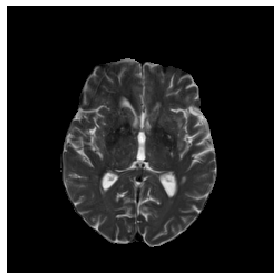

(240, 240)
(240, 240)


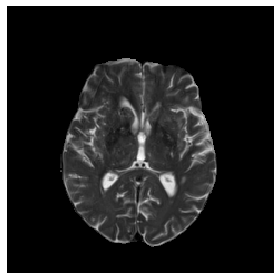

(240, 240)
(240, 240)


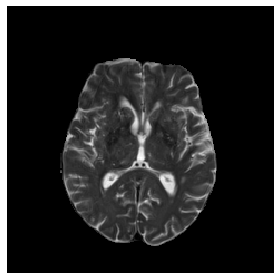

(240, 240)
(240, 240)


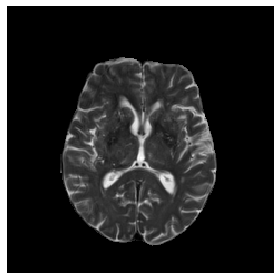

(240, 240)
(240, 240)


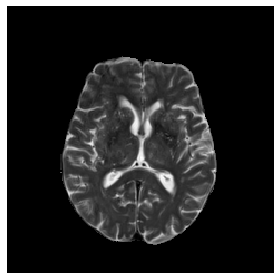

(240, 240)
(240, 240)


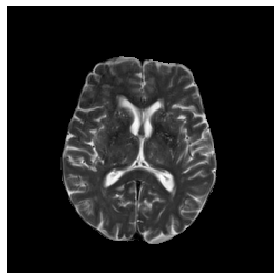

(240, 240)
(240, 240)


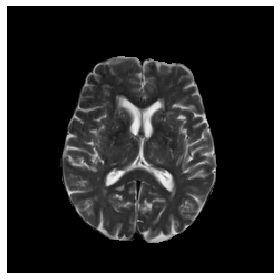

(240, 240)
(240, 240)


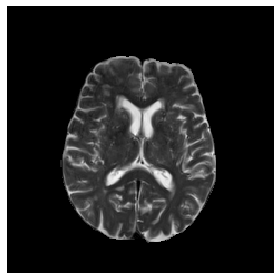

(240, 240)
(240, 240)


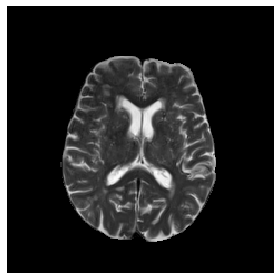

(240, 240)
(240, 240)


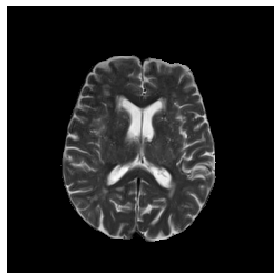

(240, 240)
(240, 240)


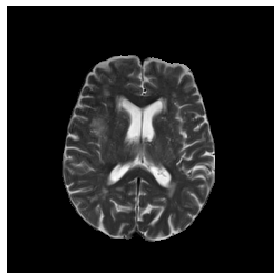

(240, 240)
(240, 240)


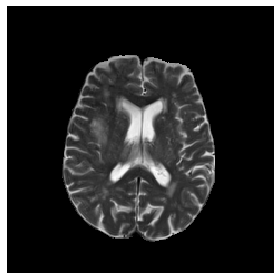

(240, 240)
(240, 240)


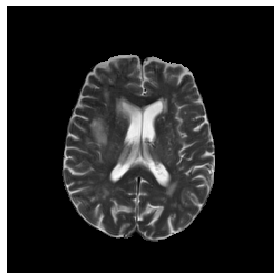

(240, 240)
(240, 240)


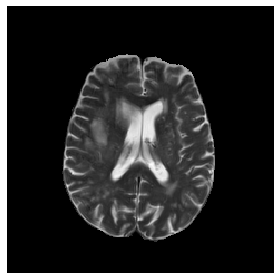

(240, 240)
(240, 240)


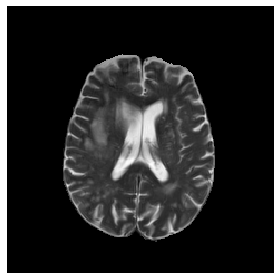

(240, 240)
(240, 240)


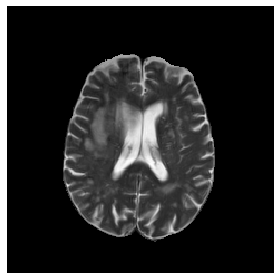

(240, 240)
(240, 240)


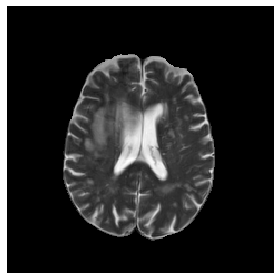

(240, 240)
(240, 240)


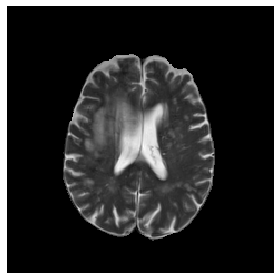

(240, 240)
(240, 240)


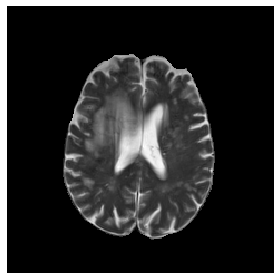

(240, 240)
(240, 240)


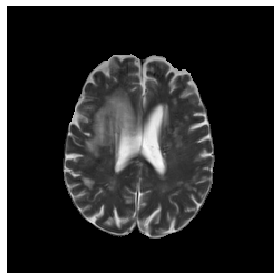

(240, 240)
(240, 240)


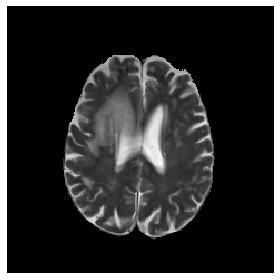

(240, 240)
(240, 240)


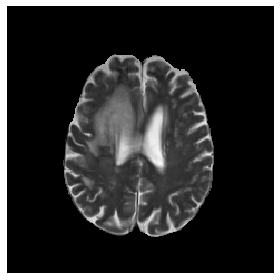

(240, 240)
(240, 240)


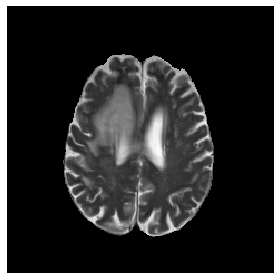

(240, 240)
(240, 240)


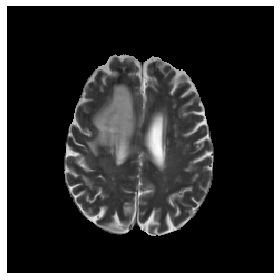

(240, 240)
(240, 240)


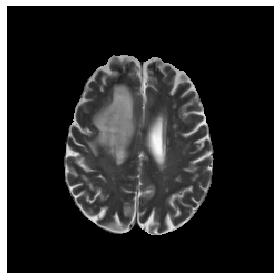

(240, 240)
(240, 240)


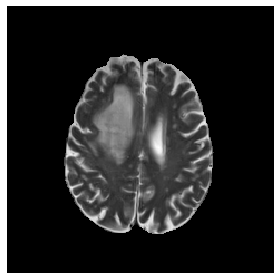

(240, 240)
(240, 240)


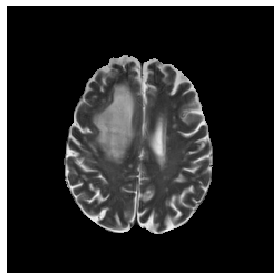

(240, 240)
(240, 240)


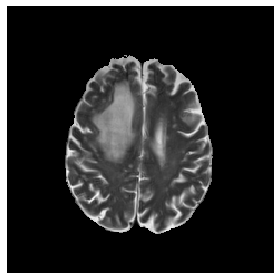

(240, 240)
(240, 240)


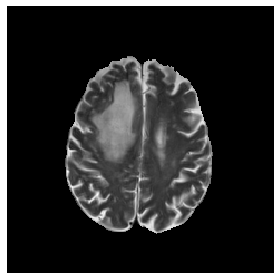

(240, 240)
(240, 240)


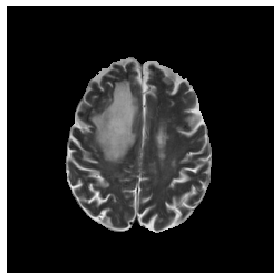

(240, 240)
(240, 240)


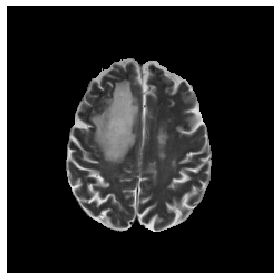

(240, 240)
(240, 240)


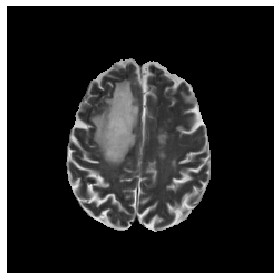

(240, 240)
(240, 240)


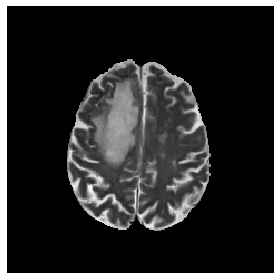

(240, 240)
(240, 240)


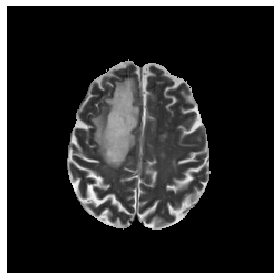

(240, 240)
(240, 240)


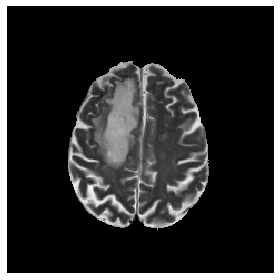

(240, 240)
(240, 240)


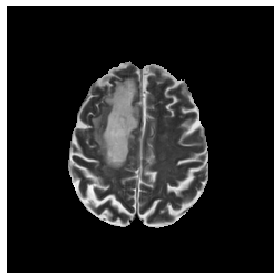

(240, 240)
(240, 240)


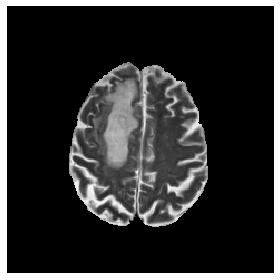

(240, 240)
(240, 240)


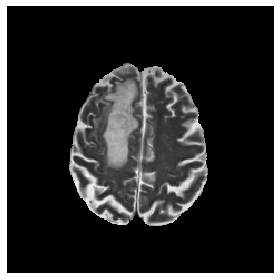

(240, 240)
(240, 240)


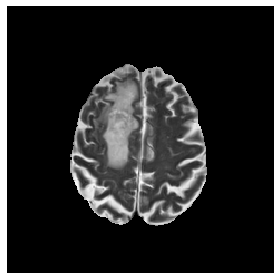

(240, 240)
(240, 240)


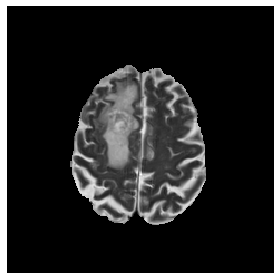

(240, 240)
(240, 240)


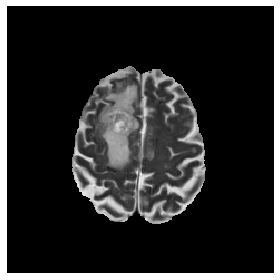

(240, 240)
(240, 240)


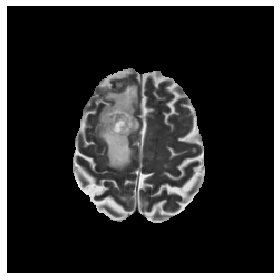

(240, 240)
(240, 240)


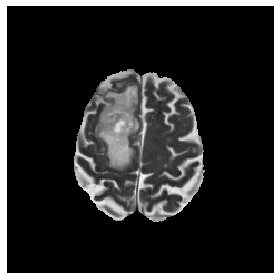

(240, 240)
(240, 240)


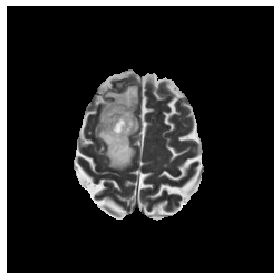

(240, 240)
(240, 240)


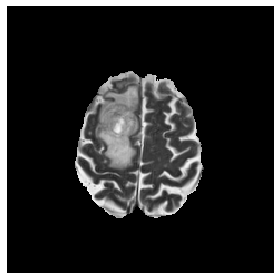

(240, 240)
(240, 240)


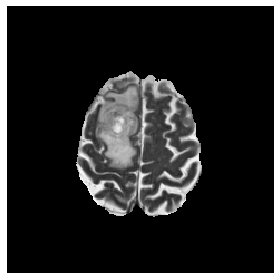

(240, 240)
(240, 240)


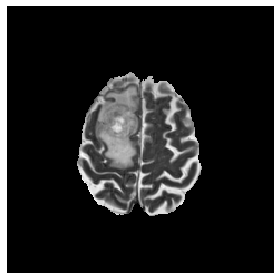

(240, 240)
(240, 240)


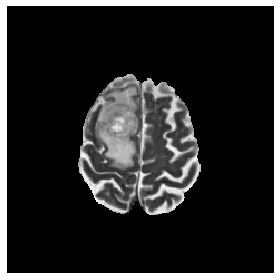

(240, 240)
(240, 240)


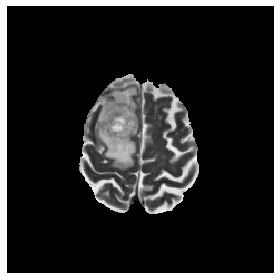

(240, 240)
(240, 240)


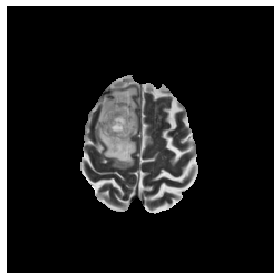

(240, 240)
(240, 240)


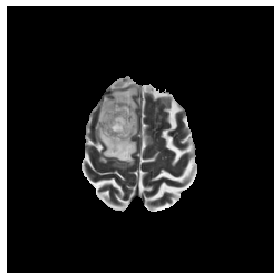

(240, 240)
(240, 240)


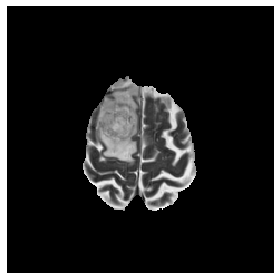

(240, 240)
(240, 240)


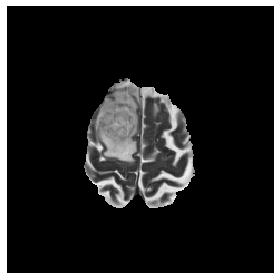

(240, 240)
(240, 240)


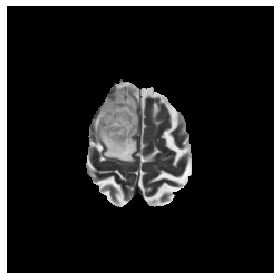

(240, 240)
(240, 240)


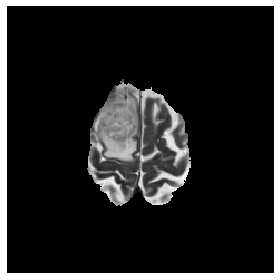

(240, 240)
(240, 240)


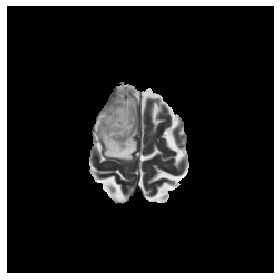

(240, 240)
(240, 240)


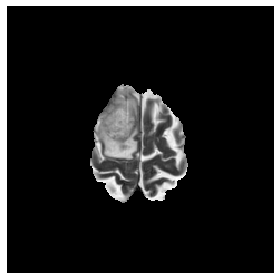

(240, 240)
(240, 240)


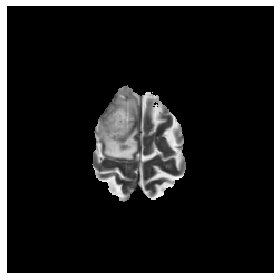

(240, 240)
(240, 240)


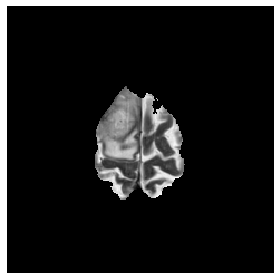

(240, 240)
(240, 240)


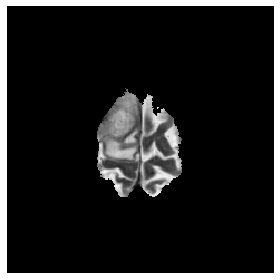

(240, 240)
(240, 240)


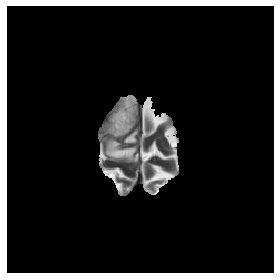

(240, 240)
(240, 240)


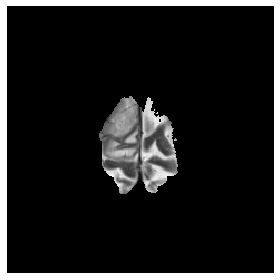

(240, 240)
(240, 240)


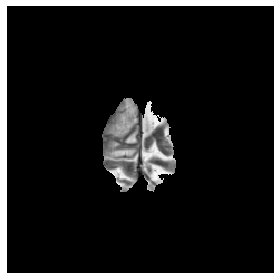

(240, 240)
(240, 240)


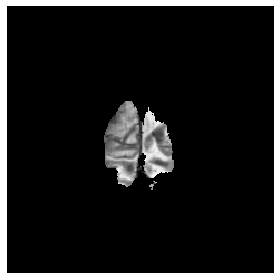

(240, 240)
(240, 240)


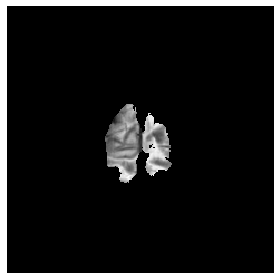

(240, 240)
(240, 240)


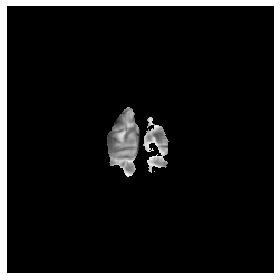

(240, 240)
(240, 240)


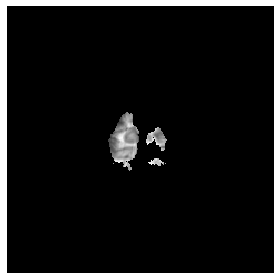

(240, 240)
(240, 240)


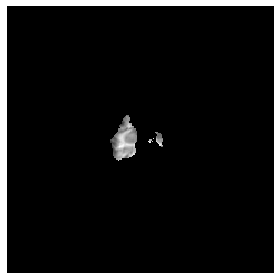

(240, 240)
(240, 240)


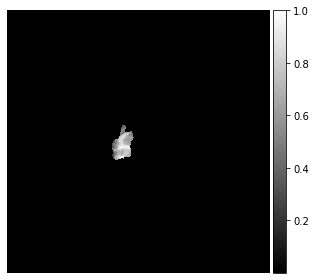

(240, 240)
(240, 240)


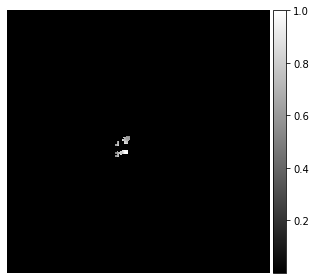

(240, 240)
(240, 240)


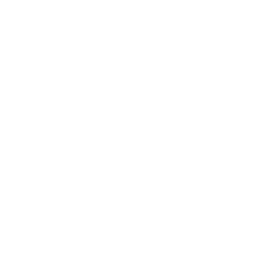

(240, 240)
(240, 240)


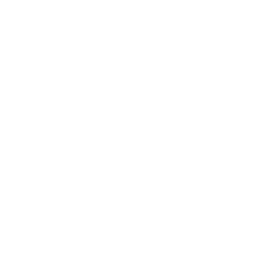

(240, 240)
(240, 240)


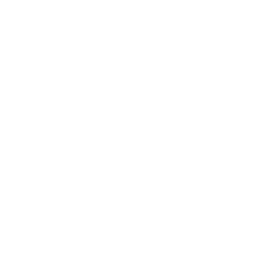

(240, 240)
(240, 240)


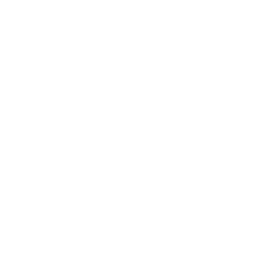

(240, 240)
(240, 240)


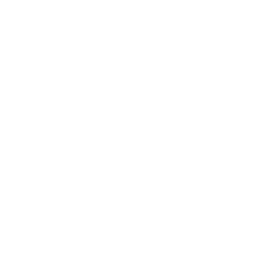

(240, 240)
(240, 240)


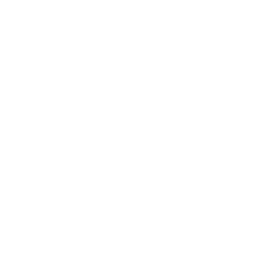

(240, 240)
(240, 240)


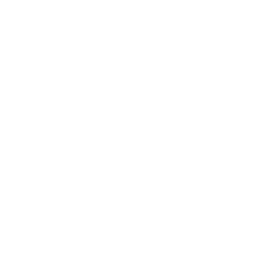

(240, 240)
(240, 240)


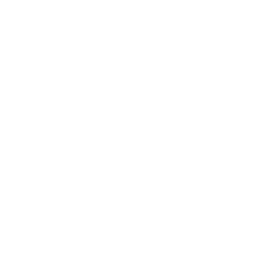

(240, 240)
(240, 240)


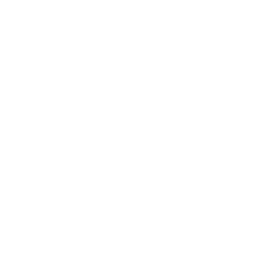

(240, 240)
(240, 240)


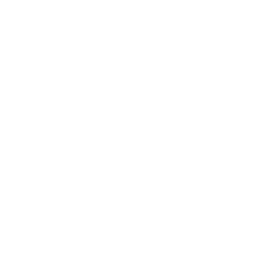

(240, 240)
(240, 240)


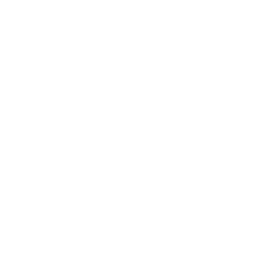

(240, 240)
(240, 240)


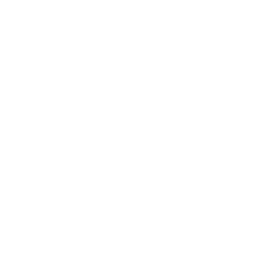

(240, 240)
(240, 240)


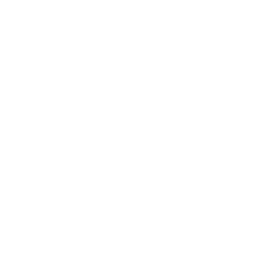

(240, 240)
(240, 240)


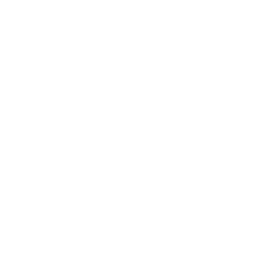

(240, 240)
(240, 240)


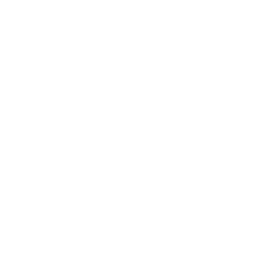

(240, 240)
(240, 240)


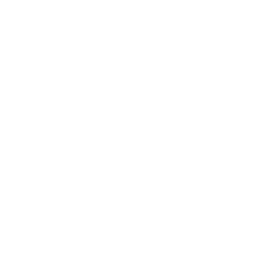

(240, 240)
(240, 240)


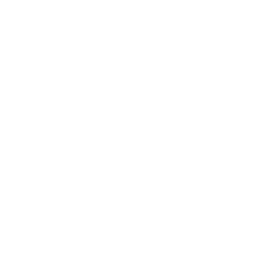

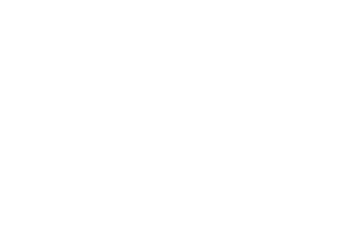

In [ ]:
root_path = '/content/drive/MyDrive/Training_115_Segmentation/T2/Axial/'
path = os.path.join(os.path.join(root_path), 'Brain_MRI')
#path = os.path.join(os.path.join(root_path), 'Prediction_Overlap')

for i in range(155):
  brainMRI = all_modalities[i, :, :, 0]
  #GroundTruth = gt[:,:,i,0]
  Predicted = prediction[i,:,:,0]
  print(brainMRI.shape)
  print(Predicted.shape)
  visualization=show_segmented_image(brainMRI,Predicted)
  i=str(i)
  j = "brain_name" + i + ".jpg"
  path1 = os.path.join(os.path.join(path), j)
  #io.imshow(visualization)
  io.imshow(visualization,cmap="gray")
  fig1 = plt.gcf()
  plt.show()
  plt.draw()
  plt.axis('off')
  #plt.colorbar('off')
  fig1.savefig(path1, bbox_inches='tight', pad_inches = 0)

# Gifs Creation 

In [ ]:
!pip install pillow

In [ ]:
import glob
from PIL import Image

# filepaths
fp_in = "/content/drive/MyDrive/Visualization/Sagittal_View/Prediction/*.jpg"
fp_out = "/content/drive/MyDrive/Sagittal_Prediction.gif"

# https://pillow.readthedocs.io/en/stable/handbook/image-file-formats.html#gif
img, *imgs = [Image.open(f) for f in glob.glob(fp_in)]
img.save(fp=fp_out, format='GIF', append_images=imgs,
         save_all=True, duration=200, loop=0)

In [ ]:
fp_in = "/content/drive/MyDrive/Segmentation/Coronal/Ground_Truth/*.jpg"


In [ ]:
(glob.glob(fp_in))

['/content/drive/MyDrive/Segmentation/Coronal/Ground_Truth/brain_name45.jpg',
 '/content/drive/MyDrive/Segmentation/Coronal/Ground_Truth/brain_name46.jpg',
 '/content/drive/MyDrive/Segmentation/Coronal/Ground_Truth/brain_name47.jpg',
 '/content/drive/MyDrive/Segmentation/Coronal/Ground_Truth/brain_name48.jpg',
 '/content/drive/MyDrive/Segmentation/Coronal/Ground_Truth/brain_name49.jpg',
 '/content/drive/MyDrive/Segmentation/Coronal/Ground_Truth/brain_name50.jpg',
 '/content/drive/MyDrive/Segmentation/Coronal/Ground_Truth/brain_name51.jpg',
 '/content/drive/MyDrive/Segmentation/Coronal/Ground_Truth/brain_name52.jpg',
 '/content/drive/MyDrive/Segmentation/Coronal/Ground_Truth/brain_name53.jpg',
 '/content/drive/MyDrive/Segmentation/Coronal/Ground_Truth/brain_name54.jpg',
 '/content/drive/MyDrive/Segmentation/Coronal/Ground_Truth/brain_name55.jpg',
 '/content/drive/MyDrive/Segmentation/Coronal/Ground_Truth/brain_name56.jpg',
 '/content/drive/MyDrive/Segmentation/Coronal/Ground_Truth/brain